# 1. Preprocessing

In [ ]:
!pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 61.5 MB/s eta 0:00:00


In [ ]:
!pip install pyprep

In [ ]:
!pip install -U autoreject

In [ ]:
import os
import random
from itertools import chain
import numpy as np
import pandas as pd
from scipy import signal
from scipy.interpolate import interp1d
from scipy.special import rel_entr
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.preprocessing import LabelEncoder
from autoreject import AutoReject
import mne
from mne.datasets import sample
from mne.viz import plot_topomap
from pyprep.find_noisy_channels import NoisyChannels
import matplotlib.pyplot as plt
import kagglehub

## I.Introduction

EEG, or electroencephalography, is a technique used to record electrical activity from the brain. It is most commonly performed non-invasively, using electrodes placed on the scalp. However, in certain clinical neurological cases, such as epilepsy, EEG may also be recorded invasively using electrodes placed directly on the surface of the brain.

An EEG system typically employs between 1 and 250 electrodes. Even at the higher end of this range, it is evident that the number of electrodes is far fewer than the estimated 80 billion neurons in the brain. Additionally, the skull serves as a poor conductor of electricity. As a result, the signals captured by EEG represent the aggregated activity of large groups of neurons working together, rather than the activity of individual neurons.

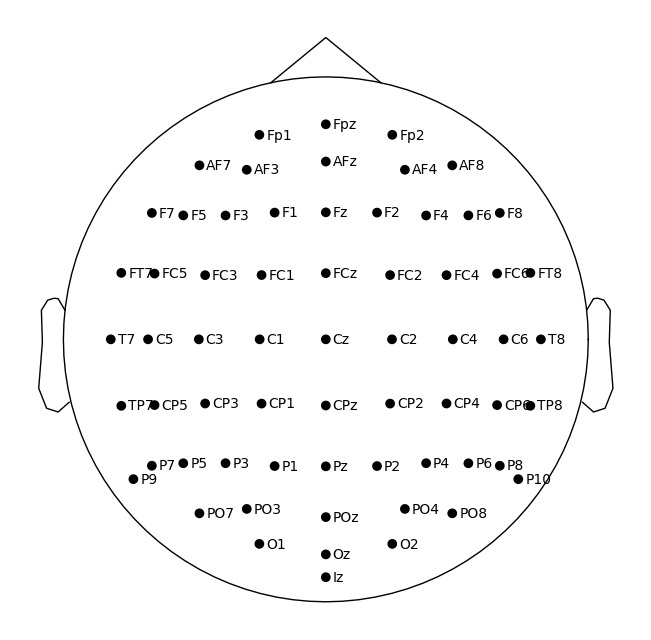

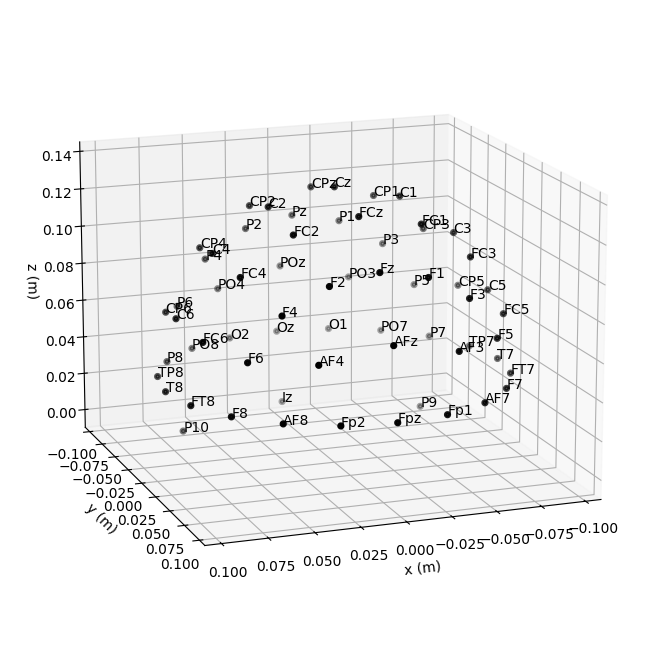

In [ ]:
visualize_montage = mne.channels.make_standard_montage('biosemi64')
visualize_montage.plot()  # 2D
fig = visualize_montage.plot(kind="3d", show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

## II. Extract raw data

In [ ]:
data_root = '../input/eeg-data-for-mental-attention-state-detection/eeg data/EEG Data/'

files = os.listdir(data_root)

mat = scipy.io.loadmat(data_root + files[1])

mat['o']['sampFreq'][0][0][0][0]

data = mat['o']['data'][0, 0]
FS = mat['o']['sampFreq'][0][0][0][0]

data

In [ ]:
channel_indices = np.array(range(3, 17))
channel_names = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
channel_map = dict(zip(channel_names, channel_indices))

In [ ]:
data = []

for subject_idx in range(1, 35):
    states = get_data(f"eeg_record{subject_idx}.mat")

    for state, eeg in states.items():
        num_samples = eeg.shape[0]
        for sample_idx in range(num_samples):
            row = {
                'state': state,
                'subject': f"subject_{subject_idx}",
            }

            for ch_name, ch_idx in channel_map.items():
                row[ch_name] = eeg[sample_idx, ch_idx]
            data.append(row)
df = pd.DataFrame(data)



## III. Import library & download data

In [ ]:
import kagglehub
khoivudang1209_eeg_data_path = kagglehub.dataset_download('khoivudang1209/eeg-data')

print('Data source import complete.')


Data source import complete.


In [ ]:
!ls $khoivudang1209_eeg_data_path

eeg_powers.csv


In [ ]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)


In [ ]:
data = pd.read_csv(f"{khoivudang1209_eeg_data_path}/eeg_powers.csv")

In [ ]:
subjects = [
    'subject_1', 'subject_2', 'subject_8', 'subject_9',
    'subject_15', 'subject_16', 'subject_23', 'subject_24',
    'subject_30', 'subject_31'
]

data = data[~data['subject'].isin(subjects)]

In [ ]:
data = data.drop(data.columns[0], axis=1)

In [ ]:
def pandas_to_mne(df, sfreq, channel_types=None, ch_names=None):
    if ch_names is None:
        ch_names = df.columns.tolist()
    if channel_types is None:
        channel_types = ['eeg'] * len(ch_names)  # Default to 'misc' type channels

    if len(ch_names) != df.shape[1]:
        raise ValueError("Number of channel names must match the number of columns in the DataFrame.")
    if len(channel_types) != len(ch_names):
        raise ValueError("Number of channel types must match the number of channels.")

    data = df.values.T

    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=channel_types)
    raw = mne.io.RawArray(data, info)

    return raw

In [ ]:
encoder = LabelEncoder()

data['state'] = encoder.fit_transform(data['state'])

In [ ]:
subject = 'subject_10'
df = data[data['subject'] == subject]
label_data=df['state']

In [ ]:
df=df.drop(['subject','state'],axis=1)

In [ ]:
df.columns

Index(['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6',
       'F4', 'F8', 'AF4'],
      dtype='object')

In [ ]:
n_channels = 14
n_samples = len(df)
sfreq = 128
raw = pandas_to_mne(df, sfreq)
montage = mne.channels.make_standard_montage('standard_1020')  # Adjust as needed
raw.set_montage(montage)
raw.pick_types(eeg=True)

Creating RawArray with float64 data, n_channels=14, n_times=304540
    Range : 0 ... 304539 =      0.000 ...  2379.211 secs
Ready.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


<RawArray | 14 x 304540 (2379.2 s), ~32.6 MB, data loaded>

## IV. EDA & Data mining

### 1. EDA

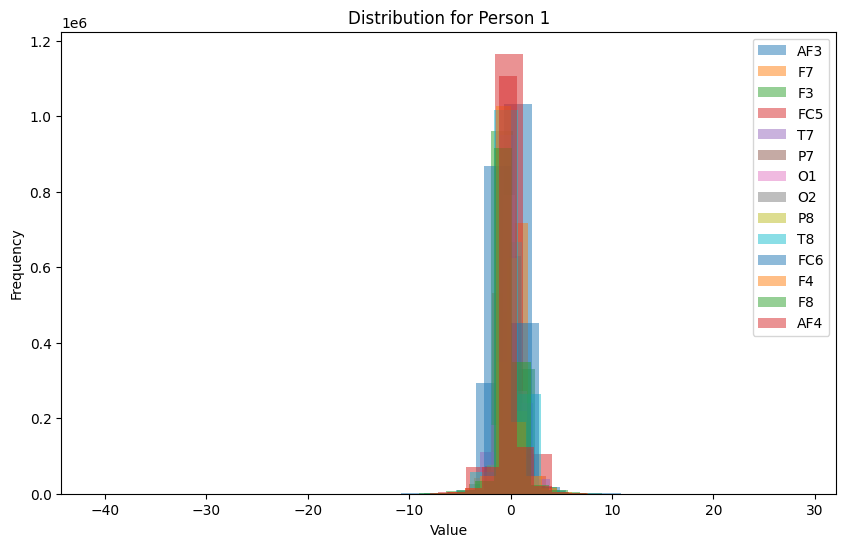

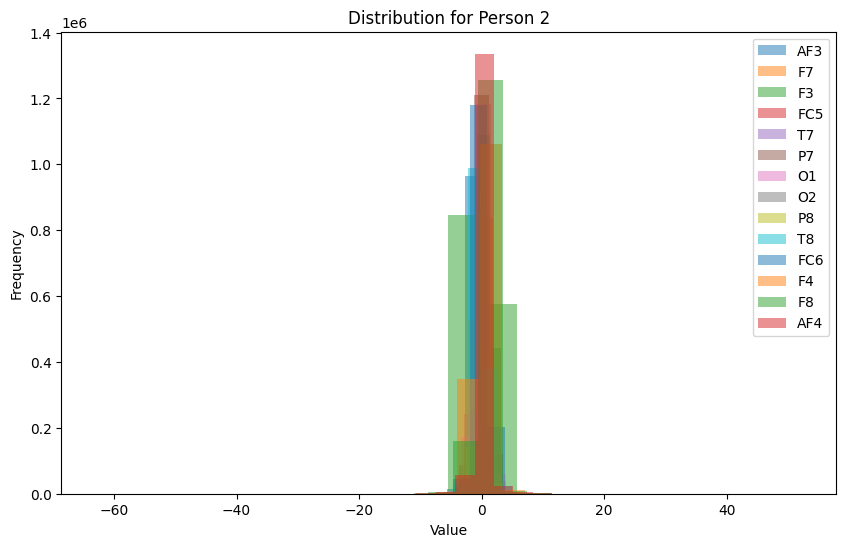

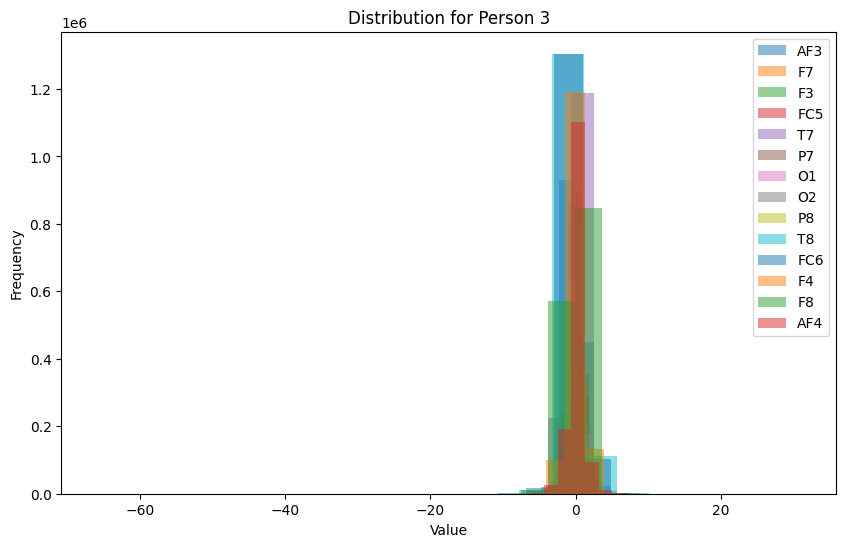

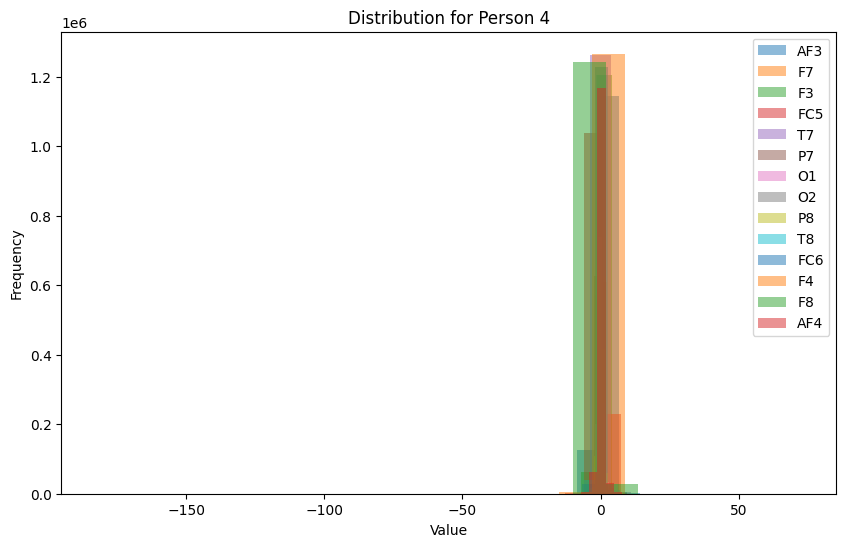

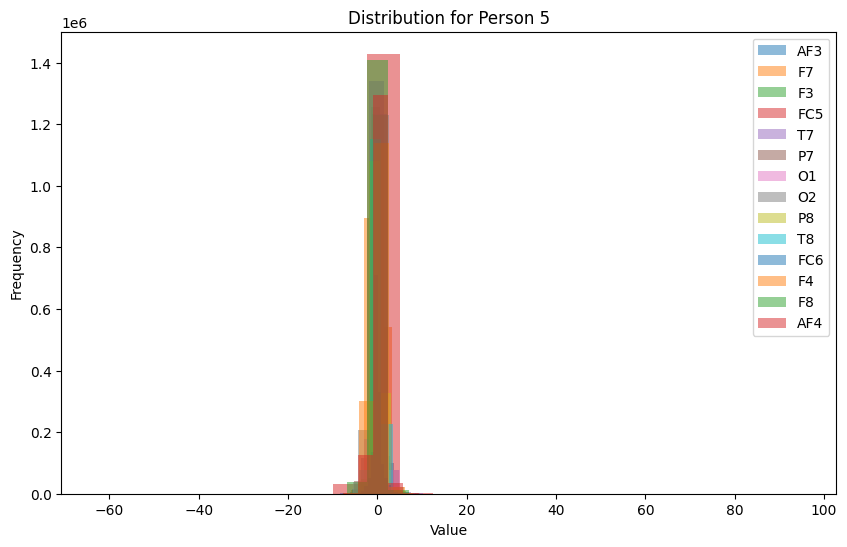

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

for i, group in enumerate(data):
    plt.figure(figsize=(10, 6))

    df_channel = pd.DataFrame()
    for df in group:

        if 'state' in df.columns:
            df = df.drop('state', axis=1)
        df_channel = pd.concat([df_channel, df], ignore_index=True)

    df_channel = (df_channel - df_channel.mean()) / df_channel.std()

    for col in df_channel.columns:
        plt.hist(df_channel[col], bins=20, alpha=0.5, label=col)

    plt.title(f"Distribution for Person {i+1}")
    plt.xlabel("Value")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


The distribution data for each channel per person has the same pattern.

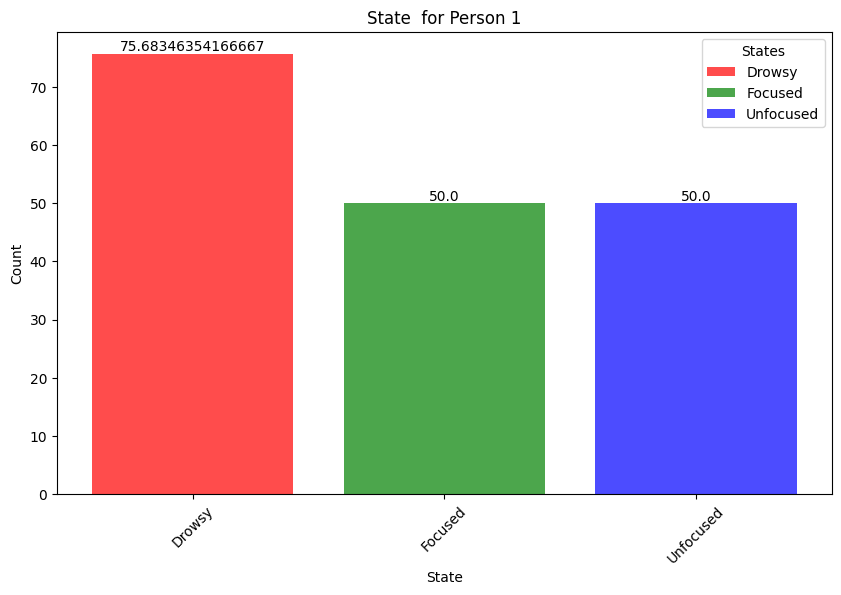

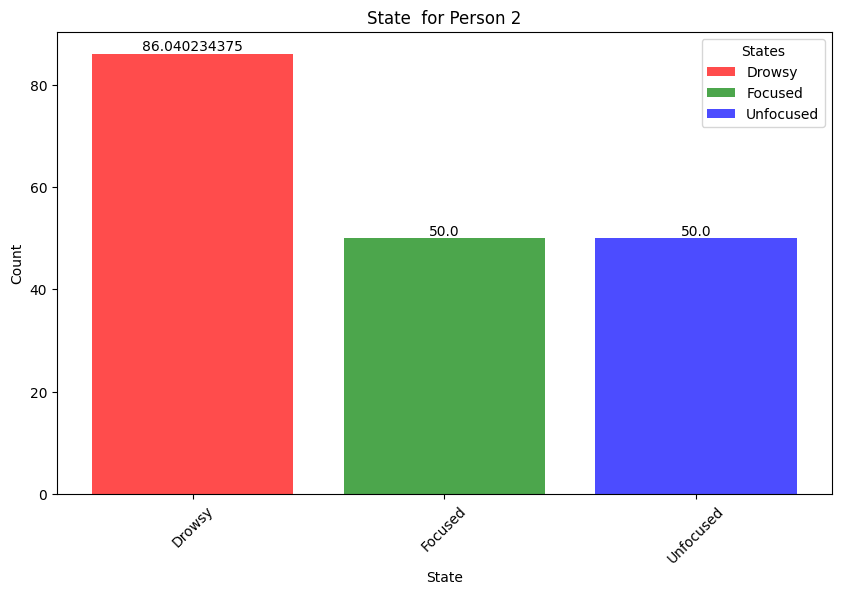

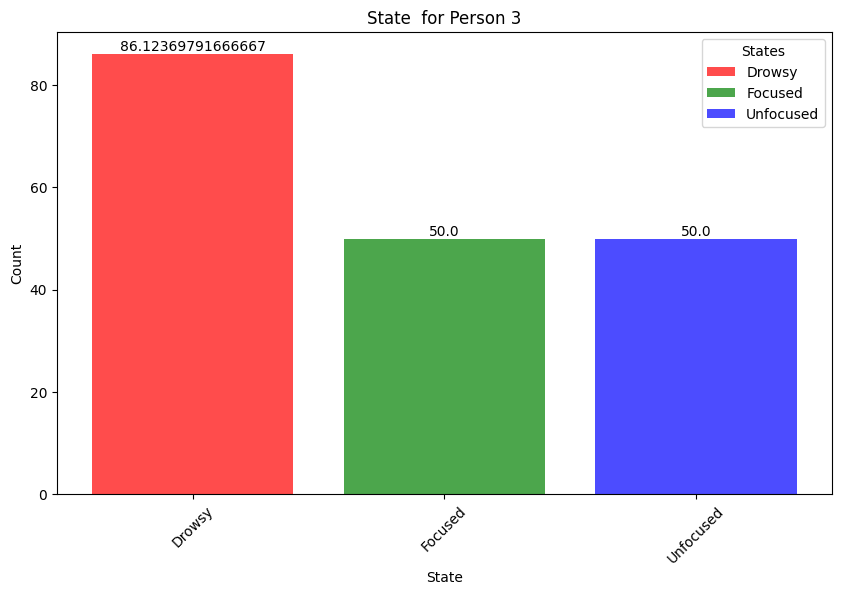

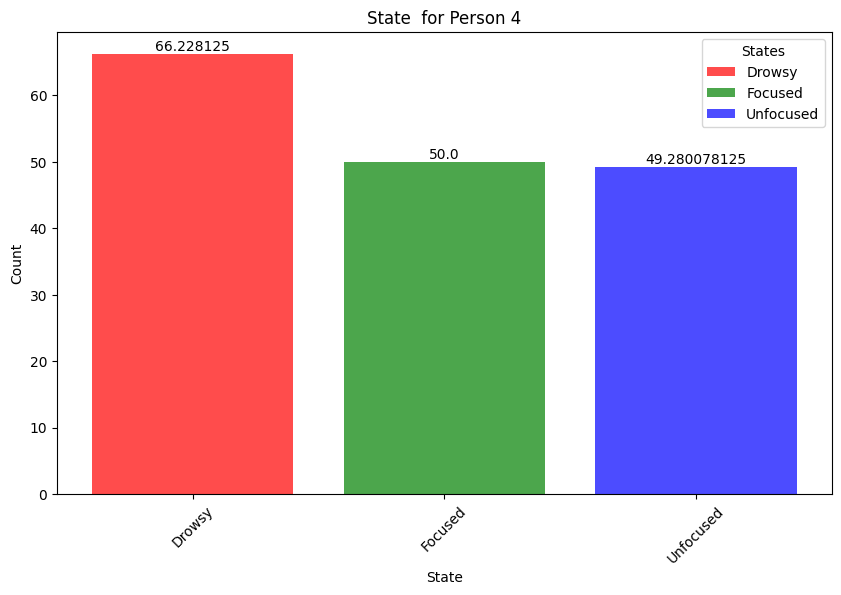

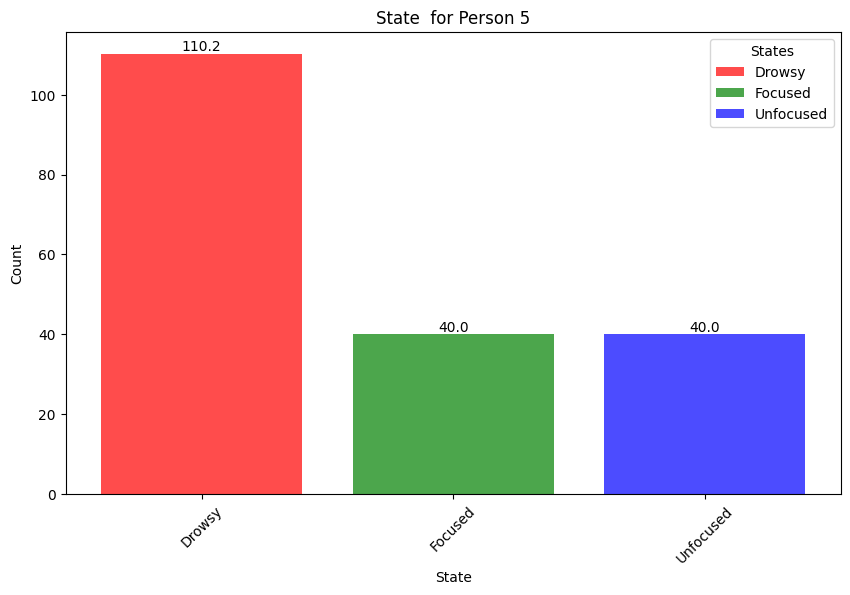

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# State labels
state_labels = {0: "Drowsy", 1: "Focused", 2: "Unfocused"}

for i, group in enumerate(data):
    plt.figure(figsize=(10, 6))

    df_channel = pd.DataFrame()
    for df in group:
        if 'state' in df.columns:
            df_channel = pd.concat([df_channel, df], ignore_index=True)

    state_counts = df_channel['state'].value_counts()/(128*60)

    bars = plt.bar(state_counts.index, state_counts.values, alpha=0.7, color=['red', 'green', 'blue'])

    # Add labels to each bar
    for bar, count in zip(bars, state_counts.values):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            str(count),
            ha='center',
            va='bottom',
            fontsize=10
        )

    plt.legend(
        [bars[0], bars[1], bars[2]],
        [state_labels[0], state_labels[1], state_labels[2]],
        title="States"
    )

    plt.title(f"State  for Person {i+1}")
    plt.xlabel("State")
    plt.ylabel("Count")
    plt.xticks(state_counts.index, [state_labels.get(state, state) for state in state_counts.index], rotation=45)
    plt.show()


Person 5 spent the most time with measured brain waves in the drowsy state compared to other individuals. However, Person 5 has less total time of measured brain waves than others because their data was recorded for only 4 days, one day less than the other individuals.

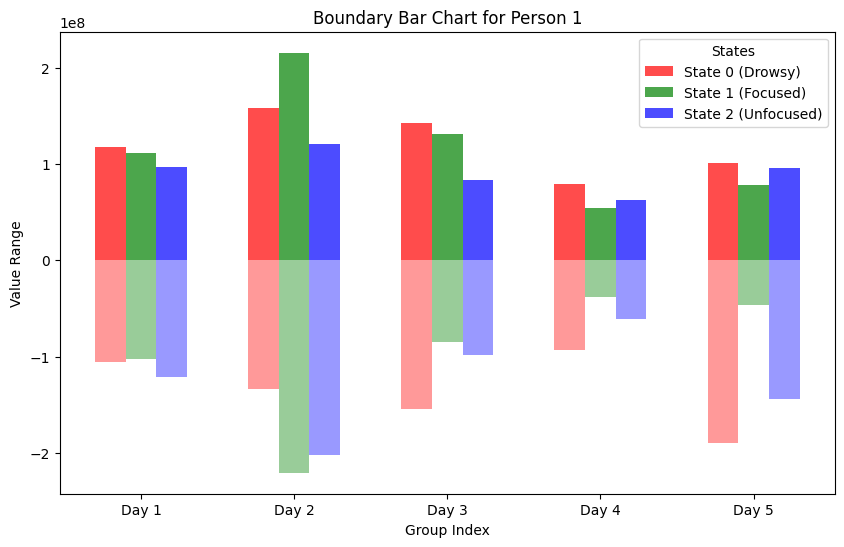

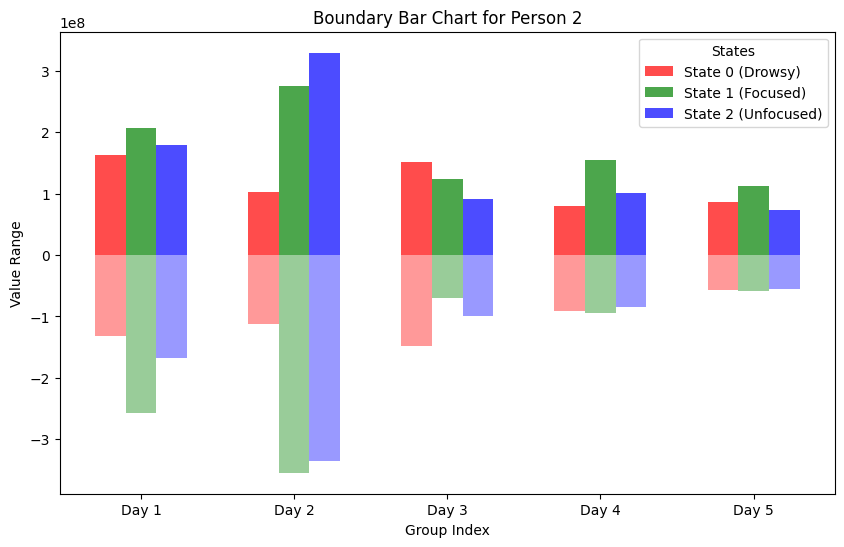

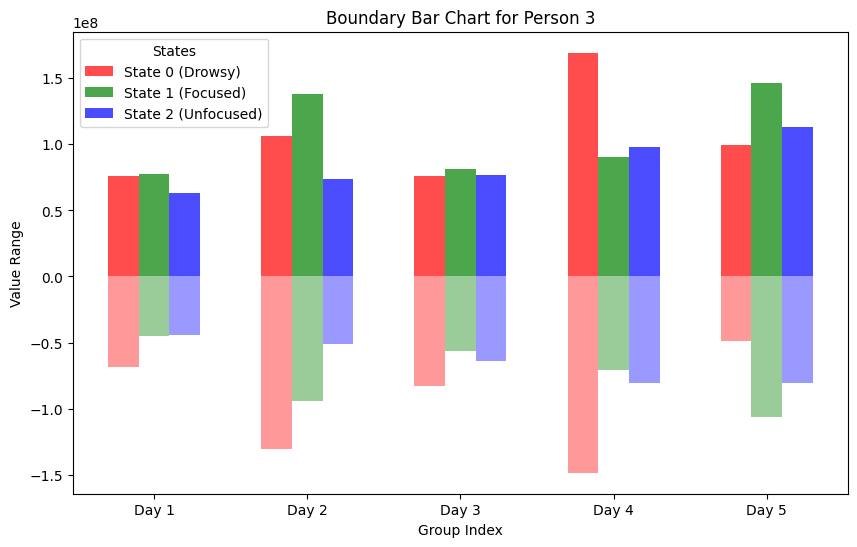

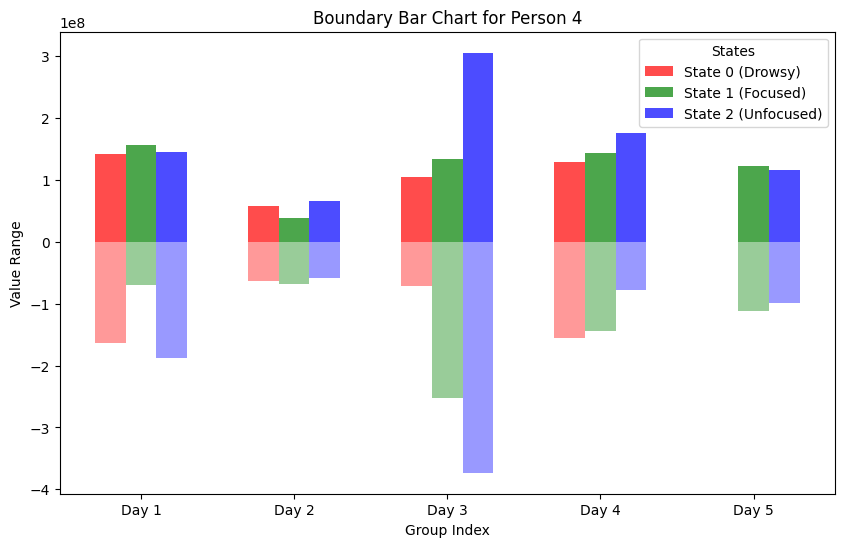

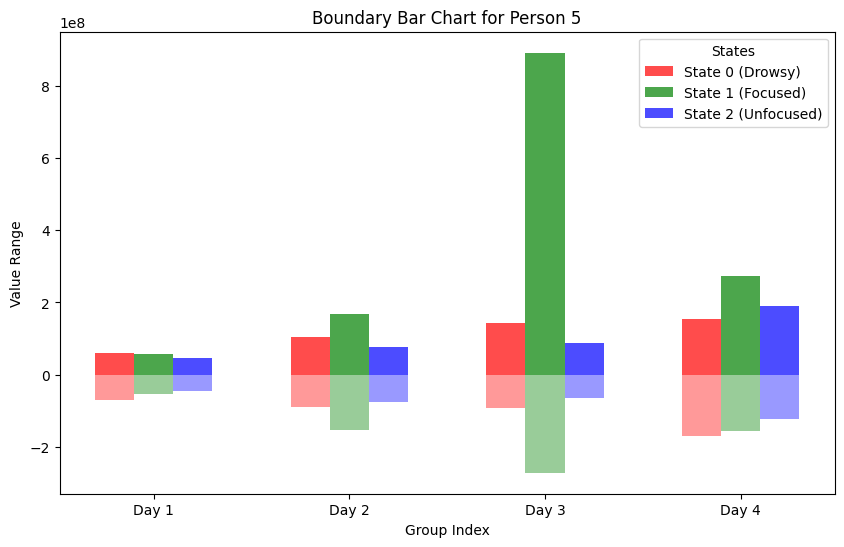

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


for i, group in enumerate(data):
    plt.figure(figsize=(10, 6))

    state_boundaries = {0: [], 1: [], 2: []}

    for df in group:
        if 'state' in df.columns:
            for state in [0, 1, 2]:
                state_data = df[df['state'] == state].drop(columns=['state'], errors='ignore')
                if not state_data.empty:

                    state_min = state_data.min().min()
                    state_max = state_data.max().max()
                    state_boundaries[state].append((state_min, state_max))
                else:

                    state_boundaries[state].append((np.nan, np.nan))

    bar_width = 0.2
    x_positions = np.arange(len(group))


    colors = {0: 'red', 1: 'green', 2: 'blue'}
    labels = {0: "Drowsy", 1: "Focused", 2: "Unfocused"}

    for state, boundaries in state_boundaries.items():
        min_values = [b[0] if not np.isnan(b[0]) else 0 for b in boundaries]
        max_values = [b[1] if not np.isnan(b[1]) else 0 for b in boundaries]

        # Plot bars
        plt.bar(x_positions + state * bar_width, max_values, bar_width,
                label=f"State {state} ({labels[state]})", color=colors[state], alpha=0.7)
        plt.bar(x_positions + state * bar_width, min_values, bar_width,
                color=colors[state], alpha=0.4)

    plt.title(f"Boundary Bar Chart for Person {i+1}")
    plt.xlabel("Group Index")
    plt.ylabel("Value Range")
    plt.xticks(x_positions + bar_width, [f"Day {j+1}" for j in range(len(group))])
    plt.legend(title="States")
    plt.show()



"The range for Person 3 doesn't change much between each day, so the model might work better for Person 3 compared to the other individual."

In [ ]:
df.head()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
2514704,4435.897436,4027.692308,5087.179487,3826.666667,4035.384615,4404.102564,4366.666667,4125.641026,4217.435897,4308.205128,4142.564103,4283.589744,4334.871795,4158.974359
2514705,4437.948718,4028.717949,5085.128205,3818.974359,4035.897436,4404.615385,4368.717949,4125.128205,4218.974359,4308.717949,4140.512821,4283.589744,4334.871795,4151.794872
2514706,4440.512821,4034.871795,5090.256410,3815.384615,4035.384615,4413.846154,4369.743590,4136.923077,4227.179487,4308.717949,4142.564103,4283.589744,4333.846154,4156.923077
2514707,4441.538462,4028.717949,5088.205128,3820.512821,4034.871795,4405.641026,4367.179487,4131.794872,4220.000000,4308.205128,4143.076923,4283.589744,4334.871795,4155.384615
2514708,4440.000000,4019.487179,5077.435897,3825.641026,4036.923077,4391.794872,4365.641026,4117.948718,4212.307692,4308.205128,4137.435897,4283.589744,4335.384615,4147.179487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2819239,4437.948718,3967.692308,5052.307692,3828.717949,4035.384615,4304.102564,4324.102564,4037.435897,4091.794872,4304.102564,4118.461538,4283.589744,4334.871795,4176.923077
2819240,4434.871795,3957.435897,5040.512821,3832.820513,4036.410256,4295.897436,4317.435897,4023.589744,4083.076923,4304.615385,4210.256410,4283.076923,4335.897436,4166.666667
2819241,4436.923077,3957.435897,5036.410256,3830.769231,4035.897436,4294.871795,4315.384615,4022.051282,4073.846154,4304.102564,4236.923077,4283.589744,4333.846154,4166.153846
2819242,4436.410256,3956.923077,5037.948718,3830.256410,4037.948718,4295.384615,4314.871795,4027.692308,4078.461538,4304.102564,4223.076923,4283.589744,4332.820513,4167.179487


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 304540 entries, 2514704 to 2819243
Data columns (total 14 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   AF3     304540 non-null  float64
 1   F7      304540 non-null  float64
 2   F3      304540 non-null  float64
 3   FC5     304540 non-null  float64
 4   T7      304540 non-null  float64
 5   P7      304540 non-null  float64
 6   O1      304540 non-null  float64
 7   O2      304540 non-null  float64
 8   P8      304540 non-null  float64
 9   T8      304540 non-null  float64
 10  FC6     304540 non-null  float64
 11  F4      304540 non-null  float64
 12  F8      304540 non-null  float64
 13  AF4     304540 non-null  float64
dtypes: float64(14)
memory usage: 34.9 MB


In [ ]:
df.describe()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
count,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000,304540.000000
mean,4437.967246,3976.470002,5035.915173,3827.566266,4036.232751,4319.753106,4284.376762,4039.426341,4157.667909,4307.575708,4141.749101,4282.645160,4334.666470,4130.160481
std,2.204611,38.185845,57.585140,2.543644,1.810403,48.838867,64.692979,55.136835,49.219884,2.143473,5.192763,1.130800,1.195119,52.848392
min,4389.230769,3750.769231,4633.846154,3795.384615,4016.410256,3985.641026,3909.743590,3671.794872,3846.153846,4294.358974,3954.358974,4261.538462,4311.282051,3735.897436
25%,4436.410256,3960.512821,5018.461538,3826.153846,4034.871795,4302.564103,4262.564103,4018.974359,4135.897436,4306.666667,4140.512821,4282.051282,4334.358974,4111.282051
50%,4437.948718,3977.435897,5041.538462,3827.692308,4035.897436,4327.179487,4283.589744,4042.051282,4154.871795,4308.205128,4141.538462,4282.564103,4334.871795,4136.923077
75%,4439.487179,3994.871795,5062.564103,3829.230769,4036.923077,4347.179487,4310.256410,4062.564103,4175.384615,4308.205128,4143.076923,4283.076923,4335.384615,4155.897436
max,4490.769231,4280.512821,5267.692308,3838.461538,4053.333333,4573.846154,4695.897436,4386.153846,4475.384615,4342.051282,4372.820513,4304.615385,4350.769231,4832.307692


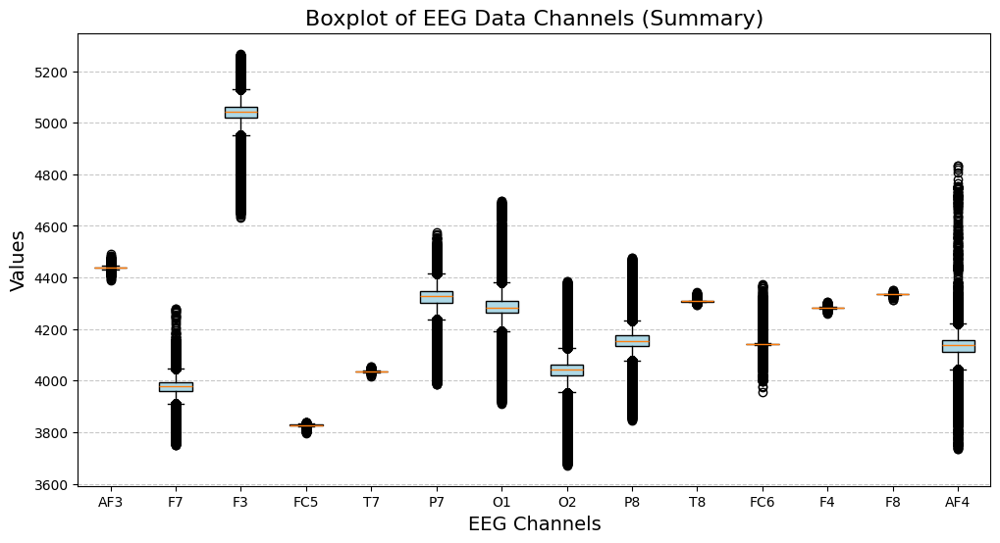

In [ ]:
summary_stats = df.describe(percentiles=[0.25, 0.5, 0.75]).T
summary_stats['iqr'] = summary_stats['75%'] - summary_stats['25%']

fig, ax = plt.subplots(figsize=(12, 6))
ax.boxplot([df[col] for col in df.columns], labels=df.columns, patch_artist=True,
           boxprops=dict(facecolor="lightblue"))

plt.title("Boxplot of EEG Data Channels (Summary)", fontsize=16)
plt.ylabel("Values", fontsize=14)
plt.xlabel("EEG Channels", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Observations

Channel Variability:
- Channels such as 'AF4', 'O1', 'O2', and 'F7' have a broader range of values (taller boxes and longer whiskers) compared to channels like 'T7' and 'T8', which have more tightly clustered values.
- This suggests that certain channels are capturing more variable brain activity than others.

Outliers:
- Most channels show a significant number of outliers (black dots), indicating that some data points deviate substantially from the main distribution.
- Channels like 'AF4' and 'O2' have particularly prominent outliers.

Median Value Differences:
- The median values differ across channels, reflecting variations in the baseline activity levels recorded by different electrodes. For instance: Channels like 'AF3', 'F7', and 'AF4' have higher medians compared to 'T7' and 'T8'.

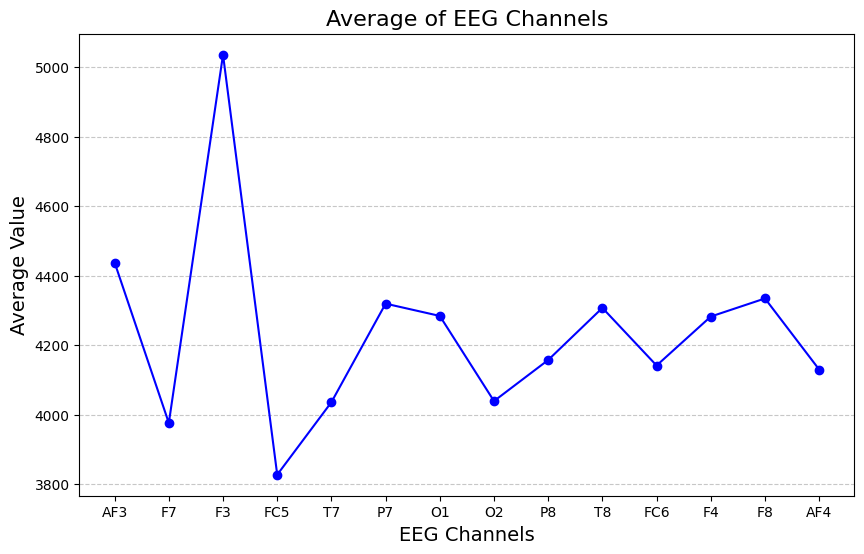

In [ ]:
column_means = df.mean()

plt.figure(figsize=(10, 6))
plt.plot(df.columns, column_means, marker='o', linestyle='-', color='b')

plt.title("Average of EEG Channels", fontsize=16)
plt.ylabel("Average Value", fontsize=14)
plt.xlabel("EEG Channels", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Observations

Channel with the Highest Average (F7):

- The F7 channel stands out with the highest average value (around 5000). This indicates that this electrode recorded higher signal intensities on average compared to others.

Channel with the Lowest Average (FC5):

- The FC5 channel shows the lowest average value (approximately 3800). This means that the signals from this channel were consistently lower than those of other channels.

Fluctuations Across Channels:

- The average values vary significantly across channels, reflecting differences in signal intensity recorded from various scalp locations.

- For example, channels like 'AF3', 'P7', 'O1', and 'O2' show intermediate average values, while channels like 'T8' and 'FC6' are on the lower end.

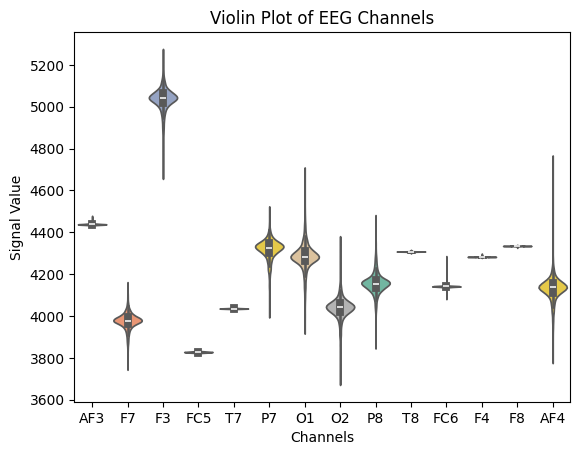

In [ ]:
downsampled_df = df.iloc[::100]

sns.violinplot(data=downsampled_df, palette="Set2")
plt.title("Violin Plot of EEG Channels")
plt.xlabel("Channels")
plt.ylabel("Signal Value")
plt.show()

Observations

Wide Distribution in Some Channels: Channels such as F7, O1, O2, P8, and AF4 have larger and more spread-out violins, indicating a higher variability in signal values.

Tighter Distributions: Channels like T7, T8, F4, and FC6 show much tighter violins, suggesting lower variability and more consistent signal values.

Differences in Medians: The medians (white dots) differ across channels, with F7 having the highest median (around 5000) and FC5 the lowest median (around 3800).

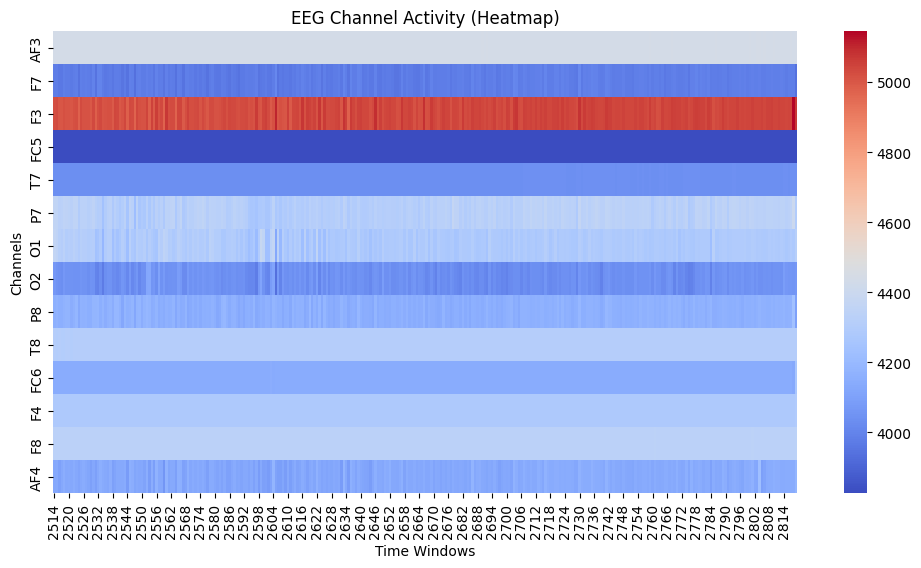

In [ ]:
aggregated_df = df.groupby(df.index // 1000).mean()

plt.figure(figsize=(12, 6))
sns.heatmap(aggregated_df.T, cmap="coolwarm", cbar=True)
plt.title("EEG Channel Activity (Heatmap)")
plt.xlabel("Time Windows")
plt.ylabel("Channels")
plt.show()

Observations

High Activity Regions:

AF3 Channel:
- Displays consistently high activity across the time windows (dominated by red hues).
- Indicates sustained neural activity in the left frontal region, possibly related to tasks involving attention, decision-making, or motor planning.

Moderate to Low Activity Regions:

Most other channels (e.g., T7, P7, P8, FC6, etc.):
- Show lower amplitudes (light blue or blue hues) throughout the time period.
- Suggests less activation in these areas or baseline brain activity.

Channel Variability:

Some channels (e.g., F3, F7, FC5):
- Show fluctuations in activity across time windows, with alternating bursts of red and blue.
- This may indicate periodic engagement or responses to stimuli/events during the recording.

Overall Trend:
There is a clear dominance of AF3 in terms of activity, while the other channels remain less active or more stable over time.

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >], dtype=object)

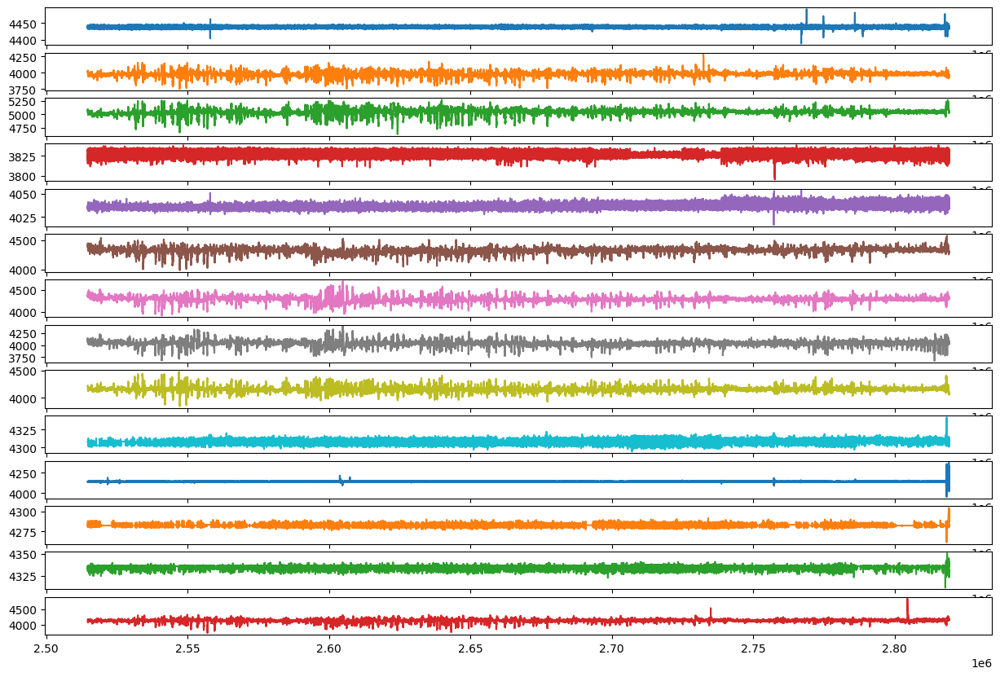

In [ ]:
df.plot(subplots=True, figsize=(15, 10), legend=False)

Observations
- Time Range (X-axis):
  - The X-axis appears to represent a consistent time range across all subplots. This indicates a common temporal reference for all series.
- Amplitude Variations (Y-axis):
  - Each subplot has a distinct amplitude range on the Y-axis, showing varying magnitudes for the observed variables.
  - Some variables remain relatively stable, while others exhibit greater fluctuation or noise.

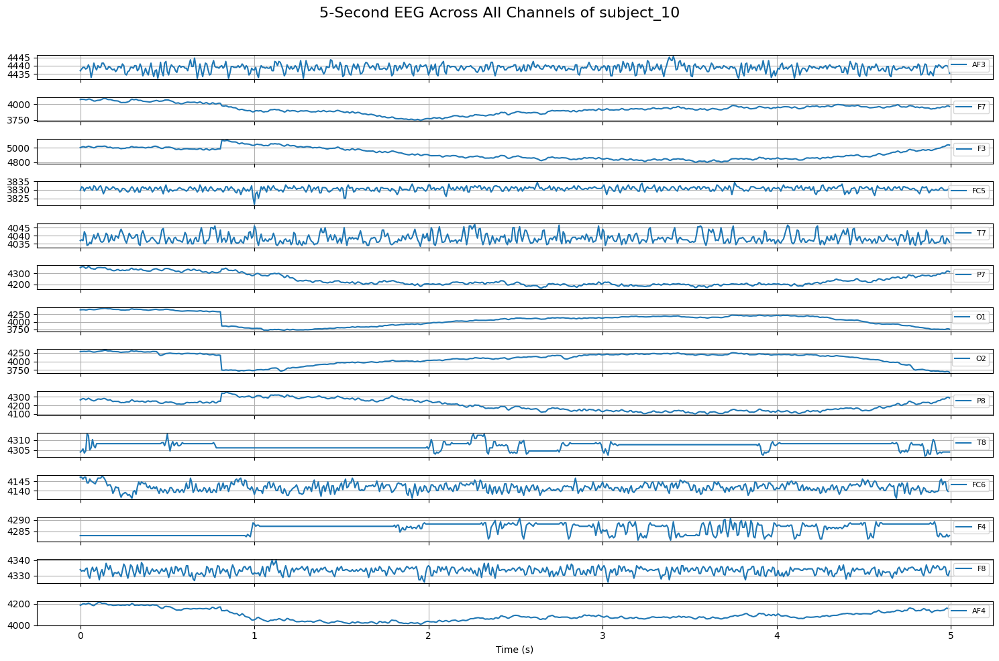

In [ ]:
sampling_rate = 128
time_window = 5
samples_per_window = sampling_rate * time_window
subject = 'subject_10'

channel_names = [col for col in df.columns]

segment = df.iloc[:samples_per_window]

fig, axes = plt.subplots(len(channel_names), 1, figsize=(15, 10), sharex=True)
fig.suptitle(f"{time_window}-Second EEG Across All Channels of {subject}", fontsize=16)

for idx, channel in enumerate(channel_names):
    time_axis = [t / sampling_rate for t in range(len(segment))]
    axes[idx].plot(time_axis, segment[channel], label=channel)
    axes[idx].grid(True)
    axes[idx].legend(loc="upper right", fontsize=8)

axes[-1].set_xlabel("Time (s)")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Observations

Signal Amplitude:
Different channels have varying ranges of signal amplitude. For instance, channels like F7 and O1 show signals with distinct and higher amplitude variability compared to others like T7 or FC6, which are more stable.

Overall Signal Trends:
Some channels, like O1 and O2, display gradual declining trends over the observed time period. In contrast, F7 and F3 seem to have consistent or slight upward trends.

Noise and Variability: Channels such as T8 and FC6 exhibit more frequent fluctuations, possibly indicating noise or high-frequency components in the signal. Channels like F4 and P7 seem to have relatively smoother signals, with fewer spikes.

Sudden Signal Jumps: In channels like P7 and O2, there are abrupt signal changes, suggesting either artifacts (e.g., movement, muscle activity) or specific neural activity patterns. These jumps can indicate external interference or transient brain activity.

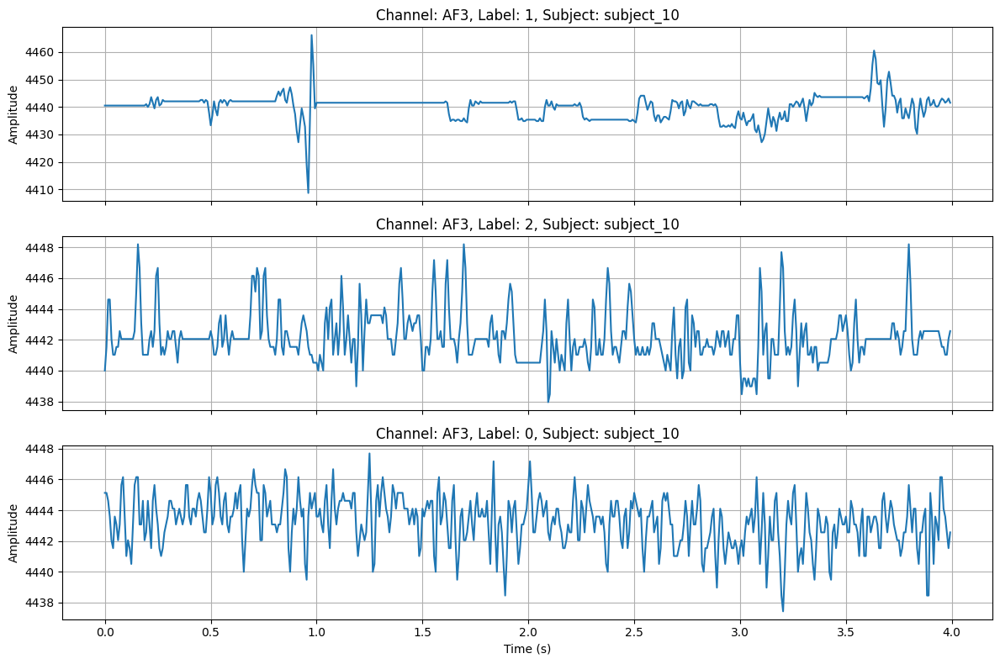

In [ ]:
sampling_rate = 128
channel_name = 'AF3'
time_window = 4
samples_per_window = sampling_rate * time_window
subject = 'subject_10'

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
labels = data['state'].unique()

for idx, label in enumerate(labels):
    label_data = data[data['state'] == label]
    segment = label_data[channel_name].iloc[:samples_per_window]
    time_axis = [t / sampling_rate for t in range(len(segment))]

    axes[idx].plot(time_axis, segment)
    axes[idx].set_title(f"Channel: {channel_name}, Label: {label}, Subject: {subject}")
    axes[idx].set_ylabel("Amplitude")
    axes[idx].grid(True)

axes[-1].set_xlabel("Time (s)")
plt.tight_layout()
plt.show()

Plot 1 (Label: 1):

Amplitude: Ranges between 4410 and 4460, with some sharp spikes, particularly noticeable around 1.8s.

Signal Characteristics:
- The signal is largely flat or shows minimal variation in some parts (e.g., 0–1s and 2–4s), suggesting a relatively low neural activity baseline or artifact.
- However, sharp spikes and dips (e.g., at 1.8s) indicate either sudden neural events or transient artifacts.

Plot 2 (Label: 2):

Amplitude: Ranges between 4438 and 4448. The variability is moderate.

Signal Characteristics:
- The signal is more oscillatory and exhibits frequent moderate peaks and troughs, with fluctuations occurring more evenly throughout the time span.
- Compared to the first plot, this signal appears to represent a more active neural state or condition.

Plot 3 (Label: 0):

Amplitude: Similar to Plot 2, ranging between 4438 and 4448. The variability is also moderate.
Signal Characteristics:
- The oscillations in this signal are relatively more dense and continuous compared to Plot 2, with fewer flat regions.
- The signal appears noisier or contains more high-frequency components, indicating increased neural or experimental activity.

### 3. Stationary and non-stationary

A stationary time series shows a consistent pattern without any trend, seasonality, or other structural changes, while a time series with non-stationary status has statistical features that change with time Stationary means each observation is independent of the others, which means the value of a data point at one time does not depend on the value of the data point at any other time.

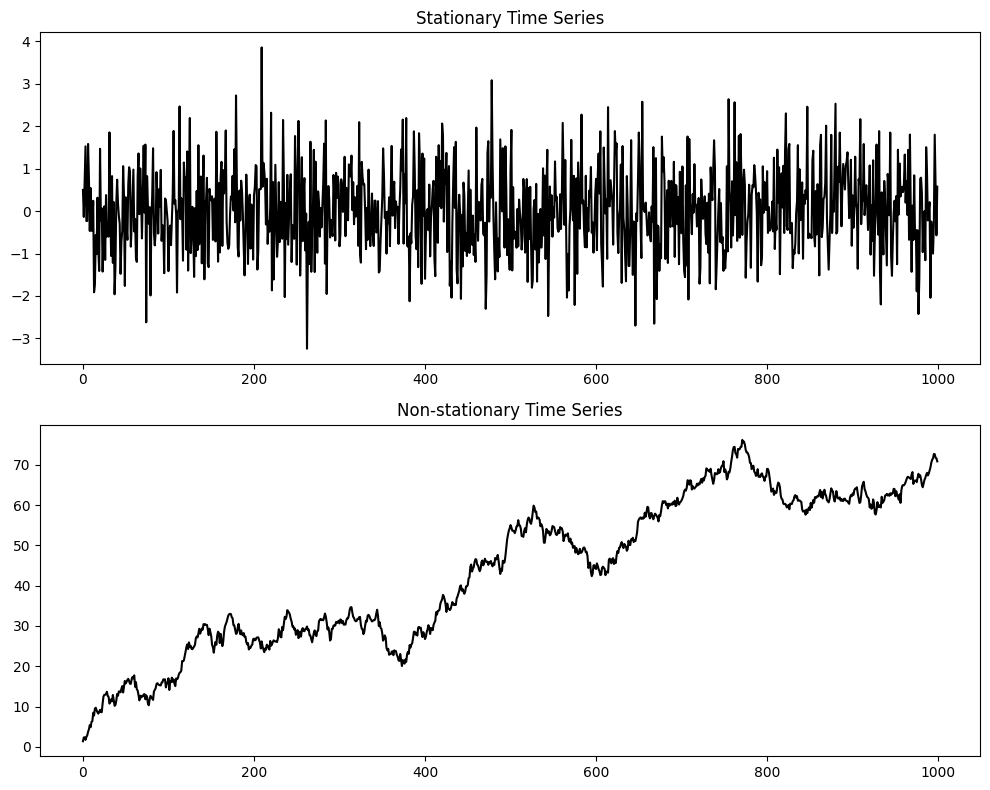

In [ ]:
np.random.seed(42)
stationary = np.random.normal(0, 1, 1000)
non_stationary = np.cumsum(np.random.normal(0, 1, 1000))
plt.figure(figsize=(10, 8))

plt.subplot(2, 1, 1)
plt.plot(stationary, color='black')
plt.title("Stationary Time Series")
plt.grid(False)

plt.subplot(2, 1, 2)
plt.plot(non_stationary, color='black')
plt.title("Non-stationary Time Series")
plt.grid(False)

plt.tight_layout()
plt.show()

### 4. High frequency and low frequency

In [ ]:
def get_fft(snippet, sampling_rate=128.0):
    n = len(snippet)
    k = np.arange(n)
    T = n / sampling_rate
    frq = k / T
    frq = frq[:n // 2]

    Y = np.fft.fft(snippet) / n
    magnitude = np.abs(Y[:n // 2])
    magnitude[0] = 0

    return frq, Y, magnitude

In [ ]:
frq, Y, magnitute = get_fft(df['AF3'])

In [ ]:
sampling_rate = 128
t = np.linspace(0, 1, sampling_rate, endpoint=False)

low_freq_idx = [idx for idx, freq in enumerate(frq) if freq < 1]
high_freq_idx = [idx for idx, freq in enumerate(frq) if freq > 40]

low_freq_fft = np.zeros_like(Y, dtype=complex)
high_freq_fft = np.zeros_like(Y, dtype=complex)

low_freq_fft[low_freq_idx] = Y[low_freq_idx]
high_freq_fft[high_freq_idx] = Y[high_freq_idx]

low_freq_reconstructed = np.fft.ifft(low_freq_fft * len(t)).real
high_freq_reconstructed = np.fft.ifft(high_freq_fft * len(t)).real

KL divergence is a non-symmetric metric that measures the relative entropy or difference in information represented by two distributions. It can be thought of as measuring the distance between two data distributions showing how different the two distributions are from each other.

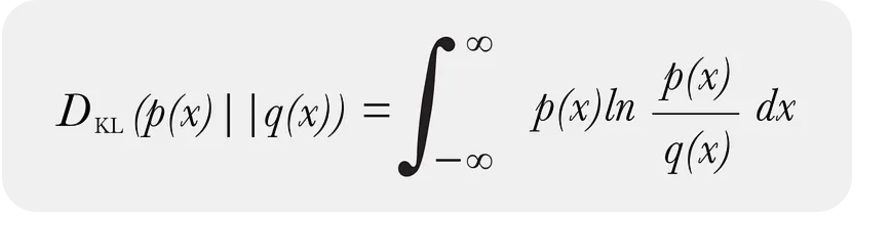

In [ ]:
def kl_divergence(signal1, signal2):
    p = np.abs(signal1) / np.sum(np.abs(signal1))
    q = np.abs(signal2) / np.sum(np.abs(signal2))

    epsilon = 1e-10
    p = np.clip(p, epsilon, None)
    q = np.clip(q, epsilon, None)

    kl_div = np.sum(rel_entr(p, q))
    return kl_div

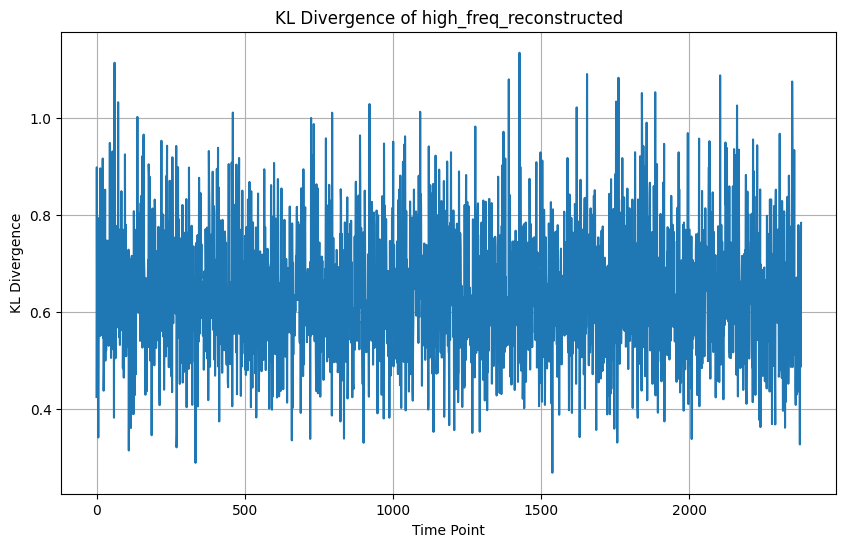

In [ ]:
kl_values = [kl_divergence(high_freq_reconstructed[:128], high_freq_reconstructed[i:i+128]) for i in range(128, len(high_freq_reconstructed) -128, 128)]
time_points = range(len(kl_values))

plt.figure(figsize=(10, 6))
plt.plot(time_points, kl_values)
plt.xlabel("Time Point")
plt.ylabel("KL Divergence")
plt.title("KL Divergence of high_freq_reconstructed")
plt.grid(True)
plt.show()

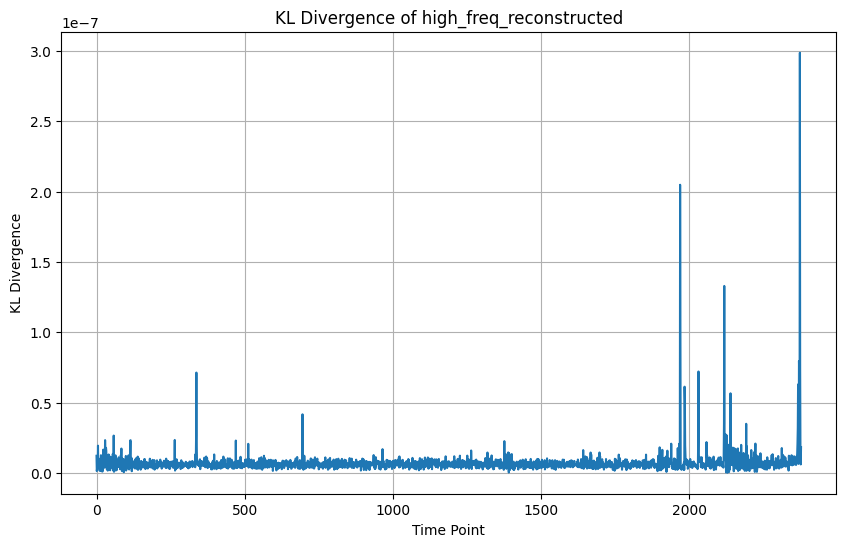

In [ ]:
kl_values = [kl_divergence(low_freq_reconstructed[:128], low_freq_reconstructed[i:i+128]) for i in range(128, len(high_freq_reconstructed) -128, 128)]
time_points = range(len(kl_values))

plt.figure(figsize=(10, 6))
plt.plot(time_points, kl_values)
plt.xlabel("Time Point")
plt.ylabel("KL Divergence")
plt.title("KL Divergence of high_freq_reconstructed")
plt.grid(True)
plt.show()

Autocorrelation measures the degree of similarity between a given time series and the lagged version of that time series over successive time periods. We calculate the correlation between two different versions Xt and Xt-k of the same time series.

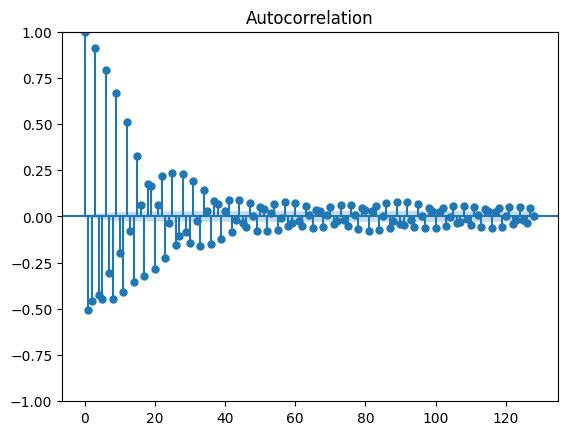

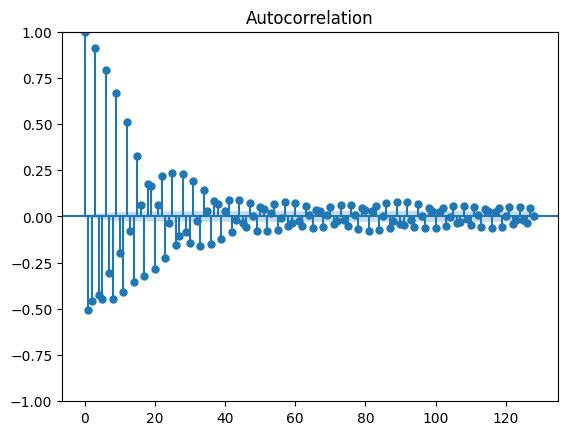

In [ ]:
plot_acf(high_freq_reconstructed[:128*60*6],lags=128)

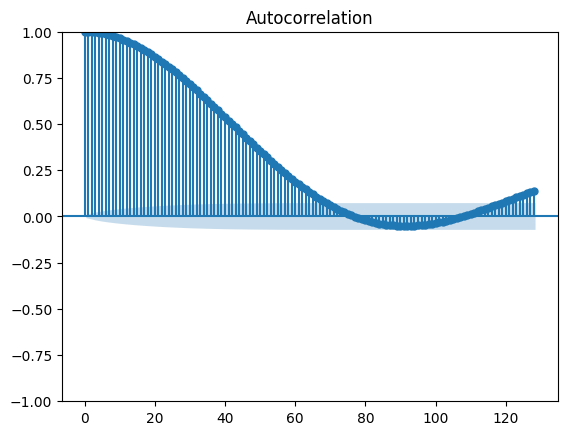

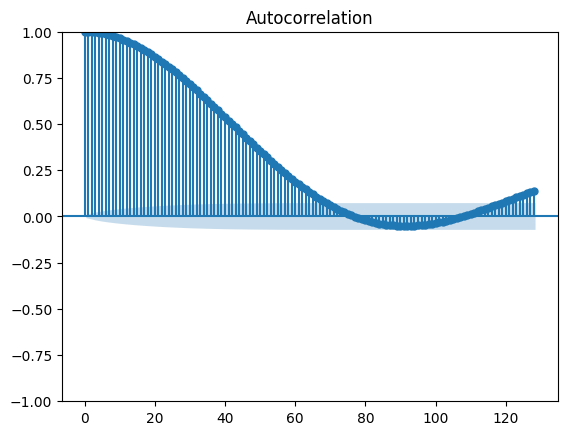

In [ ]:
plot_acf(low_freq_reconstructed[:128*60*6],lags=128)

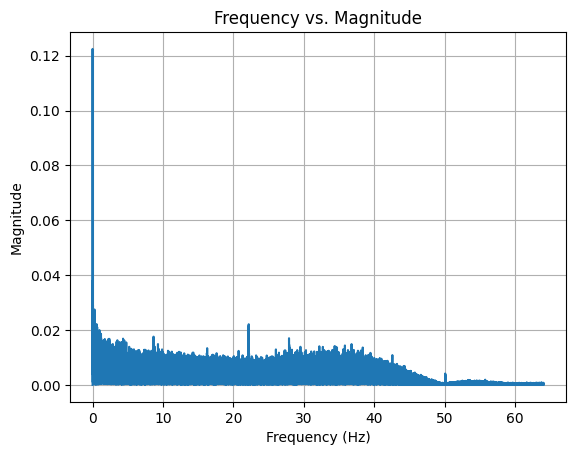

In [ ]:
plt.plot(frq, magnitute)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency vs. Magnitude')
plt.grid(True)
plt.show()

As can be seen, low frequency waves have high power.

**Conclusion:** From the KL divergence, I observe that low frequencies tend to follow the same pattern, whereas high frequencies exhibit different patterns. From the autocorrelation,based on III.3 I observe that low frequencies are non-stationary, while high frequencies are stationary. This indicates that low frequencies are highly dependent, whereas high frequencies are highly independent

### 5. Visualizing sensors' positions

Creating RawArray with float64 data, n_channels=14, n_times=304540
    Range : 0 ... 304539 =      0.000 ...  2379.211 secs
Ready.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


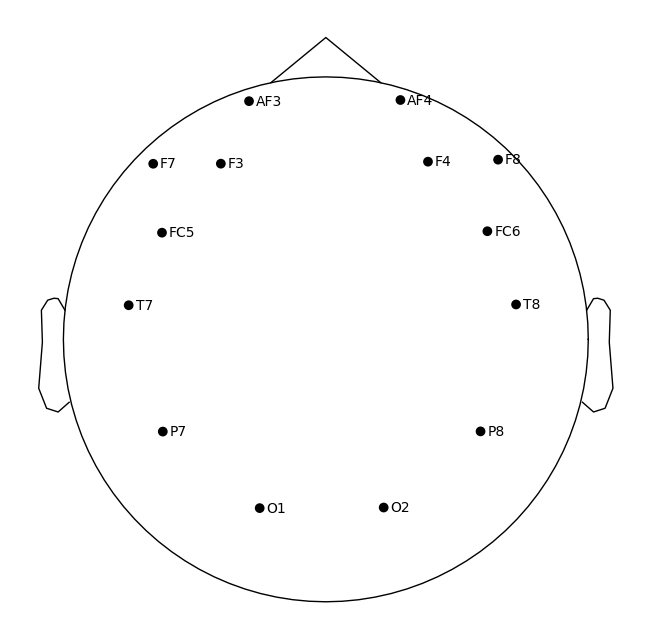

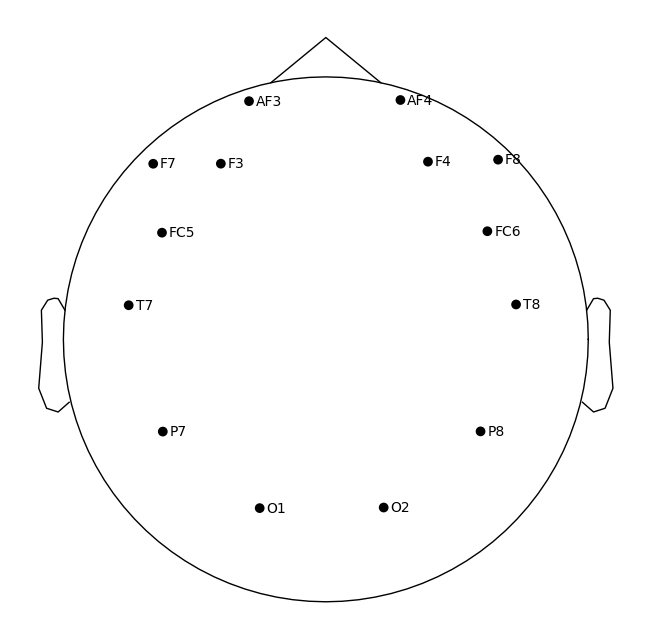

In [ ]:
n_channels = 14
n_samples = len(df)
sfreq = 128
raw = pandas_to_mne(df, sfreq)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)
raw.pick_types(eeg=True)

raw.plot_sensors(show_names=True)

**Conclusion:** AF4 and AF3 are the channels located near the eyes.

### 6. Find bad channels

A correlation window is considered “bad” for a channel if its maximum correlation with another channel is below the provided correlation threshold (default: 0.4)

In [ ]:
bad_channels=[]
sfreq=128
for subject in list(set(data['subject'])):
    df = data[data['subject'] == subject]
    columns_to_drop = ['subject', 'state']
    df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], axis=1)
    raw = pandas_to_mne(df, sfreq)
    noisy_channels_detector = NoisyChannels(raw, do_detrend=True, random_state=42, matlab_strict=False)

    noisy_channels_detector.find_bad_by_correlation()

    bad_channels.append(noisy_channels_detector.get_bads())

Creating RawArray with float64 data, n_channels=14, n_times=259480
    Range : 0 ... 259479 =      0.000 ...  2027.180 secs
Ready.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)

Creating RawArray with float64 data, n_channels=14, n_times=280424
    Range : 0 ... 280423 =      0.000 ...  2190.805 secs
Ready.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwi

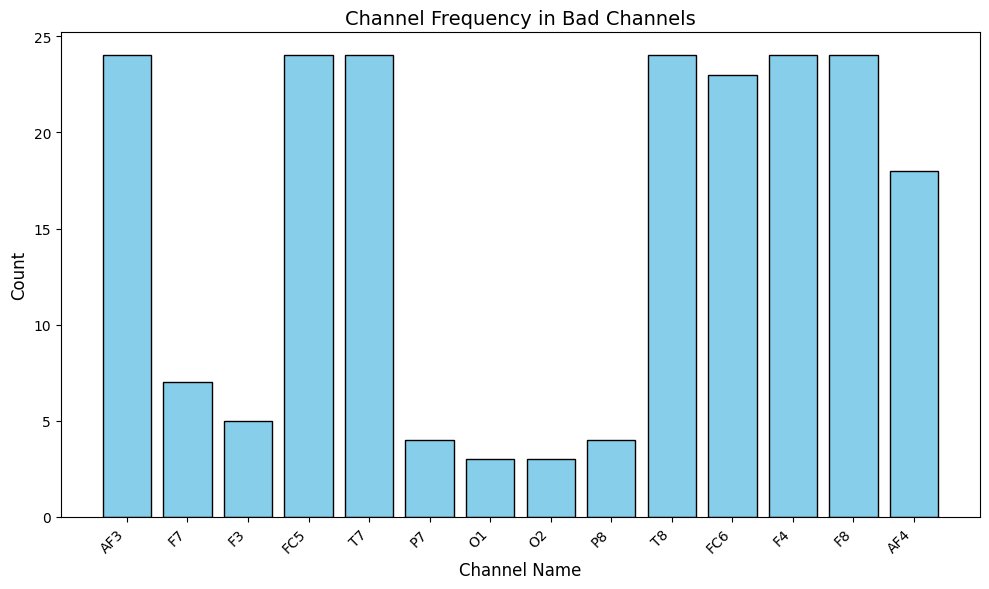

In [ ]:
flat_list = list(chain.from_iterable(bad_channels))
channel_name = df.columns.to_list()

channel_counts = {channel: flat_list.count(channel) for channel in channel_name}

channels = list(channel_counts.keys())
counts = list(channel_counts.values())

plt.figure(figsize=(10, 6))
plt.bar(channels, counts, color='skyblue', edgecolor='black')
plt.xlabel('Channel Name', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Channel Frequency in Bad Channels', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


**Conclusion:** The AF4, AF3, FC5, T7, T8, FC6, F4, AF4, and F8 channels are the most affected. In contrast, the O1 and O2 channels are the best because their locations are far from the eyes and near the top of the head. As mentioned in Section III.5, AF4 and AF3 are closest to the eyes. For this reason, AF4 and AF3 are highly susceptible to artifacts caused by blinks and eye movements.  


## V. Preprocessing with ICA

Stereotyped Artifacts

- Stereotyped artifacts are repeated, predictable noise patterns, such as line noise caused by electrical interference or biological artifacts like eye movements and muscle activity. These artifacts are systematic and can often be addressed using techniques such as filtering. For example, eye movements and blinks produce characteristic signals that are consistent over time, making them easier to identify and mitigate.

- Non-Stereotyped Artifacts
Non-stereotyped artifacts are irregular, unpredictable patterns, often resulting from head movements, electrode shifts, or other sudden actions. These artifacts introduce unique noise into the EEG data, complicating processes like Independent Component Analysis (ICA). For instance, if a subject scratches their EEG cap for several seconds, the resulting signal includes a series of varying scalp maps due to channel and wire movements. Such non-stereotyped or paroxysmal noise requires manual removal before performing ICA decomposition.

### 1. Filter

Based on the ICA assumptions:

1. The source signals are statistically independent of each other.
2. The values in each source signal follow a non-Gaussian distribution.

The first condition does not need to be addressed, as the raw data inherently exhibits non-Gaussian distribution. For the second condition, based on the III.3 view of high-frequency and low-frequency waves, I need to filter out low frequencies (<1 Hz) due to their non-stationary nature (dependency), which might cause issues for ICA. Similarly, I filter out high frequencies (>40 Hz) because of complicating ICA.

In [ ]:
montage = mne.channels.make_standard_montage('standard_1020')  # Adjust as needed
raw.set_montage(montage)
raw.pick_types(eeg=True)
raw_ica = raw.copy().filter(1, 40, fir_design='firwin', picks=['eeg'],verbose=False)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


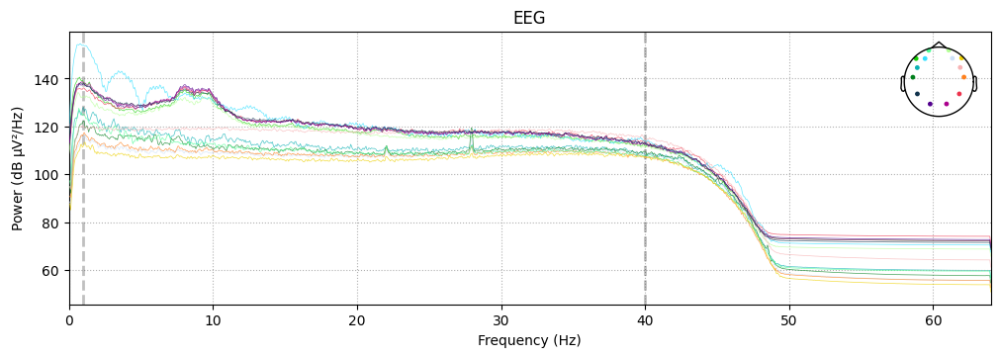

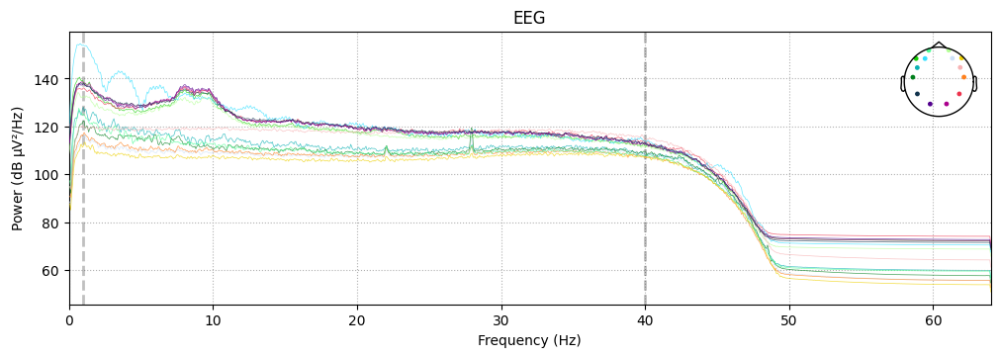

In [ ]:
raw_ica.compute_psd().plot()

However we not only filter noise ? The reason why will be shown below:

#### a. Aliasing

Aliasing occurs when a signal is sampled at a rate insufficient to capture its true frequency, resulting in the signal being misrepresented as a lower-frequency oscillation. Aliasing can compromise the accuracy of EEG data analysis, as high-frequency noise can appear as meaningful lower-frequency signals, potentially leading to incorrect interpretations. To prevent aliasing, EEG systems must be designed with an appropriate sampling rate—typically at least twice the highest frequency of interest, as specified by the Nyquist theorem—and employ filters to eliminate frequencies above this range.

For example, in a certain situation, the EEG was recorded with a sampling rate of 500 Hz, meaning a measurement from each electrode was obtained every 2 milliseconds. This sampling rate is sufficient to detect an EEG signal oscillating at 30 Hz. Over the duration of each cycle of the 30 Hz oscillation (e.g., from one peak to the next), which lasts 1/30th of a second, the system captures approximately 500/30 ≈ 17500/30 ≈ 17 measurements of the waveform. These samples are adequate to accurately represent the shape of the oscillating sine wave.

Now, consider a scenario where an electromagnetic noise signal in the environment oscillates at 1700 Hz. This noise signal would complete 1700 oscillations in one second, but the EEG amplifier, sampling only 500 times per second, cannot detect such a high-frequency signal. In this case, 3.4 oscillations of the noise waveform occur between each sample recorded by the EEG amplifier. Because 1700 Hz is not an even multiple of 500 Hz, each sample will correspond to a different phase of the 1700 Hz oscillation—sometimes capturing the peak, sometimes the trough, and other times intermediate points. When these sampled points are connected to form the measured signal, the result will appear as a much lower-frequency oscillation than the actual 1700 Hz noise.


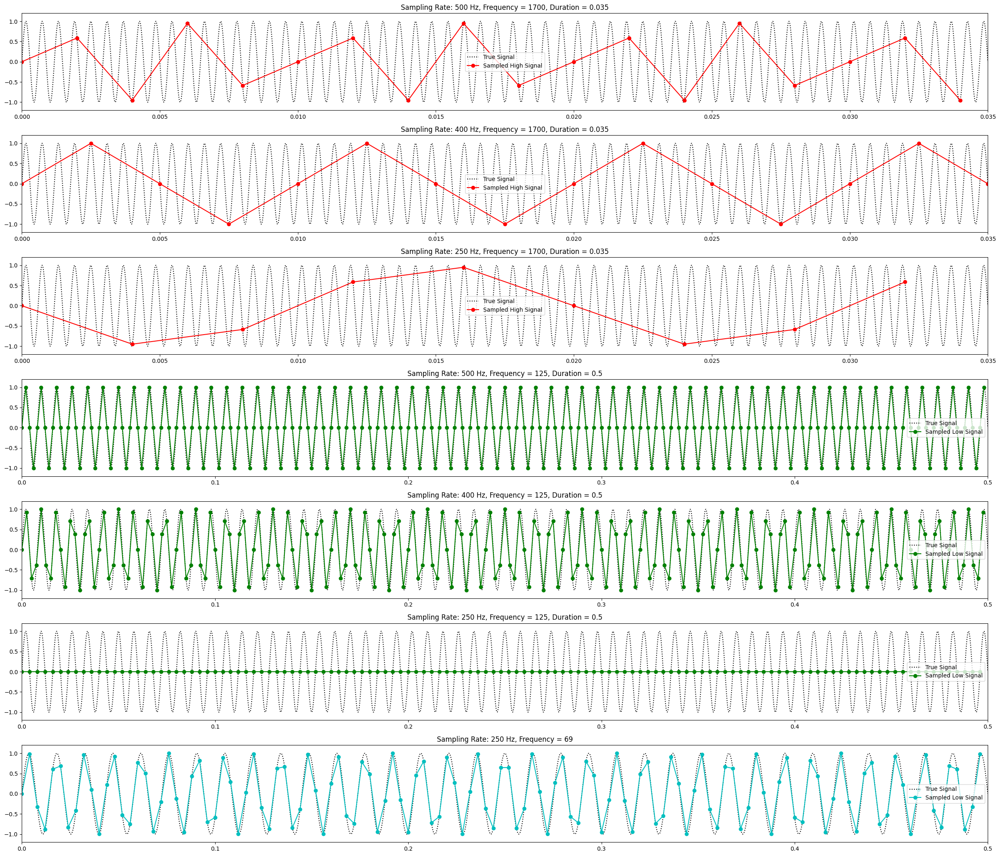

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

high_frequency = 1700
low_frequency_1 = 125
low_frequency_2 = random.sample(range(25, 125), 1)[0]
sampling_rates = [500, 400, 250]
duration = 0.035

t = np.linspace(0, duration, 10000)
high_signal = np.sin(2 * np.pi * high_frequency * t)


fig, axes = plt.subplots(7, 1, figsize=(24.5, 21))
axes = axes.flatten()


for i, sr in enumerate(sampling_rates):
    sample_times = np.arange(0, duration, 1 / sr)
    sampled_high_signal = np.sin(2 * np.pi * high_frequency * sample_times)

    axes[i].plot(t, high_signal, 'k:', label="True Signal")
    axes[i].plot(sample_times, sampled_high_signal, 'ro-', label="Sampled High Signal")
    axes[i].set_title(f"Sampling Rate: {sr} Hz, Frequency = {high_frequency}, Duration = {duration}")
    axes[i].set_xlim(0, duration)
    axes[i].set_ylim(-1.2, 1.2)

    axes[i].legend()


duration = 0.5
t = np.linspace(0, duration, 10000)
low_signal_1 = np.sin(2 * np.pi * low_frequency_1 * t)
low_signal_2 = np.sin(2 * np.pi * low_frequency_2 * t)

for i, sr in enumerate(sampling_rates, len(sampling_rates)):
    sample_times = np.arange(0, duration, 1 / sr)
    sampled_low_signal = np.sin(2 * np.pi * low_frequency_1 * sample_times)

    axes[i].plot(t, low_signal_1, 'k:', label="True Signal")
    axes[i].plot(sample_times, sampled_low_signal, 'go-', label="Sampled Low Signal")
    axes[i].set_title(f"Sampling Rate: {sr} Hz, Frequency = {low_frequency_1}, Duration = {duration}")
    axes[i].set_xlim(0, duration)
    axes[i].set_ylim(-1.2, 1.2)

    axes[i].legend()


sample_times = np.arange(0, duration, 1 / 250)
sampled_low_signal = np.sin(2 * np.pi * low_frequency_2 * sample_times)

axes[6].plot(t, low_signal_2, 'k:', label="True Signal")
axes[6].plot(sample_times, sampled_low_signal, 'co-', label="Sampled Low Signal")
axes[6].set_title(f"Sampling Rate: {250} Hz, Frequency = {low_frequency_2}")
axes[6].set_xlim(0, duration)
axes[6].set_ylim(-1.2, 1.2)

axes[6].legend()

plt.tight_layout()
plt.show()

Dominant Frequency: 68.48 Hz
True Frequency: 69.00 Hz
Dominant Amplitude: 1.08


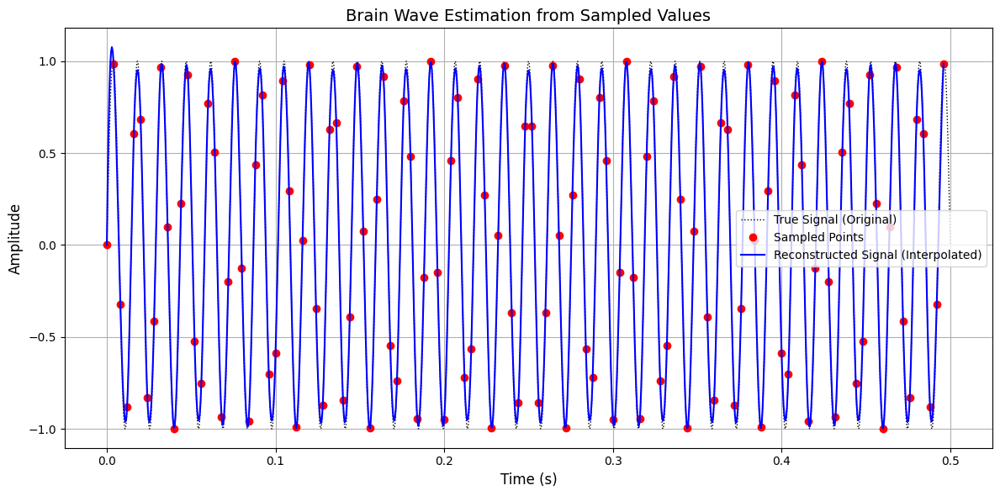

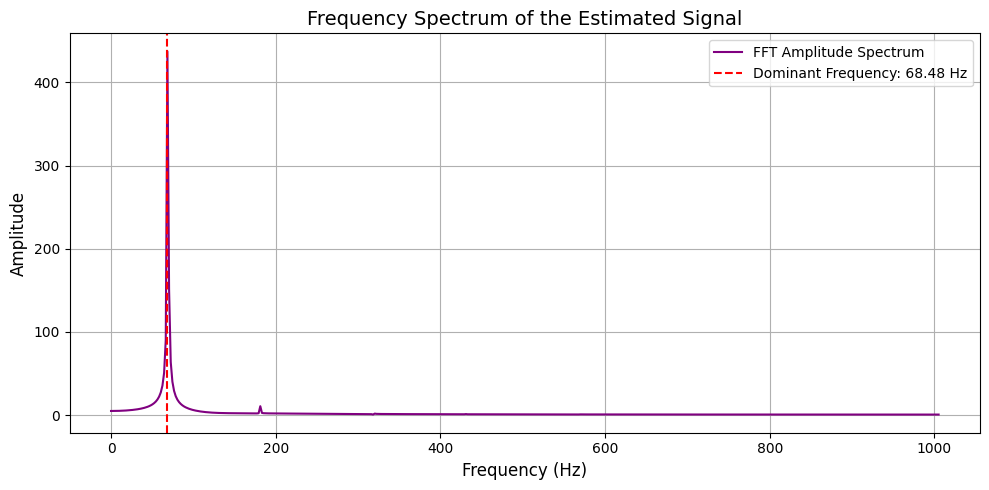

In [ ]:
# Parameters for low-frequency signal
sampling_rate = 250  # Sampling rate (Hz)
duration = 0.5  # Duration of the signal (seconds)

# Generate the true signal (high-resolution time vector)
t_true = np.linspace(0, duration, 10000)  # High-resolution time vector
low_signal_2 = np.sin(2 * np.pi * low_frequency_2 * t_true)  # True low-frequency signal

# Sample the signal
sample_times = np.arange(0, duration, 1 / sampling_rate)  # Sampled time points
sampled_signal = np.sin(2 * np.pi * low_frequency_2 * sample_times)  # Sampled signal values

# Reconstruct the signal using interpolation
interp_function = interp1d(sample_times, sampled_signal, kind='cubic', bounds_error=False, fill_value="extrapolate")
# Generate t_estimated within the bounds of sample_times
t_estimated = np.linspace(sample_times[0], sample_times[-1], 1000)  # Ensure t_estimated is within bounds
estimated_signal = interp_function(t_estimated)  # Reconstructed signal

# Estimate Frequency and Amplitude using FFT
n = len(t_estimated)  # Number of points in the estimated signal
fft_result = np.fft.fft(estimated_signal)  # Perform FFT
frequencies = np.fft.fftfreq(n, d=(t_estimated[1] - t_estimated[0]))  # Corresponding frequencies

# Take only positive frequencies and amplitudes
positive_freqs = frequencies[:n // 2]
fft_amplitudes = np.abs(fft_result[:n // 2])

# Find the dominant frequency and amplitude
dominant_freq_idx = np.argmax(fft_amplitudes)
dominant_frequency = positive_freqs[dominant_freq_idx]
dominant_amplitude = np.max(estimated_signal)

# Print the results
print(f"Dominant Frequency: {dominant_frequency:.2f} Hz")
print(f"True Frequency: {low_frequency_2:.2f} Hz")
print(f"Dominant Amplitude: {dominant_amplitude:.2f}")

# Plot the original, sampled, and reconstructed signals
plt.figure(figsize=(12, 6))
plt.plot(t_true, low_signal_2, 'k:', label='True Signal (Original)', linewidth=1)  # Original signal
plt.plot(sample_times, sampled_signal, 'ro', label='Sampled Points')  # Sampled points
plt.plot(t_estimated, estimated_signal, 'b-', label='Reconstructed Signal (Interpolated)', linewidth=1.5)  # Reconstructed signal

# Add labels and title
plt.title('Brain Wave Estimation from Sampled Values', fontsize=14)
plt.xlabel('Time (s)', fontsize=12)
plt.ylabel('Amplitude', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the FFT result
plt.figure(figsize=(10, 5))
plt.plot(positive_freqs, fft_amplitudes, color='purple', label='FFT Amplitude Spectrum')
plt.axvline(dominant_frequency, color='red', linestyle='--', label=f'Dominant Frequency: {dominant_frequency:.2f} Hz')
plt.title('Frequency Spectrum of the Estimated Signal', fontsize=14)
plt.xlabel('Frequency (Hz)', fontsize=12)
plt.ylabel('Amplitude', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


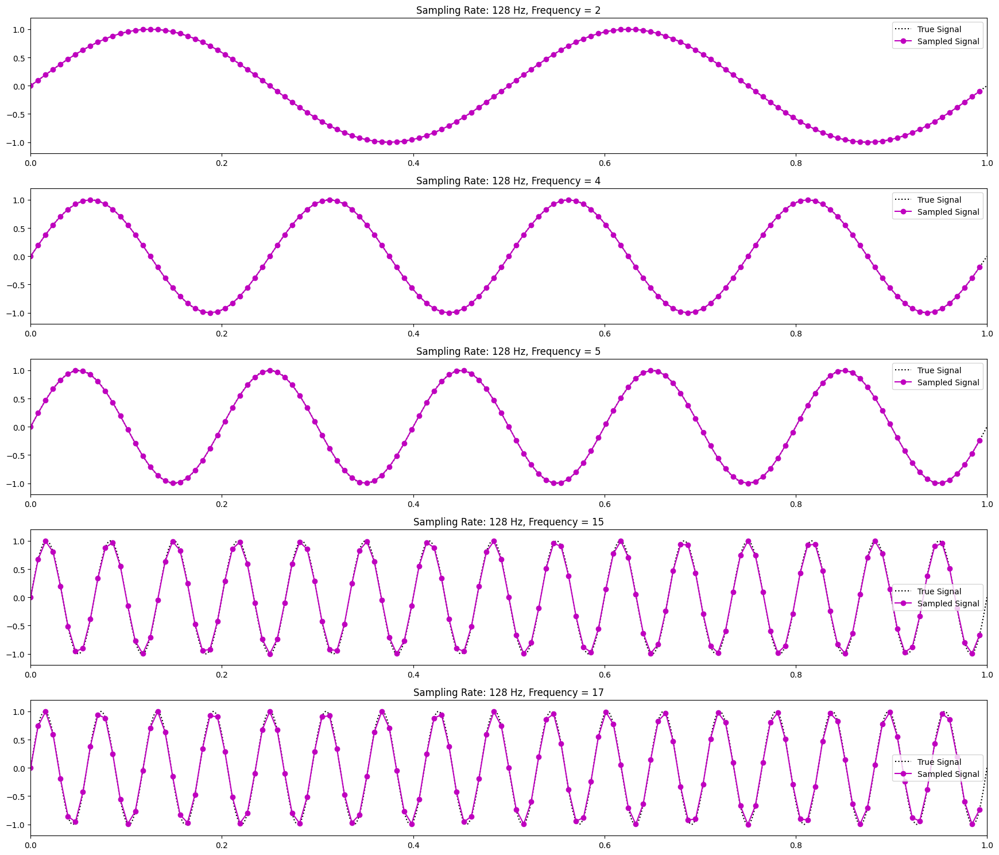

In [ ]:
# Parameters
frequencies = random.sample(range(1, 31), 5)  # Frequencies (Hz) of 5 signals whose values
                                            # are randomly generated the range [1, 30]
frequencies.sort()
sampling_rate = 128  # Sampling rates to simulate aliasing
duration = 1  # Duration of the signal (seconds)

t = np.linspace(0, duration, 10000)  # High-resolution time vector for the true signal
# Generate sine waves whose frequency are randomly generated the range [1, 30]
signal = []
for frequency in frequencies:
    signal_i = np.sin(2 * np.pi * frequency * t)
    signal.append(signal_i)

# Plotting the aliasing examples
fig, axes = plt.subplots(5, 1, figsize=(17.5, 15))
axes = axes.flatten()

# Plotting 5 random frequencies whose values vary between 1 and 30
for i, frequency in enumerate(frequencies):
    sample_times = np.arange(0, duration, 1 / sampling_rate)  # Sampled time points
    sampled_signal = np.sin(2 * np.pi * frequency * sample_times)  # Sampled signal

    axes[i].plot(t, signal[i], 'k:', label="True Signal")  # True signal (dotted black line)
    axes[i].plot(sample_times, sampled_signal, 'mo-', label="Sampled Signal")  # Sampled points (red)
    axes[i].set_title(f"Sampling Rate: {sampling_rate} Hz, Frequency = {frequency}")
    axes[i].set_xlim(0, duration)
    axes[i].set_ylim(-1.2, 1.2)

    axes[i].legend()

plt.tight_layout()
plt.show()

**Conclusion:** Filter is not enough

### 2. Segmentation

Extracting data epochs reduces the number of samples, and ICA component quality is usually higher when more data is present. In our pre-processing step,
the sampled raw EEG signal is divided into epochs of size N.
Very short segments (< 1 s) may not represent some slow
artifacts properly (e.g. ocular or movement artifacts) whereas
in very large windows (e.g. > 5 s), the stationary assumption
of EEG may be no longer valid and there is a high chance that
clean EEG segments will be distorted by the artifact removal
pr.cedure

In [ ]:
import mne

tstep = 5.0

events_ica = mne.make_fixed_length_events(raw_ica, duration=tstep)

epochs_ica = mne.Epochs(raw_ica, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True)

Not setting metadata
635 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 635 events and 641 original time points ...
0 bad epochs dropped


### 3. Initial Cleaning for ICA

As I mention, in this step I try to exclude Non-stereotyped artifacts.

AutoReject, as the name implies, is an automated and data-driven way of determining a threshold to distinguish between “noisy” and “clean” channels and epochs in the data. It is an iterative process that repeatedly takes sub-samples of the entire data set, and computes the variance of each channel and epoch. It then computes a threshold for each channel and epoch, based on the distribution of variances across the entire data set. It then rejects any channels or epochs that exceed the threshold.

In [ ]:
ar = AutoReject(n_interpolate=[1, 2, 4],
                random_state=42,
                picks=mne.pick_types(epochs_ica.info,
                                     eeg=True,
                                     eog=False
                                    ),
                n_jobs=4,
                verbose=False
                )

ar.fit(epochs_ica)

reject_log = ar.get_reject_log(epochs_ica)

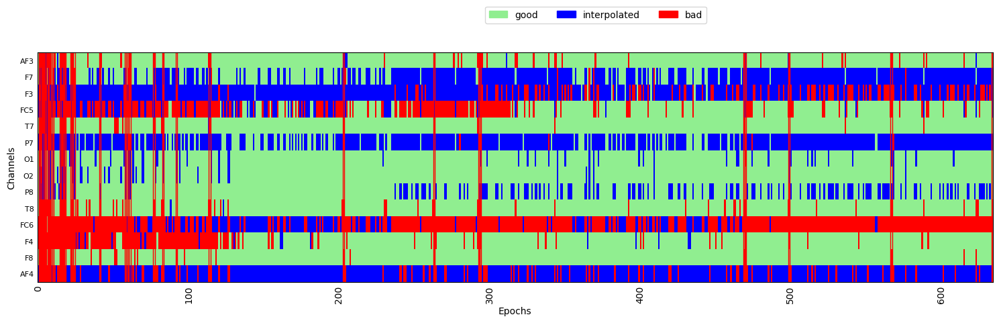

In [ ]:
fig, ax = plt.subplots(figsize=[15, 5])
reject_log.plot('horizontal', ax=ax, aspect='auto')
plt.show()

Green areas represent “good” data, while the red vertical lines indicate epochs that AutoReject has marked as “bad.” The blue lines signify specific channels marked as “bad” in epochs where most of the channels were considered “good.” In such cases, AutoReject interpolates the data from the bad channels based on the surrounding channels rather than rejecting the entire epoch due to one or a few bad channels. This approach is justified because eye movements, which can occur over short periods, are more common, whereas non-stereotyped artifacts are less likely to occur within such a brief timeframe. Furthermore, at this stage, I aim to remove non-stereotyped artifacts and, therefore, prefer to retain the blue epochs.

###  4. Independent Component Analysis (ICA)

What is Independent Component Analysis?

Independent Component Analysis (ICA) is a statistical and computational technique commonly used in machine learning to separate a multivariate signal into its independent, non-Gaussian components. The primary goal of ICA is to apply a linear transformation to the data such that the resulting components are as statistically independent as possible.  

The core of ICA is based on the principle of statistical independence, which is used to identify individual components within mixed signals that are independent of each other.  

**Statistical Independence Concept:**  
In probability theory, statistical independence between two random variables, X and Y, implies that their joint probability distribution is equal to the product of their individual probability distributions. Mathematically, (P(X, Y) = P(X)P(Y)\). This means that knowing the outcome of one variable provides no information about the probability of the other variable’s outcome.  

By leveraging this concept, ICA separates mixed signals into statistically independent components, enabling its application in various fields such as signal processing, neuroscience, and data analysis.

ICA in EEG

ICA is very good at capturing features of the data that explain the most variance. Blinks and eye movements are well-captured by ICA because they are so much larger than EEG, and so they contain a lot of the variance in the EEG recordings.  ICA assumes the data is stationary, meaning statistical properties (like mean and variance) do not change over time.
Low-frequency components often introduce non-stationary trends (e.g., baseline drifts or shifts in electrode potential).
Removing these trends helps the data better meet ICA’s theoretical assumptions.


Excluding bad epochs identified beforehand, the ICA decomposition focuses on cleaner data, leading to more reliable identification of artifact-related independent components (e.g., those corresponding to eye blinks or muscle artifacts).

In [ ]:
random_state = 42
ica_n_components = .99


ica = mne.preprocessing.ICA(n_components=ica_n_components,
                            random_state=random_state,
                            )
ica.fit(epochs_ica[~reject_log.bad_epochs], decim=3)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by explained variance: 10 components
Fitting ICA took 4.1s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,31 iterations on epochs (129042 samples)
ICA components,10
Available PCA components,14
Channel types,eeg
ICA components marked for exclusion,—


 Voltage maps use colors to represent the polarity and intensity of electrical signals:

- Blue: Indicates negative polarity.
- Red: Indicates positive polarity.

Color Intensity: Stronger signals are represented by more intense colors. Equipotential Lines: These lines show steps in voltage levels, helping to delineate regions of similar potentials.

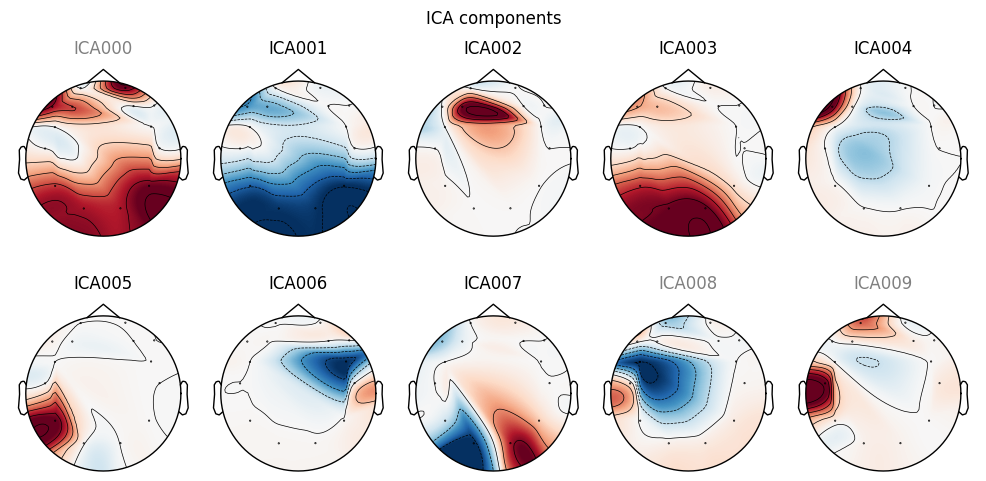

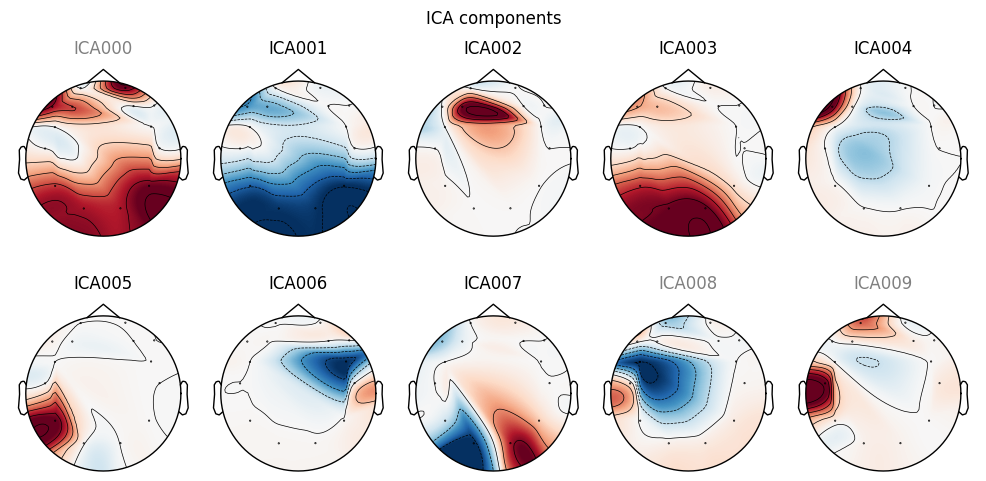

In [ ]:
ica.plot_components()

We can observe that ICA000 and ICA009 exhibit high voltage levels near the eye region, suggesting they might be influenced by eye movements.

### 5. Find threshold to remove noisy components

find_bads_eog() also takes a threshold kwarg, which is the correlation threshold that will be used to identify ICs that are likely ocular artifacts. We use a while loop to iterate over a range of threshold values, starting from a relatively high value of 3.5 and stepping down in increments of 0.1, until at least 2 ICs are identified. Since we expect both blinks and horizontal eye movements in the data, we expect at least 2 ICs to be identified as artifacts, and these should be the two that have the highest correlation values with the channels around the eyes. This algorithm is not perfect; it is possible that it will identify other ICs as artifacts, so it is important to cross-reference .

Based on Section III.6, I chose AF3 and AF4 because they are strongly affected by eye movements.

In [ ]:
ica.exclude = []
num_excl = 0
max_ic = 2
z_thresh = 3.5
z_step = .05

while num_excl < max_ic:
    eog_indices, eog_scores = ica.find_bads_eog(epochs_ica,
                                                ch_name=['AF3','AF4'],
                                                threshold=z_thresh
                                                )
    num_excl = len(eog_indices)
    z_thresh -= z_step


ica.exclude = eog_indices

print('Final z threshold = ' + str(round(z_thresh, 2)))

Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Using EOG channels: AF3, AF4
Final z threshold = 2.45


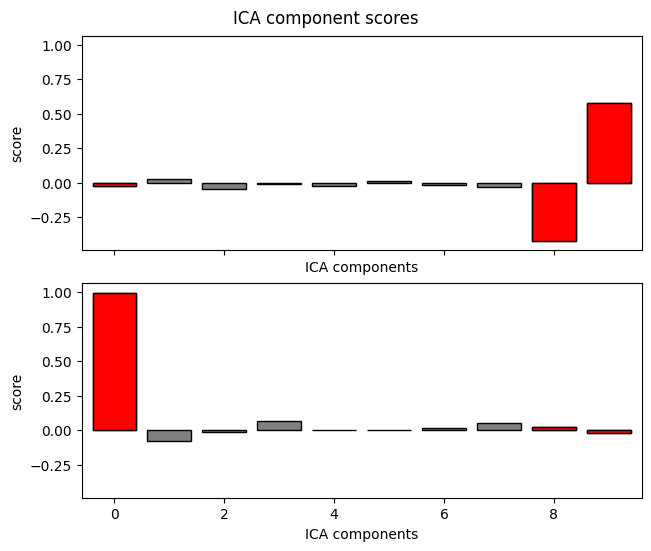

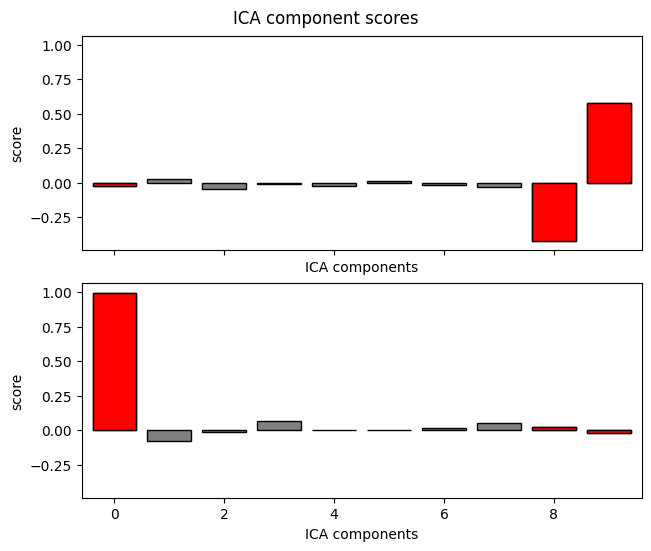

In [ ]:
ica.plot_scores(eog_scores)

ICA008,ICA000 and ICA009 had the highest correlation values, and were rejected

In [ ]:
epochs_postica = ica.apply(epochs_ica.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (10 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components


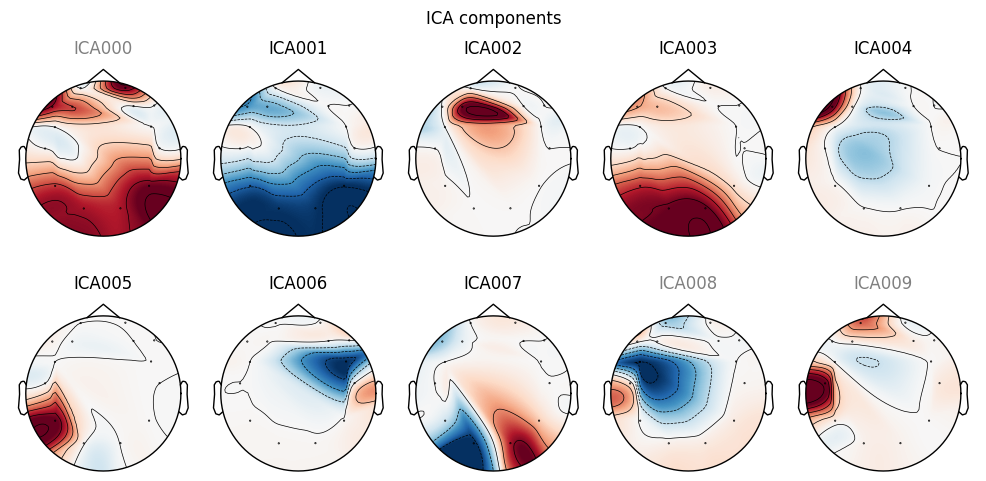

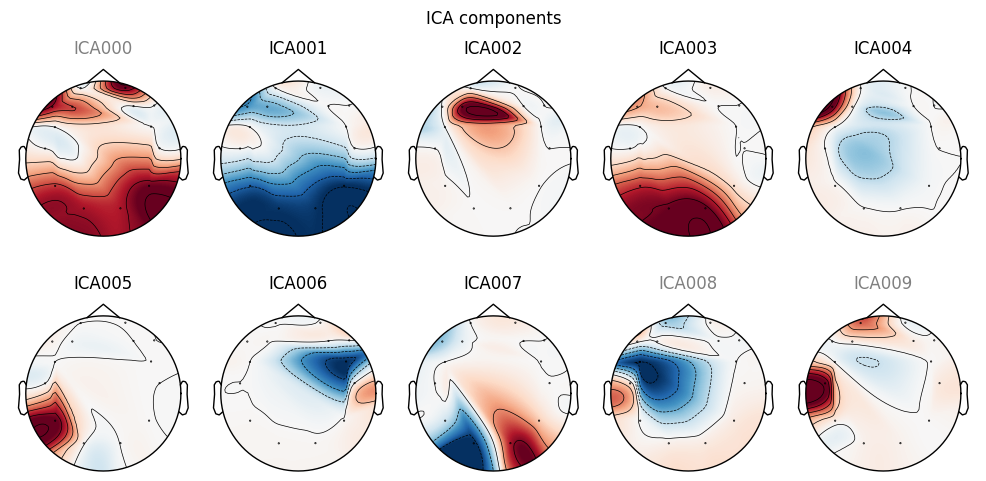

In [ ]:
ica.plot_components()

In [ ]:
ar = AutoReject(n_interpolate=[1, 2, 4],
                random_state=42,
                picks=mne.pick_types(epochs_postica.info,
                                     eeg=True,
                                     eog=False
                                    ),
                n_jobs=4,
                verbose=False
                )

epochs_clean, reject_log_clean = ar.fit_transform(epochs_postica, return_log=True)

epochs_clean

<Epochs | 635 events (all good), 0 – 5 s (baseline off), ~43.5 MB, data loaded,
 '1': 635>

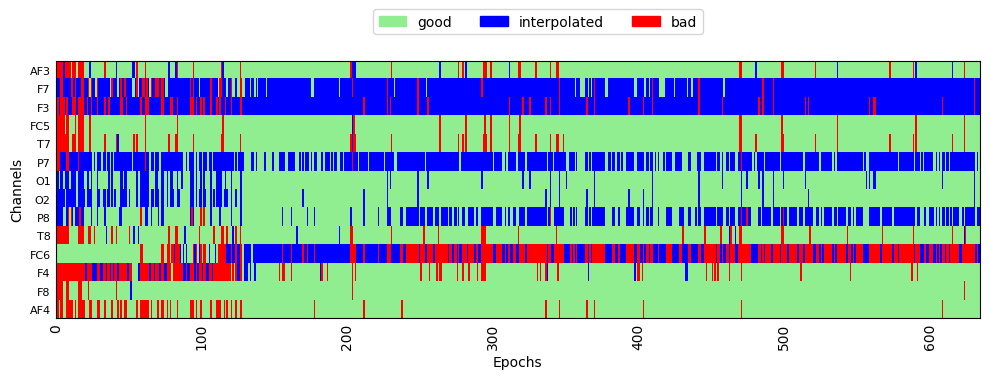

In [ ]:
fig, ax = plt.subplots(figsize=[10, 4])
reject_log_clean.plot('horizontal', aspect='auto', ax=ax)
plt.show()


In [ ]:
epochs_df = epochs_clean.to_data_frame()

epochs_dff = epochs_df.drop(['time', 'condition'], axis=1)

unique_epochs = list(epochs_dff['epoch'].unique())


In [ ]:
label_data

,state,subject,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
674888,0,subject_3,4445.128205,3962.564103,5018.461538,3829.743590,4035.384615,4308.717949,4250.769231,4049.230769,4149.743590,4313.333333,4148.205128,4280.512821,4334.871795,4084.102564
674889,0,subject_3,4445.128205,3972.307692,5024.102564,3826.666667,4035.384615,4311.794872,4257.948718,4053.846154,4155.897436,4313.846154,4147.692308,4280.512821,4334.871795,4089.230769
674890,0,subject_3,4444.615385,3975.384615,5024.102564,3825.128205,4035.384615,4317.948718,4263.076923,4057.948718,4157.435897,4314.358974,4145.641026,4281.025641,4334.871795,4097.435897
674891,0,subject_3,4443.589744,3973.846154,5031.794872,3829.230769,4035.384615,4320.000000,4266.666667,4058.461538,4161.538462,4312.820513,4145.128205,4280.000000,4334.871795,4103.076923
674892,0,subject_3,4442.051282,3982.051282,5041.025641,3831.282051,4035.384615,4324.615385,4266.153846,4059.487179,4168.205128,4314.358974,4146.153846,4281.025641,4334.871795,4110.256410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9917207,0,subject_34,4449.230769,3960.000000,5003.076923,3832.820513,4048.205128,4270.769231,4325.128205,4013.846154,4125.128205,4317.435897,4150.769231,4289.230769,4340.000000,4272.820513
9917208,0,subject_34,4448.205128,3959.487179,5008.717949,3833.846154,4045.641026,4276.410256,4327.692308,4022.051282,4127.692308,4323.076923,4150.769231,4289.230769,4340.000000,4278.974359
9917209,0,subject_34,4445.641026,3960.000000,5014.871795,3831.794872,4046.666667,4273.333333,4323.589744,4015.384615,4121.538462,4317.948718,4150.769231,4289.230769,4340.000000,4275.897436
9917210,0,subject_34,4446.666667,3959.487179,5024.102564,3828.717949,4045.128205,4274.871795,4326.153846,4014.358974,4124.615385,4311.794872,4150.769231,4289.230769,4340.000000,4272.820513


In [ ]:
labels = []

for epoch in range(len(unique_epochs)):
    start_idx = int((sfreq * tstep + 1) * epoch)
    end_idx = int(start_idx + sfreq * tstep + 1)

    if end_idx > len(label_data):
        labels.extend(label_data[start_idx:len(label_data)].tolist())
    else:
        labels.extend(label_data[start_idx:end_idx].tolist())

labels = np.array(labels)
labels = labels.reshape(-1, 1)

if len(epochs_dff) > len(labels):
    epochs_dff = epochs_dff[:len(labels)]
else:
    labels = labels[:len(epochs_dff)]

In [ ]:
epochs_dff['state']=labels

epochs_dff=epochs_dff.drop('epoch',axis=1)

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

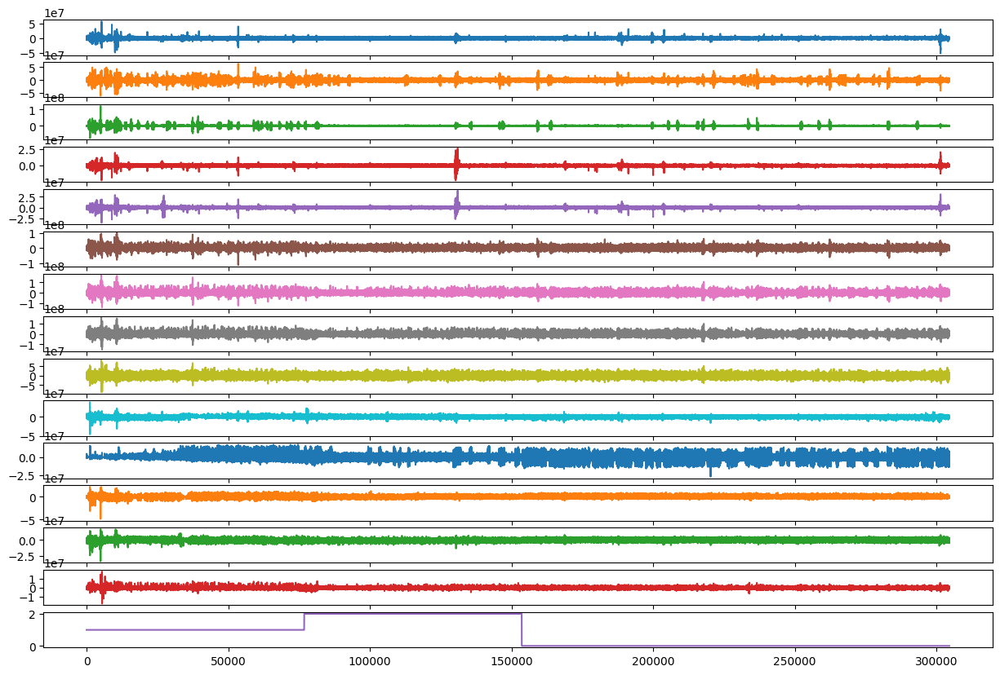

In [ ]:
epochs_dff.plot(subplots=True, figsize=(15, 10), legend=False)

## XI. Pipeline Summary:


1. Filter frequencies, Remove low frequencies (<1 Hz) as they tend to be non-stationary, remove high frequencies (>40 Hz) to eliminate noise
2. Segment data
3. Before ICA: Detect and exclude bad epochs to ensure ICA decomposition is robust.
4. ICA Step: Fit ICA on cleaner data to isolate artifact components.
5. Dynamically identify and exclude artifact-related ICA components.
6. After ICA:  Apply AutoReject to clean residual artifacts and interpolate data where necessary

# 2.ExtractFeature,CNN

### Library

In [ ]:
! pip install mne

In [ ]:
# IMPORT LIBRARY
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as scs
import re
from numpy import genfromtxt
import scipy.fftpack
import math as m
np.random.seed(0)
import scipy.io
from sklearn.decomposition import PCA
from scipy.interpolate import griddata
from sklearn.preprocessing import scale
import mne
from scipy import signal
import glob
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler,label_binarize
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from imblearn.over_sampling import RandomOverSampler
import torchvision.transforms as transforms
from sklearn.metrics import roc_auc_score, f1_score,classification_report,confusion_matrix,roc_curve, auc

In [ ]:
def augment_EEG(data, stdMult, pca=False, n_components=2):
    """
    Augment data by adding normal noise to each feature.

    :param data: EEG feature data as a matrix (n_samples x n_features)
    :param stdMult: Multiplier for std of added noise
    :param pca: if True will perform PCA on data and add noise proportional to PCA components.
    :param n_components: Number of components to consider when using PCA.
    :return: Augmented data as a matrix (n_samples x n_features)
    """
    augData = np.zeros(data.shape)
    if pca:
        pca = PCA(n_components=n_components)
        pca.fit(data)
        components = pca.components_
        variances = pca.explained_variance_ratio_
        coeffs = np.random.normal(scale=stdMult, size=pca.n_components) * variances
        for s, sample in enumerate(data):
            augData[s, :] = sample + (components * coeffs.reshape((n_components, -1))).sum(axis=0)
    else:
        # Add Gaussian noise with std determined by weighted std of each feature
        for f, feat in enumerate(data.transpose()):
            augData[:, f] = feat + np.random.normal(scale=stdMult*np.std(feat), size=feat.size)
    return augData

def gen_images(locs, features, n_gridpoints, normalize=True,
               augment=False, pca=False, std_mult=0.1, n_components=2, edgeless=False):
    """
    Generates EEG images given electrode locations in 2D space and multiple feature values for each electrode

    :param locs: An array with shape [n_electrodes, 2] containing X, Y
                        coordinates for each electrode.
    :param features: Feature matrix as [n_samples, n_features]
                                Features are as columns.
                                Features corresponding to each frequency band are concatenated.
                                (alpha1, alpha2, ..., beta1, beta2,...)
    :param n_gridpoints: Number of pixels in the output images
    :param normalize:   Flag for whether to normalize each band over all samples
    :param augment:     Flag for generating augmented images
    :param pca:         Flag for PCA based data augmentation
    :param std_mult     Multiplier for std of added noise
    :param n_components: Number of components in PCA to retain for augmentation
    :param edgeless:    If True generates edgeless images by adding artificial channels
                        at four corners of the image with value = 0 (default=False).
    :return:            Tensor of size [samples, colors, W, H] containing generated
                        images.
    """
    feat_array_temp = []
    nElectrodes = locs.shape[0]     # Number of electrodes

    # Test whether the feature vector length is divisible by number of electrodes
    assert features.shape[1] % nElectrodes == 0
    n_colors = features.shape[1] / nElectrodes
    for c in range(int(n_colors)):
        feat_array_temp.append(features[:, c * nElectrodes : nElectrodes * (c+1)])
    if augment:
        if pca:
            for c in range(int(n_colors)):
                feat_array_temp[c] = augment_EEG(feat_array_temp[c], std_mult, pca=True, n_components=n_components)
        else:
            for c in range(int(n_colors)):
                feat_array_temp[c] = augment_EEG(feat_array_temp[c], std_mult, pca=False, n_components=n_components)
    n_samples = features.shape[0]

    # Interpolate the values
    grid_x, grid_y = np.mgrid[
                     min(locs[:, 0]):max(locs[:, 0]):n_gridpoints*1j,
                     min(locs[:, 1]):max(locs[:, 1]):n_gridpoints*1j
                     ]
    temp_interp = []
    for c in range(int(n_colors)):
        temp_interp.append(np.zeros([n_samples, n_gridpoints, n_gridpoints]))

    # Generate edgeless images
    if edgeless:
        min_x, min_y = np.min(locs, axis=0)
        max_x, max_y = np.max(locs, axis=0)
        locs = np.append(locs, np.array([[min_x, min_y], [min_x, max_y], [max_x, min_y], [max_x, max_y]]), axis=0)
        for c in range(n_colors):
            feat_array_temp[c] = np.append(feat_array_temp[c], np.zeros((n_samples, 4)), axis=1)

    # Interpolating
    for i in range(n_samples):
        for c in range(int(n_colors)):
            temp_interp[c][i, :, :] = griddata(locs, feat_array_temp[c][i, :], (grid_x, grid_y),
                                               method='cubic', fill_value=0)
        print('Interpolating {0}/{1}\r'.format(i + 1, n_samples), end='\r')

    # Normalizing
    for c in range(int(n_colors)):
        if normalize:
            temp_interp[c][~np.isnan(temp_interp[c])] = \
                scale(temp_interp[c][~np.isnan(temp_interp[c])])
        temp_interp[c] = np.nan_to_num(temp_interp[c])
    return np.swapaxes(np.asarray(temp_interp), 0, 1)


In [ ]:
def get_fft(snippet, sampling_rate=128.0):
    """
    Compute FFT (Fast Fourier Transform) and return frequencies (frq) and spectrum magnitude (magnitude).

    Parameters:
    - snippet: Input signal (1D array).
    - sampling_rate: Sampling frequency (Hz), default is 128 Hz.

    Returns:
    - frq: Array of frequencies (in Hz).
    - magnitude: Corresponding spectrum magnitude.
    """

    n = len(snippet)

    k = np.arange(n)
    T = n / sampling_rate
    frq = k / T
    frq = frq[:n // 2]

    Y = np.fft.fft(snippet) / n
    magnitude = np.abs(Y[:n // 2])

    return frq, magnitude



def waves_averages(f,Y):
    theta_range = (0.2,7)
    alpha_range = (8,13)
    beta_range = (16,31)
    gamma_range=(32,100)
    delta_range=(0.2,3)
    theta = Y[(f>theta_range[0]) & (f<=theta_range[1])].mean()
    alpha = Y[(f>alpha_range[0]) & (f<=alpha_range[1])].mean()
    beta = Y[(f>beta_range[0]) & (f<=beta_range[1])].mean()
    gamma=Y[(f>gamma_range[0]) & (f<=gamma_range[1])].mean()
    delta=Y[(f>delta_range[0]) & (f<=delta_range[1])].mean()
    return theta,alpha,beta

def make_steps(samples,frame_duration,overlap):
    '''
    in:
    samples - number of samples in the session
    frame_duration - frame duration in seconds
    overlap - float fraction of frame to overlap in range (0,1)

    out: list of tuple ranges
    '''

    Fs = 128
    i = 0
    intervals = []
    samples_per_frame = Fs * frame_duration
    while i+samples_per_frame <= samples:
        intervals.append((i,i+samples_per_frame))
        i = i + samples_per_frame - int(samples_per_frame*overlap)
    return intervals

def make_frames(df, frame_duration, overlap):
    """
    Create frames from EEG data, calculating theta, alpha, and beta averages for each frame.

    :param df: DataFrame with EEG data (rows: time points, columns: channels).
    :param frame_duration: Duration of each frame in seconds.
    :param overlap: Overlap between consecutive frames as a fraction (e.g., 0.3 for 30% overlap).
    :return: NumPy array of shape (n_frames, n_channels, 3), where 3 represents theta, alpha, and beta bands.
    """
    Fs = 128.0
    frame_length = int(Fs * frame_duration)
    steps = make_steps(len(df), frame_duration, overlap)

    frames = []

    for start, end in steps:
        frame = []
        for channel in df.columns:

            snippet = np.array(df.loc[start:end, channel])

            f, Y = get_fft(snippet)
            theta,alpha, beta = waves_averages(f, Y)
            frame.append([theta,alpha, beta])

        frames.append(frame)

    return np.array(frames)

def make_epochs(X,window_size=128, bridge=90):
    epochs = []
    num_rows=len(X)
    for start in range(0, num_rows, bridge):
        end = start + window_size
        if end > num_rows:
            end = num_rows
        epochs.append(X[start:end])

    print(f"Number of epochs: {len(epochs)}")
    return epochs

def make_data_pipeline(df, image_size, frame_duration, overlap, locs_2d,output_dir,filename):
    '''
    IN:
    param df: DataFrame containing the data.
    param image_size: The output size of the image (x, x).
    param frame_duration: Duration of each frame in seconds.
    param overlap: Percentage of overlap between frames (0 to 1).
    param locs_2d: 2D coordinates of channels used for creating images.

    OUT:
    X: A numpy array containing the image frames (unshuffled),
       where:
       - Red: Theta band.
       - Green: Alpha band.
       - Blue: Beta band.
    y: A numpy array containing the corresponding labels (1 or 0).

    '''
    state_encode = {
        '1': 0,
        '2': 1,
        '0': 2
    }

    list_state = df['state'].unique()

    X_list, y_list = [], []

    for state in list_state:

        new_df = df[(df['state'] == state)].reset_index(drop=True)

        columns_to_drop = ['state','AF3','AF4']
        existing_columns = [col for col in columns_to_drop if col in new_df.columns]
        new_df = new_df.drop(columns=existing_columns)


        label = state_encode[str(state)]

        X_0 = make_frames(new_df, frame_duration, overlap)

        X_1 = X_0.reshape(len(X_0), 12 * 3)
        images = gen_images(np.array(locs_2d), X_1, image_size, normalize=True,pca=True,augment=True)
        images = np.swapaxes(images, 1, 3)

        print(len(images), ' frames generated with label ', label, '.\n')

        X_list.append(images)
        y_list.append(np.ones(len(images)) * label)

    X = np.concatenate(X_list, axis=0) if X_list else np.array([])
    y = np.concatenate(y_list, axis=0) if y_list else np.array([])
    np.savez(output_dir+filename+".npz",X=X,y=y)

    return X, np.array(y)


def balance_data(X, y, random_state=42):
    """
    Balance the dataset using RandomOverSampler, supporting data with multiple dimensions (>2).

    Parameters:
    X (ndarray): Input data with shape [n_samples, ...].
    y (array-like): Corresponding class labels, shape [n_samples].
    random_state (int): Seed value for RandomOverSampler.

    Returns:
    X_resampled (ndarray): Resampled data with the same shape as the original except for n_samples.
    y_resampled (array-like): Class labels after resampling.
    """
    original_shape = X.shape

    n_samples = X.shape[0]
    X_flatten = X.reshape(n_samples, -1)

    ros = RandomOverSampler(random_state=random_state)
    X_resampled_flatten, y_resampled = ros.fit_resample(X_flatten, y)

    new_n_samples = X_resampled_flatten.shape[0]
    X_resampled = X_resampled_flatten.reshape((new_n_samples,) + original_shape[1:])

    return X_resampled, y_resampled

def count_classes(y):
    y = np.array(y, dtype=int)
    unique_classes = np.unique(y)
    counts = np.zeros(max(unique_classes) + 1, dtype=int)

    for label in unique_classes:
        counts[label] = np.sum(y == label)

    return counts

def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()


### CONVOLUTION 2D FOR IMAGE

* **In this section, we will analyze the distribution of theta, alpha, and beta waves to measure the states of 'focused,' 'unfocused,' and 'drowsy.**
* Main Idea: Based on the signal dataset, use Fourier transform to convert the signal into frequency bands. From there, filter out the three types of waves: theta waves that can classify the drowsy state, alpha waves that can classify the unfocused state, and finally, beta waves that classify the focused state. After that, generate images showing the energy distribution of the three types of waves on the brain area. Finally, use an image classification model to predict the corresponding states.

[[-0.0702629  0.0424743]
 [-0.0502438  0.0531112]
 [-0.0772149  0.0186433]
 [-0.0841611 -0.0160187]
 [-0.0724343 -0.0734527]
 [-0.0294134 -0.112449 ]
 [ 0.0298426 -0.112156 ]
 [ 0.0730557 -0.0730683]
 [ 0.0850799 -0.0150203]
 [ 0.0795341  0.0199357]
 [ 0.0518362  0.0543048]
 [ 0.0730431  0.0444217]]


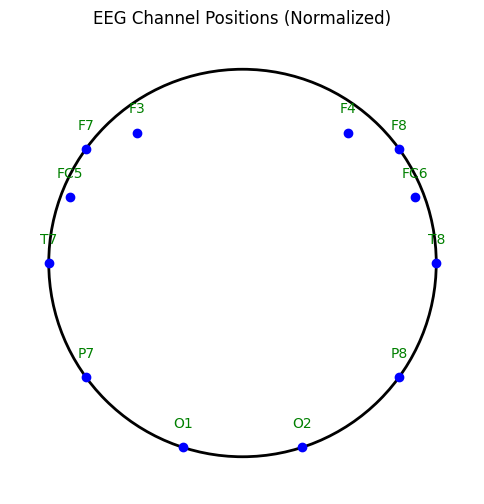

In [ ]:
# Extract the standard coordinates of the channels present in the dataset.
visualize_montage = mne.channels.make_standard_montage('standard_1020')
channel_name=['F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6','F4', 'F8']
locs_2d=[]
for channel in channel_name:
    pos=visualize_montage.get_positions()['ch_pos'][channel][:-1]
    locs_2d.append(pos)
locs_2d=np.vstack(locs_2d)
print(locs_2d)


channel_locations = {
 'F7': [-0.0768098, 0.05580558],
 'F3': [-0.05177571, 0.06393767],
 'FC5': [-0.08434934, 0.03237868],
 'T7': [-0.09494213, 0.0],
 'P7': [-0.0768098, -0.05580558],
 'O1': [-0.02933873, -0.09029533],
 'O2': [0.02933873, -0.09029533],
 'P8': [0.0768098, -0.05580558],
 'T8': [0.09494213, 0.0],
 'FC6': [0.08434934, 0.03237868],
 'F4': [0.05177571, 0.06393767],
 'F8': [0.0768098, 0.05580558]
}
# Visualize the coordinates of the channels
def normalize_positions(positions):
    max_radius = max(np.sqrt(x**2 + y**2) for x, y in positions.values())
    return {key: (x / max_radius, y / max_radius) for key, (x, y) in positions.items()}

normalized_locations = normalize_positions(channel_locations)

fig, ax = plt.subplots(figsize=(6, 6))
head_circle = plt.Circle((0, 0), 1, color='black', fill=False, lw=2)
ax.add_artist(head_circle)

for channel, (x, y) in normalized_locations.items():
    ax.plot(x, y, 'o', color='blue')
    ax.text(x, y + 0.1, channel, fontsize=10, ha='center', color='green')


ax.set_xlim([-1.2, 1.2])
ax.set_ylim([-1.2, 1.2])
ax.set_aspect('equal', adjustable='datalim')
ax.axis('off')
plt.title("EEG Channel Positions (Normalized)")
plt.show()

* **EXTRACT IMAGE DATA FROM EEG DATA**

In [ ]:
# The code is used to extract image features from the original digital signal data.
path = '/kaggle/input/d/anhphanmancity/eeg-data/'
output_dir="/kaggle/working/"
for i in range(0,5):
    df_list = []
    filelist=[]
    for idx in range(i*7+3,i*7+8):
        if(idx>34):
            continue
        filename=path+f"subject_{idx}.csv"
        df = pd.read_csv(filename)
        df_list.append(df)
        filelist.append(filename)
    combined_df = pd.concat(df_list, ignore_index=True)
    print(filelist)
    filename="experiment-{}v3".format(i+1)
    X_1, y_1 = make_data_pipeline(df=combined_df,image_size=28,frame_duration=1.0,overlap=0.3,locs_2d=locs_2d,output_dir=output_dir,filename=filename)
df, image_size, frame_duration, overlap, locs_2d,output_dir,filename

['/kaggle/input/d/anhphanmancity/eeg-data/subject_3.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_4.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_5.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_6.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_7.csv']
Interpolating 4266/4266nterpolating 144/4266Interpolating 308/4266Interpolating 471/4266Interpolating 627/4266Interpolating 784/4266Interpolating 950/4266Interpolating 1102/4266Interpolating 1267/4266Interpolating 1429/4266Interpolating 1591/4266Interpolating 1751/4266Interpolating 1915/4266Interpolating 2079/4266Interpolating 2235/4266Interpolating 2384/4266Interpolating 2540/4266Interpolating 2701/4266Interpolating 2846/4266Interpolating 3007/4266Interpolating 3161/4266Interpolating 3317/4266Interpolating 3475/4266Interpolating 3632/4266Interpolating 3789/4266Interpolating 3947/4266Interpolating 4108/42664266  frames generated with label  0 .

Interpolating 4266/4266nterpolating 141/4266Interpolating 30

KeyboardInterrupt: 

In [ ]:
# Load the data after the features have been extracted.
X_list,y_list=[],[]
for i in range(1, 6):
    data_path = f"/kaggle/input/brain-band-image/experiment-{i}v3.npz"
    experiment_data = np.load(data_path)

    f = experiment_data['X']
    l = experiment_data['y']

    X_list.append(f)
    y_list.append(l)

X_image = np.concatenate(X_list, axis=0)
y_image = np.concatenate(y_list, axis=0)

print(f"Data shape: {X_image.shape}, Labels shape: {y_image.shape}")


Data shape: (77090, 28, 28, 3), Labels shape: (77090,)


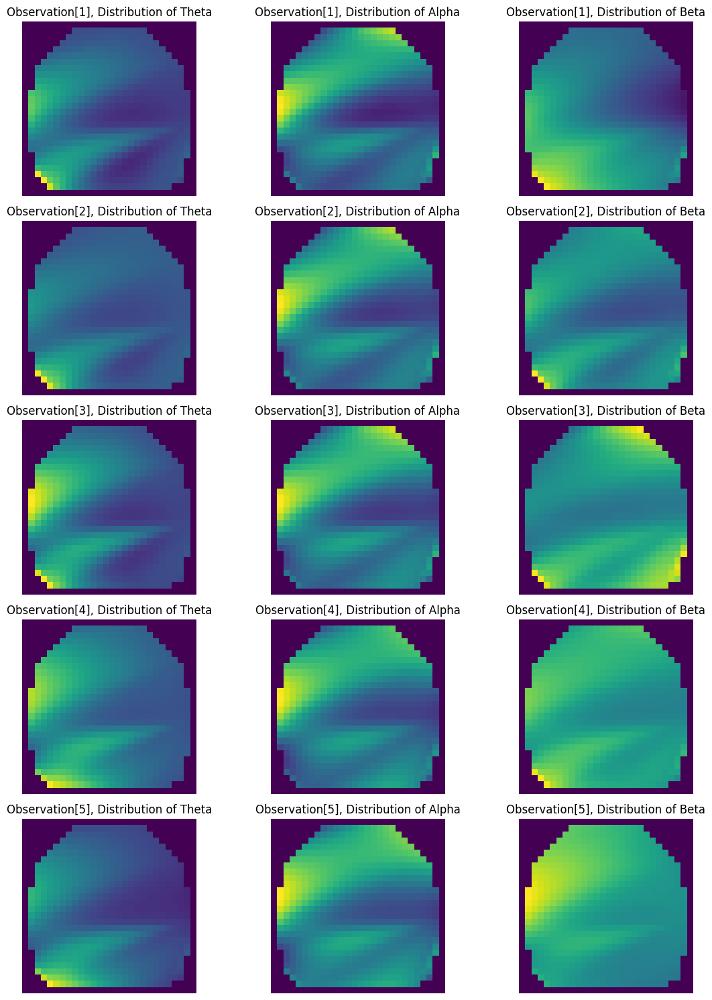

In [ ]:
idx2Categorical={
    1:"Theta",
    2:"Alpha",
    3:"Beta"
}
fig, axes = plt.subplots(5, 3, figsize=(12, 15))

for i, X in enumerate(X_list):

    mean_images = np.mean(X, axis=0)

    for j in range(3):
        axes[i, j].imshow(mean_images[:, :, j], cmap='viridis')
        axes[i, j].set_title(f"Observation[{i+1}], Distribution of {idx2Categorical[j+1]}")
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()



**Observation**: Due to the placement of the electrodes around the brain's perimeter, the color of the remaining pixels within the brain's region is approximated using interpolation methods from libraries. To assess the strength and distribution of brain waves, we will analyze whether there is significant distribution around the brain and the influence of values at the perimeter coordinates on neighboring pixels. This will help us draw conclusions about the distribution of each type of brain wave.

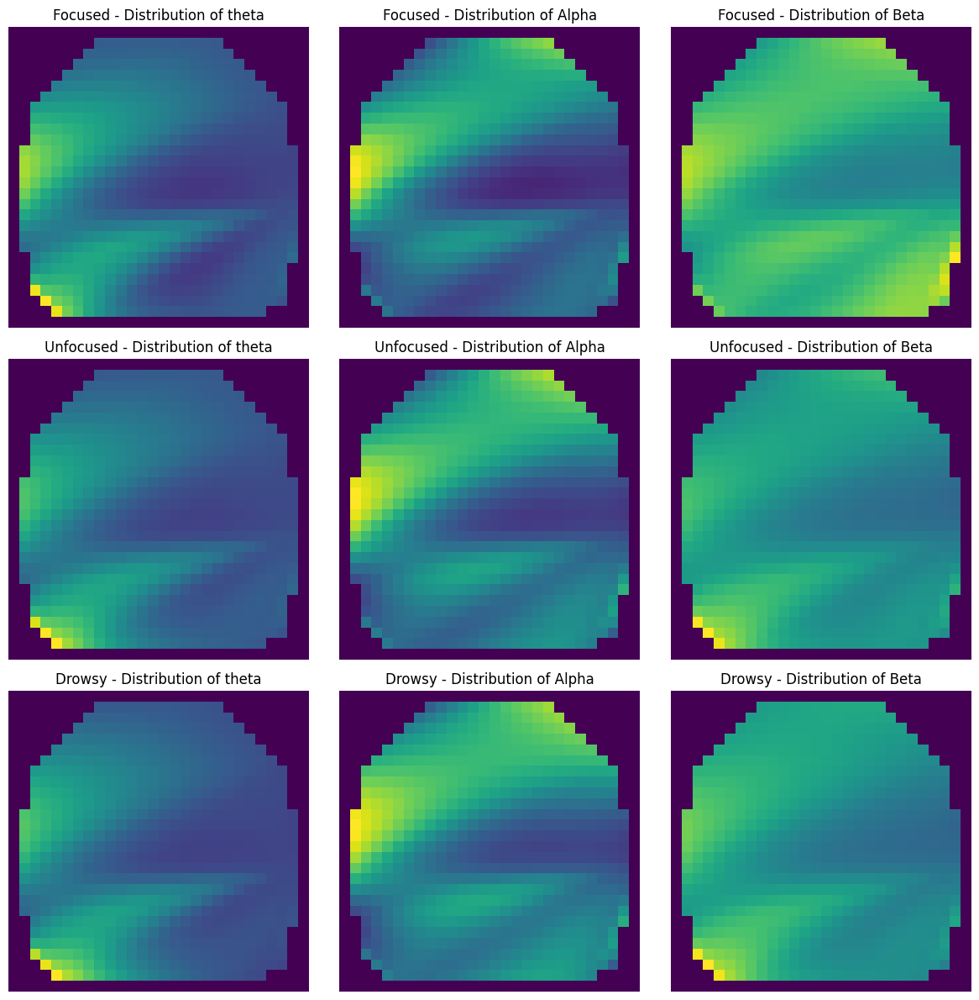

In [ ]:
idx2Categorical={
    1:"theta",
    2:"Alpha",
    3:"Beta"
}
idx_random=np.random.choice(X_image.shape[0], 20000, replace=False)
X_sample=X_image[idx_random]
y_random=y_image[idx_random]
n_sample = 20000


states = ["Focused", "Unfocused", "Drowsy"]

mean_images = np.zeros((3, 28, 28, 3))

for label in range(3):
    indices = np.where(y_image == label)[0]
    mean_images[label] = np.mean(X_image[indices], axis=0)

# Vẽ hình ảnh
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for i in range(3):
    for j in range(3):
        axes[i, j].imshow(mean_images[i, :, :, j], cmap='viridis')
        axes[i, j].set_title(f"{states[i]} - Distribution of {idx2_Categorical[j+1]}")
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


**Observation**  
- Beta waves are quite effective in identifying whether the observer is focused or not, and they clearly differentiate between the three states.  
- Alpha and Theta waves are harder to distinguish visually, which could hinder the classification process since the differences between the three states in these two types of waves are not very clear.  
- Therefore, the model might rely on the Beta wave range to distinguish the states of focus most effectively.

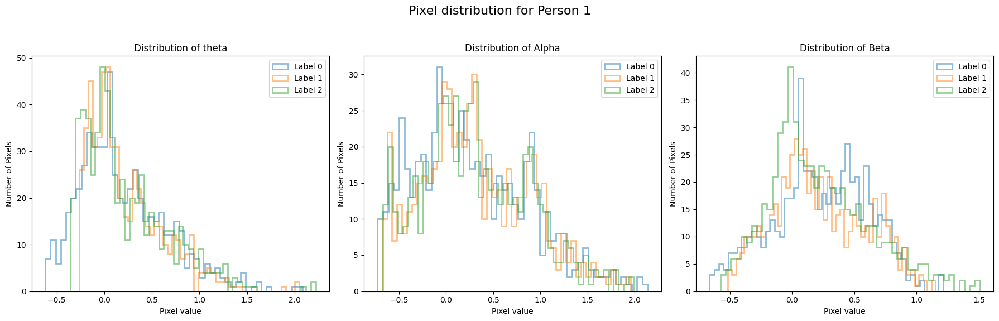

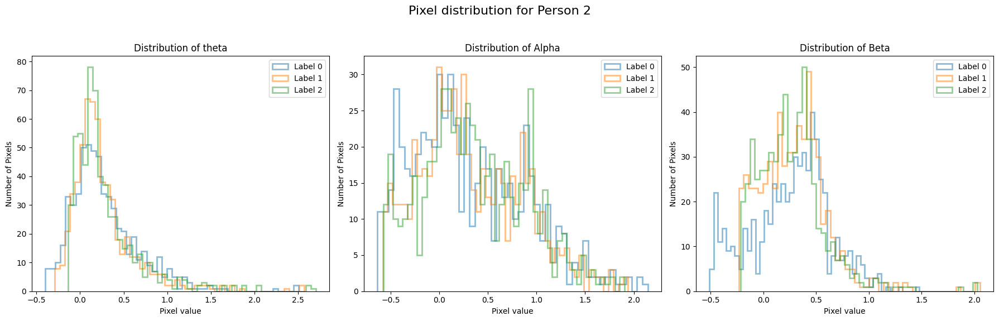

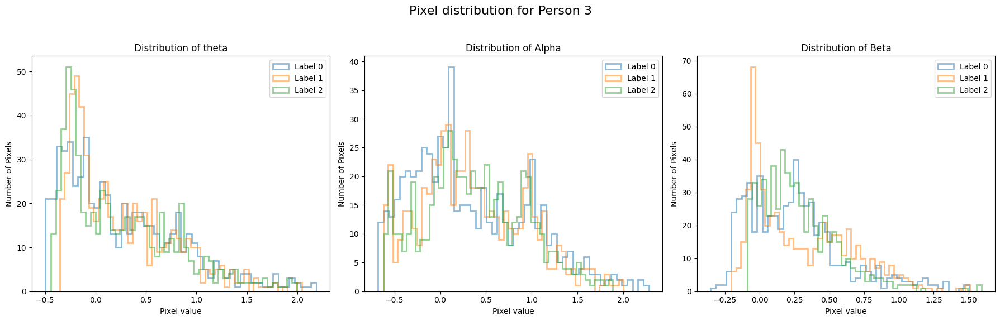

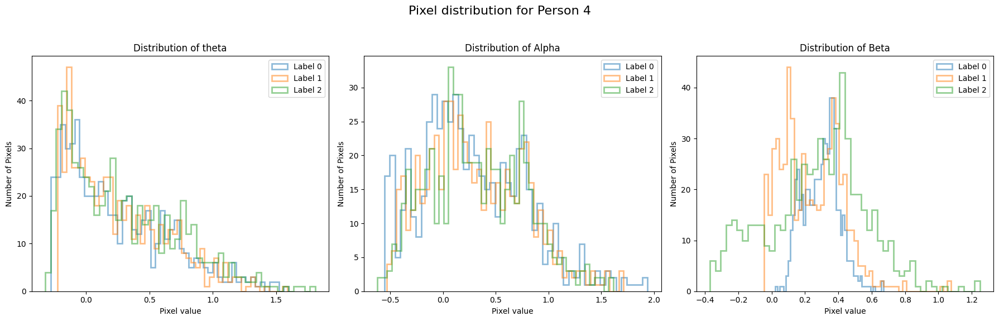

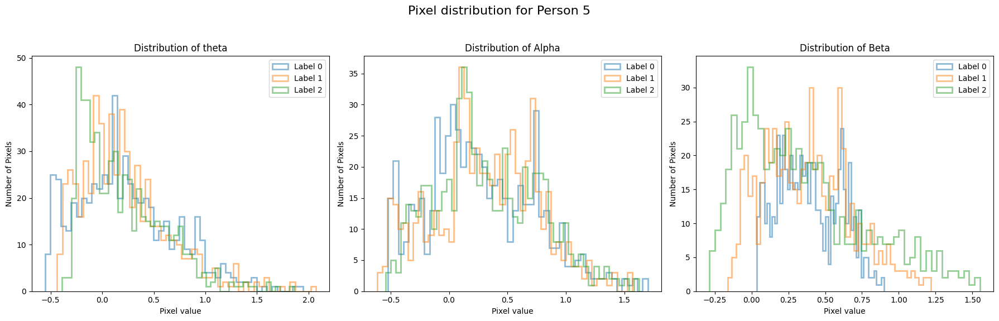

In [ ]:
n_labels = 3
for person_idx, (X, y) in enumerate(zip(X_list, y_list)):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Pixel distribution for Person {person_idx + 1}", fontsize=16)

    for channel_idx in range(3):
        ax = axes[channel_idx]


        for label in range(n_labels):
            label_indices = np.where(y == label)[0]
            channel_data = np.mean(X[label_indices, :, :, channel_idx],axis=0).flatten()

            # Tính mode và loại bỏ
            channel_mode = scs.mode(channel_data)[0]
            filtered_data = channel_data[channel_data != channel_mode]

            # Vẽ histogram
            ax.hist(filtered_data, bins=50, alpha=0.5, label=f"Label {label}", histtype='step', linewidth=2)

        ax.set_title(f"Distribution of {idx2Categorical[channel_idx+ 1]}")
        ax.set_xlabel("Pixel value")
        ax.set_ylabel("Number of Pixels")
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


**Observations**  
- The distribution of each label within each wave type does not differ significantly.  
- The differences are most apparent in **beta waves**, where in the *focused* state, the distribution curve is narrower, with smaller variance and a higher mean (greater than 0). This indicates that in this state, the images appear "brighter" and are more distinguishable from other states.  
- For **alpha waves**, it can be observed that in the *unfocused* and *drowsy* states, the distribution curves exhibit smaller variances compared to the *focused* state. In terms of imagery, the *focused* state would appear "darker" than the other two states. However, there is no significant difference between the *unfocused* and *drowsy* states in this wave type.  
- Regarding **theta waves**, the *drowsy* and *unfocused* states differ quite clearly from the *focused* state. Specifically, the *drowsy* state shows a more prominent distribution curve compared to the other two states. Consequently, in terms of imagery, the color channel for theta waves in the *drowsy* state would appear "brighter" compared to the other states.  

* **Data preparation steps for the training process:**
    - Adjust the number of samples to avoid class imbalance.
    - Normalize the data.
    - Split the dataset into training, testing, and validation sets.
    - Create dataloaders for each subset.


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def create_image_loader(X,y,sampling=False):
    if sampling is not False:
        X_resampled,y_resampled=balance_data(X,y)
    else:
        X_resampled,y_resampled=X,y
    H,W,C=28,28,3
    batch_size=128
    X_reshaped=X_resampled.reshape(-1,C)
    scaler = StandardScaler()
    X_reshaped=scaler.fit_transform(X_reshaped)
    X_reshaped=scaler.transform(X_reshaped)
    X_normalized=X_reshaped.reshape(X_resampled.shape)

    x_train, x_test, y_train, y_test = train_test_split(X_normalized, y_resampled, test_size=0.30,shuffle=True)
    x_train,x_valid,y_train,y_valid = train_test_split(x_train, y_train, test_size=0.20,shuffle=True)
    # input image dimensions
    img_rows, img_cols = 28, 28

    print('x_train shape:', x_train.shape)
    print(x_train.shape[0], 'train samples')
    print(x_test.shape[0], 'test samples')
    print(x_valid.shape[0],'valid samples')

    input_shape = (img_rows, img_cols, 3)
    # Preprocess the input data (normalize to range [0, 1])
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_valid = x_valid.astype('float32')

    # Convert to torch tensors
    x_train_tensor = torch.tensor(x_train).permute(0, 3,1, 2) .to(device) # Convert to (batch, channels, height, width)
    x_test_tensor = torch.tensor(x_test).permute(0, 3,1, 2).to(device)
    x_valid_tensor=torch.tensor(x_valid).permute(0,3,1, 2).to(device)

    y_train_tensor = torch.tensor(y_train).to(device)
    y_test_tensor = torch.tensor(y_test).to(device)
    y_valid_tensor = torch.tensor(y_valid).to(device)

    # Create DataLoader for training and testing datasets
    train_dataset = TensorDataset(x_train_tensor, y_train_tensor,)
    test_dataset = TensorDataset(x_test_tensor, y_test_tensor)
    valid_dataset=TensorDataset(x_valid_tensor, y_valid_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    valid_loader=DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

    return train_loader,test_loader,valid_loader

* **Create the necessary layers to build a CNN model based on the ResNet architecture concept**

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(out_channels)
        self.batchnorm2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.LeakyReLU()

        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else None

    def forward(self, x):
        identity = x
        out = self.relu(self.batchnorm1(self.conv1(x)))
        out = self.batchnorm2(self.conv2(out))

        if self.shortcut is not None:
            identity = self.shortcut(identity)

        out += identity
        out = self.relu(out)
        return out
class CNNModel(nn.Module):
    def __init__(self, input_shape, num_classes):
        super(CNNModel, self).__init__()

        # Define the layers
        self.res_block1=ResidualBlock(input_shape[2],out_channels=64)
        self.res_block2=ResidualBlock(in_channels=64,out_channels=64)
        self.res_block3=ResidualBlock(in_channels=64,out_channels=128)
        self.res_block4=ResidualBlock(in_channels=128,out_channels=256)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(256 * (input_shape[0] // 4 ) * (input_shape[1] // 4 ), 784)
        self.batchnorm1 = nn.BatchNorm1d(784)
        self.dropout = nn.Dropout(p=0.1)
        self.fc2 = nn.Linear(784, 32)
        self.activation = nn.LeakyReLU()
        self.batchnorm2=nn.BatchNorm1d(32)
        self.fc3=nn.Linear(32,num_classes)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.res_block1(x)
        x=self.res_block2(x)
        x = self.pool(x)
        x=self.res_block3(x)
        x=self.res_block4(x)
        x=self.pool(x)
        x = self.flatten(x)
        x = self.activation(self.fc1(x))
        x = self.batchnorm1(x)
        x = self.dropout(x)
        x = self.activation(self.fc2(x))
        x=self.batchnorm2(x)
        x=self.dropout(x)
        x=self.fc3(x)
        score=self.softmax(x)
        return x,score




* **Training and evaluation procces**

x_train shape: (43170, 28, 28, 3)
43170 train samples
23127 test samples
10793 valid samples
Epoch [0/5], Loss: 0.6905, Accuracy: 71.43% , AUC: 0.8851,f1:0.71
              precision    recall  f1-score   support

         0.0       0.81      0.97      0.88      2853
         1.0       0.75      0.83      0.78      2937
         2.0       0.96      0.79      0.86      5003

    accuracy                           0.85     10793
   macro avg       0.84      0.86      0.84     10793
weighted avg       0.86      0.85      0.85     10793

AUC: 0.9625
F1 Score: 0.8438
Test Accuracy: 84.68%
Epoch [1/5], Loss: 0.3914, Accuracy: 87.39% , AUC: 0.9755,f1:0.87
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      2853
         1.0       0.87      0.89      0.88      2937
         2.0       0.96      0.92      0.94      5003

    accuracy                           0.92     10793
   macro avg       0.92      0.92      0.92     10793
weighted avg     

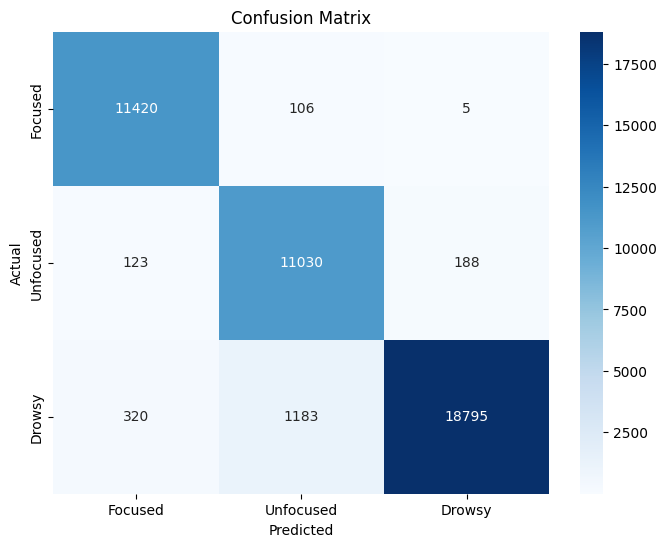

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size = 128
num_classes = 3
epochs = 5
learning_rate = 1e-5
# Create class weights for the loss function to prevent model bias towards the class with more samples.
class_counts=count_classes(y)
class_weights = 1.0 / class_counts
class_weights = torch.tensor(class_weights / class_weights.min(), dtype=torch.float32).to(device)

model = CNNModel(input_shape=(28, 28, 3),num_classes=3).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate,weight_decay=1e-4)
criterion=nn.CrossEntropyLoss(weight=class_weights)
train_loader,test_loader,valid_loader=create_image_loader(X=X_image,y=y_image,sampling=False)
train_metrics,valid_metrics=train(model,train_loader=train_loader,valid_loader=valid_loader,criterion=criterion,optimizer=optimizer,epochs=epochs)

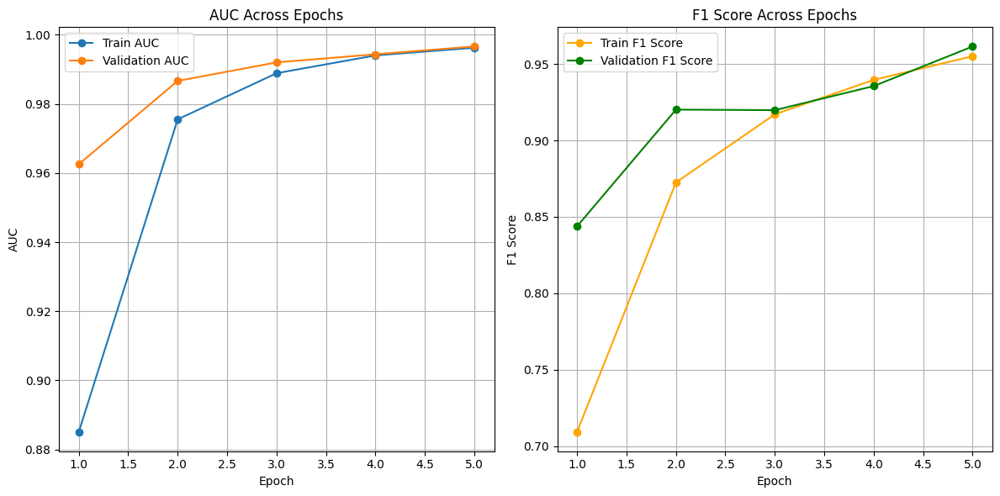

In [ ]:
def plot_metrics(train_auc, valid_auc, train_f1, valid_f1, epochs):
    """
    Plot AUC and F1 score for training and validation sets.

    Parameters:
    - train_auc: List or array of AUC values for the training set.
    - valid_auc: List or array of AUC values for the validation set.
    - train_f1: List or array of F1 scores for the training set.
    - valid_f1: List or array of F1 scores for the validation set.
    - epochs: Number of epochs (used for x-axis).

    Returns:
    - None
    """
    x = range(1, epochs + 1)

    # Plot AUC
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)  # Create the first subplot
    plt.plot(x, train_auc, label='Train AUC', marker='o')
    plt.plot(x, valid_auc, label='Validation AUC', marker='o')
    plt.title('AUC Across Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()
    plt.grid()

    # Plot F1 Score
    plt.subplot(1, 2, 2)  # Create the second subplot
    plt.plot(x, train_f1, label='Train F1 Score', marker='o', color='orange')
    plt.plot(x, valid_f1, label='Validation F1 Score', marker='o', color='green')
    plt.title('F1 Score Across Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

plot_metrics(train_auc=train_metrics[0], valid_auc=valid_metrics[0], train_f1=train_metrics[1], valid_f1=valid_metrics[1], epochs=5)

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.98      6092
         1.0       0.93      0.97      0.95      6136
         2.0       0.99      0.95      0.97     10899

    accuracy                           0.96     23127
   macro avg       0.96      0.97      0.96     23127
weighted avg       0.96      0.96      0.96     23127

AUC: 0.9965
F1 Score: 0.9634
Test Accuracy: 96.39%
Confusion Matrix:
[[ 6054    36     2]
 [   84  5923   129]
 [  170   413 10316]]


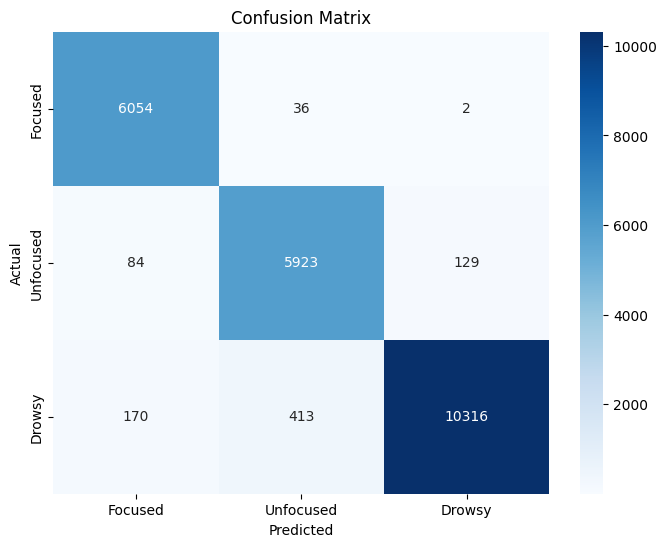

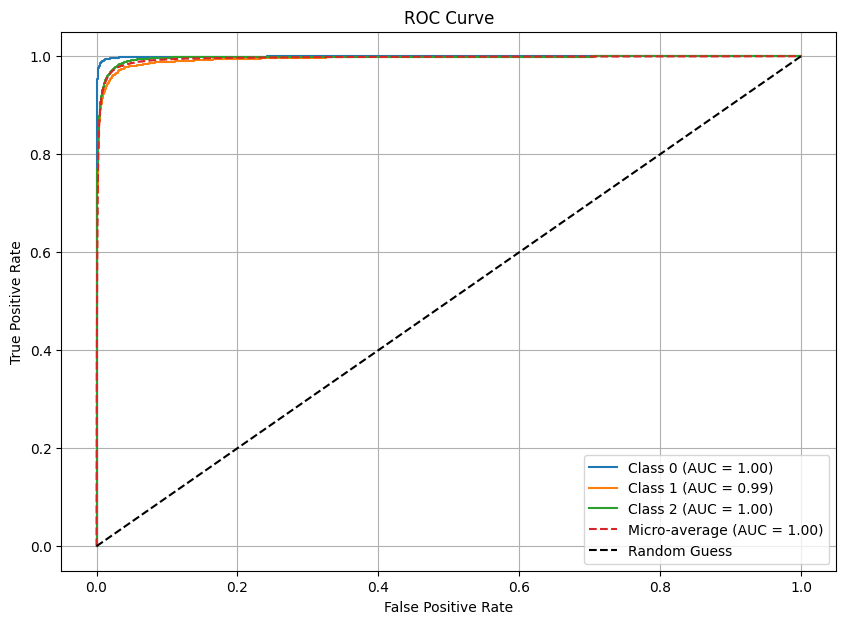

In [ ]:
def plot_ROC_curves(model, test_loader):
    _,fpr, tpr, roc_auc_per_class = evaluate(model, test_loader,print_matrix=True)

    plt.figure(figsize=(10, 7))

    # Vẽ ROC curve cho từng lớp
    for i in range(3):  # Lặp qua 3 lớp (0, 1, 2)
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc_per_class[i]:.2f})')

    # Vẽ ROC curve cho micro-average
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc_per_class["micro"]:.2f})', linestyle='--')

    # Vẽ đường chéo cho random guessing
    plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")

    # Các thông số cho đồ thị
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
plot_ROC_curves(model,test_loader=test_loader)

**Observations**:  
- The area under the curve (AUC) for all classes (Class 0, Class 1, and Class 2) is close to 1.00. This indicates that the model can perfectly distinguish between the classes. The micro-average AUC score is also 1.00, reinforcing this conclusion. This can be explained by the differences in the distribution of wave bands and states, as analyzed earlier. The CNN model, which incorporates part of the ResNet architecture, is capable of learning these features effectively and making highly accurate predictions.  
- The F1-score of 0.96 is very high, and from the confusion matrix, it is evident that the model predicts the classes clearly with only minimal error
- The model shows no signs of overfitting because the F1_score and accuracy indexes still increase on both validation and training sets.  

**Using oversampling to address imbalanced data and retrain the model**

x_train shape: (60816, 28, 28, 3)
60816 train samples
32580 test samples
15204 valid samples
Epoch [0/5], Loss: 0.5598, Accuracy: 76.24% , AUC: 0.9161,f1:0.76
              precision    recall  f1-score   support

         0.0       0.91      0.98      0.94      5021
         1.0       0.87      0.89      0.88      5176
         2.0       0.94      0.84      0.89      5007

    accuracy                           0.90     15204
   macro avg       0.91      0.90      0.90     15204
weighted avg       0.91      0.90      0.90     15204

AUC: 0.9822
F1 Score: 0.9038
Test Accuracy: 90.44%
Epoch [1/5], Loss: 0.2758, Accuracy: 91.48% , AUC: 0.9857,f1:0.91
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      5021
         1.0       0.86      0.98      0.92      5176
         2.0       0.98      0.85      0.91      5007

    accuracy                           0.94     15204
   macro avg       0.94      0.93      0.94     15204
weighted avg     

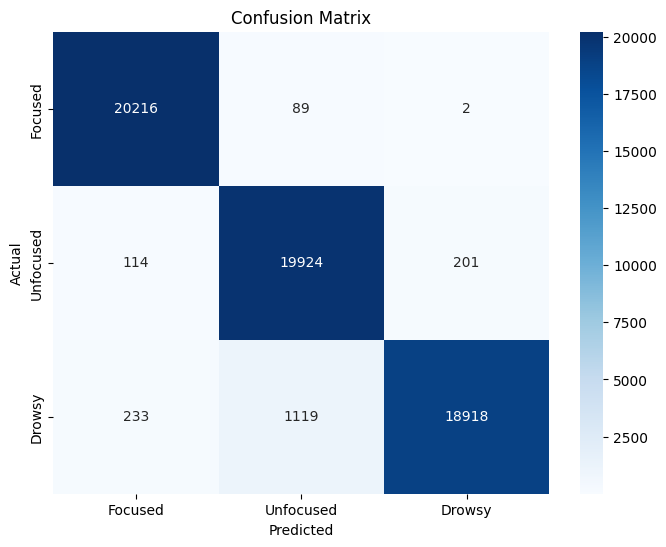

In [ ]:
train_loader,test_loader,valid_loader=create_image_loader(X=X_image,y=y_image,sampling=True)
train_metrics,valid_metrics=train(model,train_loader=train_loader,valid_loader=valid_loader,criterion=criterion,optimizer=optimizer,epochs=epochs)

**Re-predict the model on the old data set to ensure correctness**

x_train shape: (43170, 28, 28, 3)
43170 train samples
23127 test samples
10793 valid samples
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      6090
         1.0       0.88      1.00      0.94      6094
         2.0       1.00      0.93      0.96     10943

    accuracy                           0.96     23127
   macro avg       0.96      0.97      0.96     23127
weighted avg       0.97      0.96      0.96     23127

AUC: 0.9984
F1 Score: 0.9626
Test Accuracy: 96.19%
Confusion Matrix:
[[ 6041    49     0]
 [   11  6065    18]
 [   52   752 10139]]


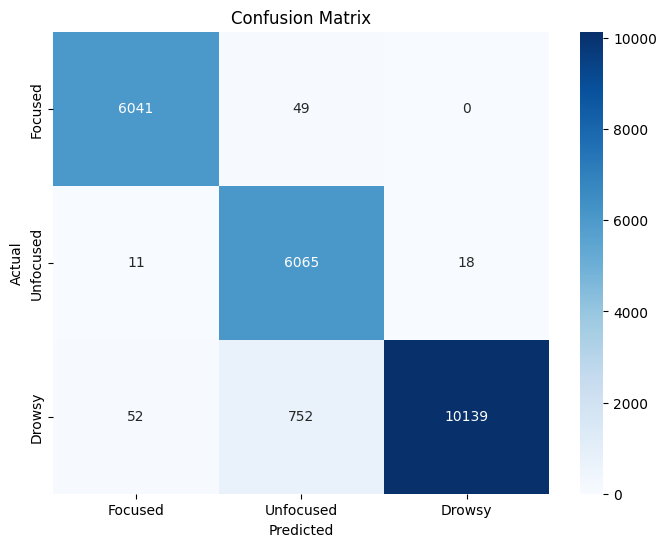

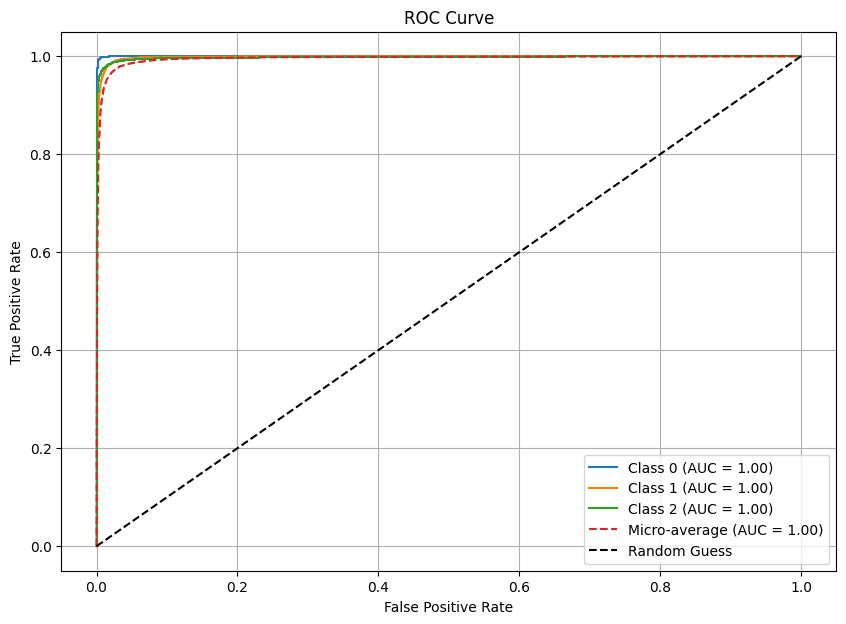

In [ ]:
_,test_loader,_=create_image_loader(X=X_image,y=y_image,sampling=False)
plot_ROC_curves(model,test_loader=test_loader)

**Observations**:  
- After applying sampling techniques to the training dataset, we observe that the model's performance does not change significantly.  
- This suggests that the model has learned the dataset very well and does not show signs of overfitting, as the metrics on both the training and validation sets consistently improve without any decline.  

### CONVOLUTION 1D FOR EEG DATA

* Generate training data samples, where each sample consists of 128 samples from the original dataset and the samples overlap by a ratio of 0.3.

In [ ]:
path = '/kaggle/input/d/anhphanmancity/eeg-data/' # Path to the original dataset.
output_dir="/kaggle/working/" # Path to the output data
state_encode = {
        '1': 0,
        '2': 1,
        '0': 2
    }

for i in range(0,5):
    df_list = []
    filelist=[]
    for idx in range(i*7+3,i*7+8):
        if(idx>34):
            continue
        filename=path+f"subject_{idx}.csv"
        df = pd.read_csv(filename)
        df_list.append(df)
        filelist.append(filename)
    combined_df = pd.concat(df_list, ignore_index=True).drop(columns=["AF3","AF4"])
    print(filelist)
    steps=make_steps(len(combined_df),1.0,0.3)

    epoch_array=[]
    labels=[]

    for start,end in steps:
        snippet=np.array(combined_df.iloc[int(start):int(end),:-1])
        labels.append(state_encode[str(combined_df["state"].iloc[int(start)])])
        epoch_array.append(snippet)
    filename=f"experiment-{i+1}-signal"
    np.savez(output_dir+filename+".npz",X=epoch_array,y=labels)
    print("successful in subject {}".format(i+1))

['/kaggle/input/d/anhphanmancity/eeg-data/subject_3.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_4.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_5.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_6.csv', '/kaggle/input/d/anhphanmancity/eeg-data/subject_7.csv']


KeyboardInterrupt: 

In [ ]:
# Load the data from file .npz
X_signal, y_signal = [], []
for i in range(1, 6):
    file_path = f"/kaggle/input/signal-subjectv2/experiment-{i}-signal.npz"
    data = np.load(file_path)
    f, l = data['X'], data['y']

    X_signal.append(f)
    y_signal.append(l)

X_signal = np.concatenate(X_signal, axis=0)
y_signal = np.concatenate(y_signal, axis=0)


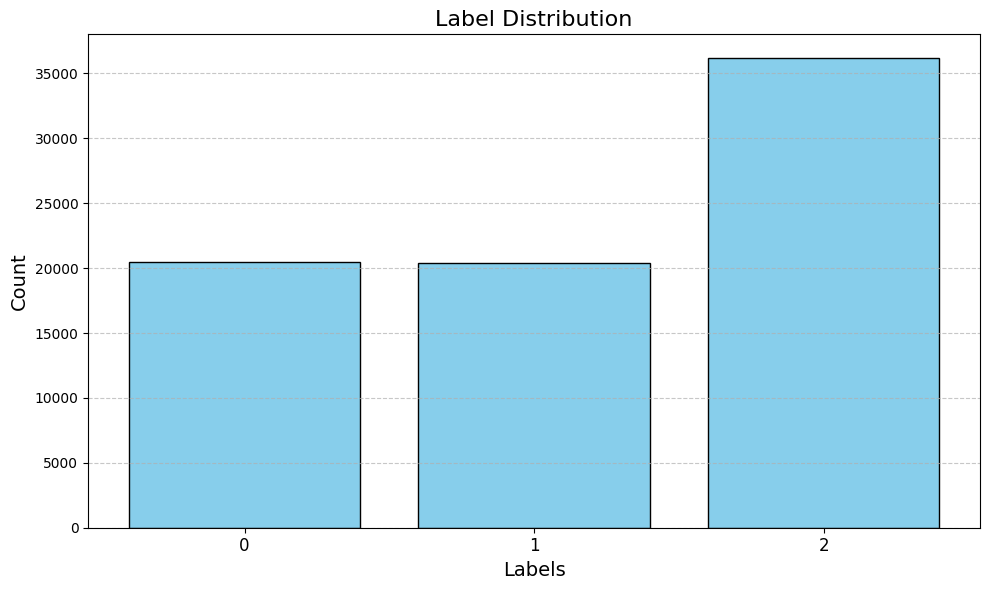

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_label_distribution(subject_y):
    """
    Plots the label distribution as a bar chart.

    Parameters:
    subject_y (np.array): The array containing the labels (e.g., 'state').
    """
    # Count the occurrences of each label
    unique, label_counts = np.unique(subject_y, return_counts=True)

    # Plot the bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(unique, label_counts, color='skyblue', edgecolor='black')

    # Add titles and labels
    plt.title('Label Distribution', fontsize=16)
    plt.xlabel('Labels', fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(unique, rotation=0, fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show the plot
    plt.tight_layout()
    plt.show()

plot_label_distribution(subject_y=y_signal)


* Comment: Although the data is imbalanced, it is not too severe, but it will affect the model training process

* Data preparation steps for the training process:
    - Adjust the number of samples to avoid class imbalance.
    - Normalize the data.
    - Split the dataset into training, testing, and validation sets.
    - Create dataloaders for each subset.

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def create_signal_loader(X,y,sampling=False):
    if sampling:
        X_resampled,y_resampled=balance_data(X,y)
    else:
        X_resampled,y_resampled=X,y
    H = 128
    C = 12
    samples=X_resampled.shape[0]
    scaler = StandardScaler()
    X_reshaped = X_resampled.reshape(-1, C)
    X_normalized = scaler.fit_transform(X_reshaped)
    X_normalized = X_normalized.reshape(samples, H, C)
    X_normalized = np.transpose(X_normalized, (0, 2, 1))

    x_train, x_test, y_train, y_test = train_test_split(X_normalized, y_resampled, test_size=0.20,shuffle=True)
    x_train,x_valid,y_train,y_valid = train_test_split(x_train, y_train, test_size=0.20,shuffle=True)

    print('x_train shape:', x_train.shape)
    print(x_train.shape[0], 'train samples')
    print(x_test.shape[0], 'test samples')
    print(x_valid.shape[0],'valid samples')

    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_valid = x_valid.astype('float32')

    x_train_tensor = torch.tensor(x_train).to(device)
    x_test_tensor = torch.tensor(x_test).to(device)
    x_valid_tensor=torch.tensor(x_valid).to(device)

    y_train_tensor = torch.tensor(y_train).to(device)
    y_test_tensor = torch.tensor(y_test).to(device)
    y_valid_tensor = torch.tensor(y_valid).to(device)

    # Create DataLoader for training and testing datasets
    train_dataset = TensorDataset(x_train_tensor, y_train_tensor,)
    test_dataset = TensorDataset(x_test_tensor, y_test_tensor)
    valid_dataset=TensorDataset(x_valid_tensor, y_valid_tensor)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
    valid_loader=DataLoader(valid_dataset, batch_size=64, shuffle=False)

    return train_loader,test_loader,valid_loader



* **Functions for the training and evaluation process**

In [ ]:
def train(model,train_loader, valid_loader,criterion,optimizer,epochs,print_matrix=True):
    valid_auc=[]
    valid_f1=[]
    train_auc=[]
    train_f1=[]
    model.train()
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        all_labels = []
        all_probs = []


        for inputs, labels in train_loader:
            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            outputs,score = model(inputs)

            labels = labels.long()
            # Compute the loss
            loss = criterion(outputs, labels).to(device)
            #loss=focal_loss(outputs,labels).to(device)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(score, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.append(labels.cpu().numpy())
            all_probs.append(torch.softmax(outputs, dim=1).cpu().detach().numpy())


        all_labels = np.concatenate(all_labels, axis=0)
        all_probs = np.concatenate(all_probs, axis=0)

        if all_labels.ndim == 1:
            all_labels = np.eye(num_classes)[all_labels]
        roc_auc = roc_auc_score(all_labels, all_probs, multi_class='ovr', average='macro')
        if all_labels.ndim > 1:
            all_labels = np.argmax(all_labels, axis=1)
        predicted_classes = np.argmax(all_probs, axis=1)
        f1 = f1_score(all_labels, predicted_classes, average='macro')
        print(f"Epoch [{epoch}/{epochs}], Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100*correct/total:.2f}% , AUC: {roc_auc:.4f},f1:{f1:.2f}")
        metrics,_,_,_=evaluate(model,valid_loader)
        valid_auc.append(metrics[0])
        valid_f1.append(metrics[1])
        train_auc.append(roc_auc)
        train_f1.append(f1)


    if print_matrix is not False:
        cm = confusion_matrix(all_labels, predicted_classes)
        print("Confusion Matrix:")
        print(cm)
        plot_confusion_matrix(cm, labels=["Focused", "Unfocused", "Drowsy"])
    return [train_auc,train_f1],[valid_auc,valid_f1]




def evaluate(model, dataloader,print_matrix=False):
    model.eval()
    correct = 0
    total = 0
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs, score = model(inputs)
            _, predicted = torch.max(score, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.append(labels.cpu().numpy())
            all_probs.append(torch.softmax(outputs, dim=1).cpu().detach().numpy())

    all_labels = np.concatenate(all_labels, axis=0)
    all_probs = np.concatenate(all_probs, axis=0)

    all_labels_bin = label_binarize(all_labels, classes=[0, 1, 2])

    roc_auc = roc_auc_score(all_labels_bin, all_probs, multi_class='ovr', average='macro')

    predicted_classes = np.argmax(all_probs, axis=1)
    f1 = f1_score(all_labels, predicted_classes, average='macro')

    print(classification_report(all_labels, predicted_classes))

    print(f"AUC: {roc_auc:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"Test Accuracy: {100 * correct / total:.2f}%")

    if print_matrix is not False:
        cm = confusion_matrix(all_labels, predicted_classes)
        print("Confusion Matrix:")
        print(cm)
        plot_confusion_matrix(cm, labels=["Focused", "Unfocused", "Drowsy"])


    fpr, tpr, roc_auc_per_class = {}, {}, {}


    for i in range(3):  # 3 lớp (0, 1, 2)
        fpr[i], tpr[i], _ = roc_curve(all_labels_bin[:, i], all_probs[:, i])
        roc_auc_per_class[i] = auc(fpr[i], tpr[i])


    fpr["micro"], tpr["micro"], _ = roc_curve(all_labels_bin.ravel(), all_probs.ravel())
    roc_auc_per_class["micro"] = auc(fpr["micro"], tpr["micro"])

    return [roc_auc, f1], fpr, tpr, roc_auc_per_class
def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

* Create a CNN model structure with Conv1D layers, Pooling layers, and Fully Connected layers.

In [ ]:
class EEGNet(nn.Module):
    def __init__(self, inp_shape,classes):
        super(HopefullNet, self).__init__()
        self.inp_shape = inp_shape

        self.kernel_size_0 = 35
        self.kernel_size_1 = 1
        self.drop_rate = 0.5

        self.conv1 = nn.Conv1d(in_channels=inp_shape[1],
                               out_channels=32,
                               kernel_size=self.kernel_size_0,
                               padding='same')
        self.batch_n_1 = nn.BatchNorm1d(32)
        self.conv2 = nn.Conv1d(in_channels=32,
                               out_channels=32,
                               kernel_size=self.kernel_size_0)
        self.batch_n_2 = nn.BatchNorm1d(32)
        self.avg_pool1 = nn.AvgPool1d(kernel_size=2)
        self.spatial_drop_1 = nn.Dropout(self.drop_rate)
        self.conv3 = nn.Conv1d(in_channels=32,
                               out_channels=64,
                               kernel_size=self.kernel_size_1)

        self.conv4 = nn.Conv1d(in_channels=64,
                               out_channels=64,
                               kernel_size=self.kernel_size_1)
        self.avg_pool2 = nn.AvgPool1d(kernel_size=2)
        self.spatial_drop_2 = nn.Dropout(self.drop_rate)
        self.flat = nn.Flatten()
        self.dense1 = nn.Linear(64 * (((inp_shape[0] - 35 + 1) // 2)), 128)
        self.dropout1 = nn.Dropout(self.drop_rate)
        self.dense2 = nn.Linear(128, 64)
        self.dropout2 = nn.Dropout(self.drop_rate)
        self.dense3 = nn.Linear(64, 32)
        self.dropout3 = nn.Dropout(self.drop_rate)
        self.out = nn.Linear(32, classes)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batch_n_1(x)
        x = F.relu(self.conv2(x))
        x = self.batch_n_2(x)
        x = self.spatial_drop_1(x)
        x = self.avg_pool1(x)
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.spatial_drop_2(x)
        x = self.flat(x)
        x = F.relu(self.dense1(x))
        x = self.dropout1(x)
        x = F.relu(self.dense2(x))
        x = self.dropout2(x)
        x = F.relu(self.dense3(x))
        x = self.dropout3(x)
        x=self.out(x)
        score=self.softmax(x)

        return x,score


* **Initialize the model and start the training and evaluation process**

x_train shape: (37007, 12, 128)
37007 train samples
30840 test samples
9252 valid samples
Epoch [0/20], Loss: 1.0681, Accuracy: 42.08% , AUC: 0.5892,f1:0.37
              precision    recall  f1-score   support

           0       0.44      0.78      0.56      2481
           1       0.36      0.05      0.09      2511
           2       0.63      0.66      0.65      4260

    accuracy                           0.53      9252
   macro avg       0.48      0.50      0.43      9252
weighted avg       0.50      0.53      0.47      9252

AUC: 0.6984
F1 Score: 0.4340
Test Accuracy: 52.82%
Epoch [1/20], Loss: 0.9787, Accuracy: 52.67% , AUC: 0.6922,f1:0.50
              precision    recall  f1-score   support

           0       0.57      0.61      0.59      2481
           1       0.36      0.47      0.41      2511
           2       0.71      0.54      0.61      4260

    accuracy                           0.54      9252
   macro avg       0.54      0.54      0.54      9252
weighted avg      

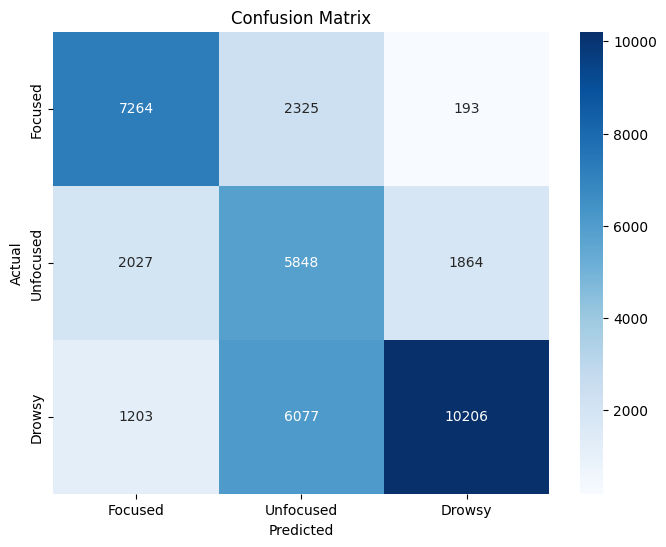

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_shape=(128,12)
num_classes = 3
epochs = 20
learning_rate = 1e-3
# Create class weights for the loss function to prevent model bias towards the class with more samples.
class_counts=count_classes(y)
class_weights = 1.0 / class_counts
class_weights = torch.tensor(class_weights / class_weights.min(), dtype=torch.float32).to(device)
# initialize dataloader
train_loader,test_loader,valid_loader=create_signal_loader(X=X_signal,y=y_signal)

model2=EEGNet(inp_shape=input_shape,classes=num_classes).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model2.parameters(), lr=learning_rate,weight_decay=1e-5)

train_metrics,valid_metrics=train(model2,train_loader=train_loader,valid_loader=valid_loader,criterion=criterion,optimizer=optimizer,epochs=epochs)

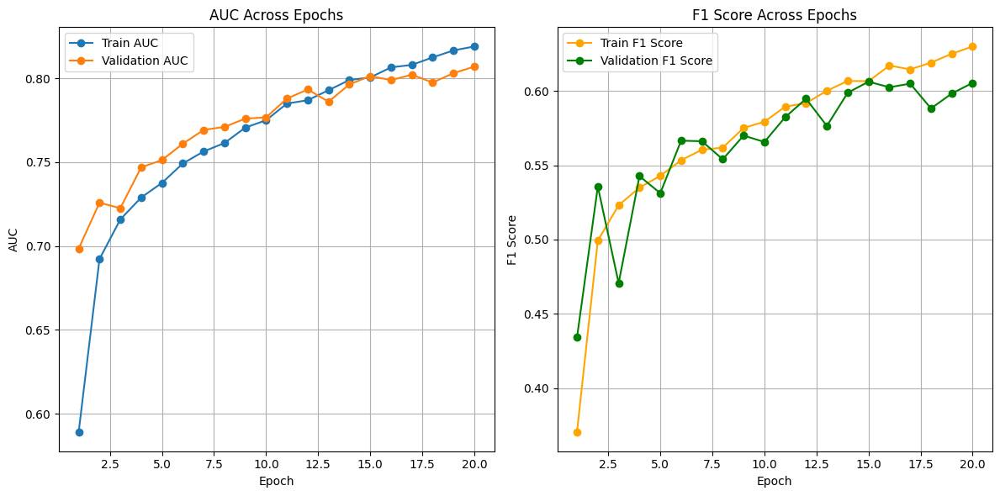

In [ ]:
plot_metrics(train_auc=train_metrics[0], valid_auc=valid_metrics[0], train_f1=train_metrics[1], valid_f1=valid_metrics[1], epochs=20)


              precision    recall  f1-score   support

           0       0.67      0.73      0.70      8220
           1       0.39      0.61      0.48      8167
           2       0.84      0.54      0.66     14453

    accuracy                           0.61     30840
   macro avg       0.64      0.63      0.61     30840
weighted avg       0.68      0.61      0.62     30840

AUC: 0.8102
F1 Score: 0.6115
Test Accuracy: 60.86%
Confusion Matrix:
[[6005 2036  179]
 [1902 4978 1287]
 [1074 5593 7786]]


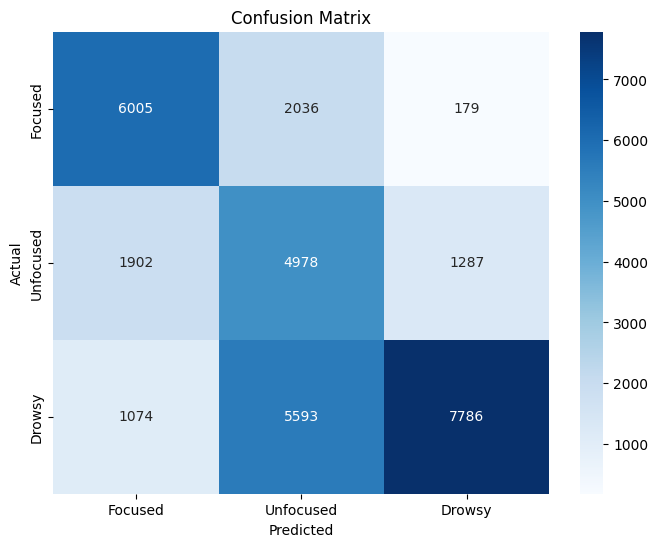

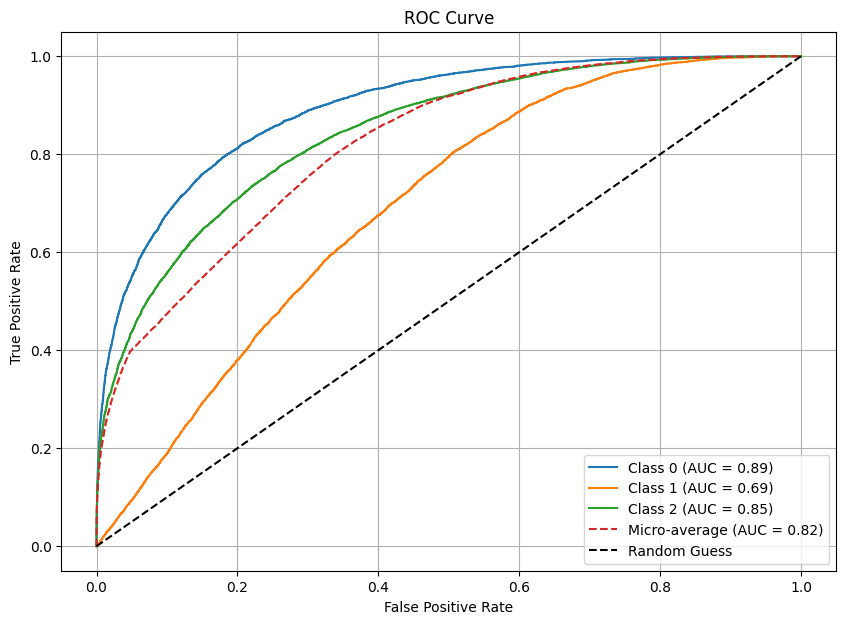

In [ ]:
plot_ROC_curves(model2,test_loader=test_loader)

**Comments**

- Overall, looking at the graph of the metrics: The model did not learn very well, as the F1_score only reached 0.65 with this imbalanced dataset. However, the AUC score is quite high, exceeding 0.8, which indicates that the model has good ability to distinguish between the 3 classes. However, when it comes to accurate classification, the model still faces challenges. This can be explained by the imbalance in the data, making it difficult to accurately classify which class a sample belongs to.

- Based on the confusion matrix: We can see that Class 1 is relatively well classified, but it is still often confused with Class 0. This could be due to the fact that the "focused" and "unfocused" states are not clearly distinguishable, especially when the "focused" state is only observed for 10 minutes. Class 2 is often confused with Class 1, which may explain why, in the "drowsy" state, many of the subjects in the experiment were not actually feeling sleepy.

- Class 0:

- The ROC curve for Class 0 is the highest among the classes, indicating that the model performs best when classifying Class 0.
- The area under the curve (AUC) is 0.89, showing that the model can distinguish between Class 0 and the other classes very well.
- Class 1:
- The ROC curve for Class 1 is the lowest compared to the other classes.
- AUC = 0.69, indicating a significantly lower discrimination performance than Class 0 and Class 2. This is because the signals from Class 1 do not have clear enough distinctions to differentiate from the other two classes.
- Class 2:
- The ROC curve for Class 2 is in between the curves for the other two classes.
- AUC = 0.85, showing that the model performs well, but not as well as Class 0.

* Train on a balanced dataset, using the oversampling method. Với phương pháp này dữ liệu của hai nhãn bị mất cân bằng sẽ bằng với số lượng của nhãn có mẫu lớn nhất. Tuy nhiên sẽ

x_train shape: (52126, 12, 128)
52126 train samples
43439 test samples
13032 valid samples
Epoch [0/20], Loss: 1.0048, Accuracy: 42.28% , AUC: 0.6436,f1:0.38
              precision    recall  f1-score   support

           0       0.65      0.56      0.60      4289
           1       0.41      0.65      0.50      4342
           2       0.63      0.35      0.45      4401

    accuracy                           0.52     13032
   macro avg       0.57      0.52      0.52     13032
weighted avg       0.56      0.52      0.52     13032

AUC: 0.7202
F1 Score: 0.5173
Test Accuracy: 51.83%
Epoch [1/20], Loss: 0.9281, Accuracy: 50.51% , AUC: 0.7118,f1:0.48
              precision    recall  f1-score   support

           0       0.67      0.58      0.63      4289
           1       0.42      0.76      0.54      4342
           2       0.78      0.26      0.39      4401

    accuracy                           0.53     13032
   macro avg       0.62      0.53      0.52     13032
weighted avg     

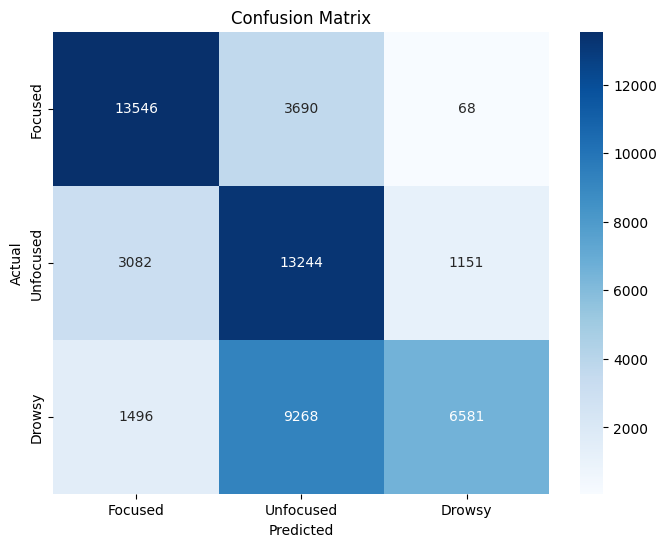

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_shape=(128,12)
num_classes = 3
epochs = 20
learning_rate = 1e-3
# Create class weights for the loss function to prevent model bias towards the class with more samples.
class_counts=count_classes(y)
class_weights = 1.0 / class_counts
class_weights = torch.tensor(class_weights / class_weights.min(), dtype=torch.float32).to(device)
# initialize dataloader
train_loader,test_loader,valid_loader=create_signal_loader(X=X_signal,y=y_signal,sampling=True)

model2=EEGNet(inp_shape=input_shape,classes=num_classes).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model2.parameters(), lr=learning_rate,weight_decay=1e-5)

train_metrics,valid_metrics=train(model2,train_loader=train_loader,valid_loader=valid_loader,criterion=criterion,optimizer=optimizer,epochs=epochs)

x_train shape: (37007, 12, 128)
37007 train samples
30840 test samples
9252 valid samples
              precision    recall  f1-score   support

           0       0.73      0.78      0.75      8205
           1       0.42      0.76      0.54      8251
           2       0.91      0.45      0.60     14384

    accuracy                           0.62     30840
   macro avg       0.68      0.66      0.63     30840
weighted avg       0.73      0.62      0.63     30840

AUC: 0.8421
F1 Score: 0.6321
Test Accuracy: 62.10%
Confusion Matrix:
[[6381 1758   66]
 [1384 6269  598]
 [1017 6866 6501]]


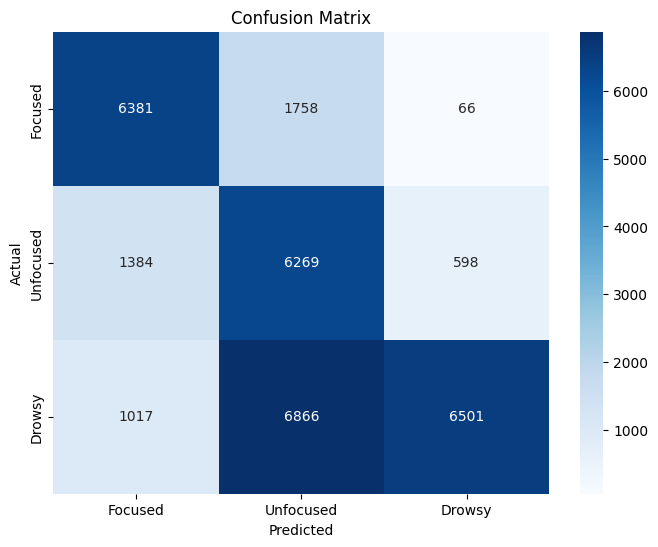

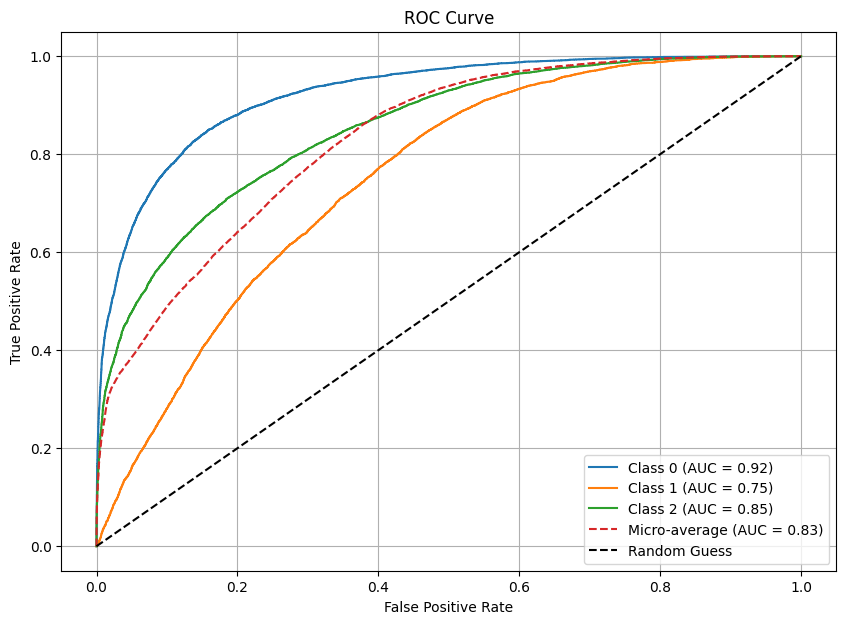

In [ ]:
# Predict on the dataset before sampling
_,test_loader,_=create_signal_loader(X=X_signal,y=y_signal,sampling=False)
plot_ROC_curves(model2,test_loader=test_loader)

**Observation**: After training on the balanced dataset and predicting back on the original dataset (without any sampling), we can see that:
- The model has performed better in classifying the "focused" and "unfocused" classes.
- The F1 score on the dataset has improved to 0.63.
- However, the model still misclassifies the "Drowsy" class as "Unfocused."
- The "Unfocused" class has been predicted more accurately as the model has focused more on this class compared to the initial model.

# 3. ExtractFeature,StackModel

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/no-cwt-dataset/X_1.csv
/kaggle/input/no-cwt-dataset/X_3.csv
/kaggle/input/no-cwt-dataset/X_2.csv
/kaggle/input/no-cwt-dataset/X_4.csv
/kaggle/input/no-cwt-dataset/X_5.csv
/kaggle/input/fft-features/Person_4.csv
/kaggle/input/fft-features/Person_2.csv
/kaggle/input/fft-features/Person_1.csv
/kaggle/input/fft-features/Person_3.csv
/kaggle/input/fft-features/Person_5.csv
/kaggle/input/eeg-data/subject_6.csv
/kaggle/input/eeg-data/subject_20.csv
/kaggle/input/eeg-data/subject_21.csv
/kaggle/input/eeg-data/subject_19.csv
/kaggle/input/eeg-data/subject_7.csv
/kaggle/input/eeg-data/subject_28.csv
/kaggle/input/eeg-data/subject_3.csv
/kaggle/input/eeg-data/subject_17.csv
/kaggle/input/eeg-data/subject_13.csv
/kaggle/input/eeg-data/subject_31.csv
/kaggle/input/eeg-data/subject_14.csv
/kaggle/input/eeg-data/subject_34.csv
/kaggle/input/eeg-data/subject_4.csv
/kaggle/input/eeg-data/subject_33.csv
/kaggle/input/eeg-data/subject_25.csv
/kaggle/input/eeg-data/subject_26.csv
/kaggle/inp

In [ ]:
import seaborn as sns
import pywt
import scipy
from joblib import Parallel, delayed
from scipy.stats import skew, kurtosis
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from numpy.fft import rfft, rfftfreq
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

## Using Fourier Transform to process data

### Necessary function

In [ ]:
def get_fft(snippet, sampling_rate=128.0):
    """
    Calculates FFT (Fast Fourier Transform) and returns frequency (frq) and spectrum amplitude (magnitude).

    Parameters:
    - snippet: Input signal (1D array).
    - sampling_rate: Sampling frequency (Hz), default is 128 Hz.

    Returns:
    - frq: Frequency array (Hz).
    - magnitude: Corresponding spectrum amplitude.
    """
    n = len(snippet)

    k = np.arange(n)
    T = n / sampling_rate
    frq = k / T
    frq = frq[:n // 2]

    Y = np.fft.fft(snippet) / n
    magnitude = np.abs(Y[:n // 2])

    magnitude[0] = 0

    return frq, magnitude

def waves_averages(f,Y):
    """
    Compute the sum of magnitudes for specific brainwave frequency bands.

    Parameters:
    - f (array-like): Frequencies corresponding to the input frequency-domain signal `Y`.
    - Y (array-like): The frequency-domain signal (e.g., FFT magnitudes).

    Returns:
    - gamma (float): Sum of magnitudes in the gamma wave range (32 - 100 Hz).
    - alpha (float): Sum of magnitudes in the alpha wave range (8 - 13 Hz).
    - beta (float): Sum of magnitudes in the beta wave range (16 - 31 Hz).
    - theta (float): Sum of magnitudes in the theta wave range (4 - 7 Hz).
    - delta (float): Sum of magnitudes in the delta wave range (0.2 - 3 Hz).
    """
    theta_range = (4,7)
    alpha_range = (8,13)
    beta_range = (16,31)
    gamma_range=(32,100)
    delta_range=(0.2,3)
    theta = np.abs(Y[(f>theta_range[0]) & (f<=theta_range[1])]).sum(axis=0)
    alpha = np.abs(Y[(f>alpha_range[0]) & (f<=alpha_range[1])]).sum(axis=0)
    beta = np.abs(Y[(f>beta_range[0]) & (f<=beta_range[1])]).sum(axis=0)
    gamma=np.abs(Y[(f>gamma_range[0]) & (f<=gamma_range[1])]).sum(axis=0)
    delta=np.abs(Y[(f>delta_range[0]) & (f<=delta_range[1])]).sum(axis=0)
    return gamma,alpha,beta,theta,delta

In [ ]:
def make_steps(samples,frame_duration,overlap):
    """
    Generate overlapping frame intervals for signal processing.

    Parameters:
    - samples (int): Total number of samples in the session.
    - frame_duration (int): Duration of each frame in seconds.
    - overlap (float): Fraction of overlap between consecutive frames,
      should be in the range (0, 1).
      Example: overlap=0.5 means 50% overlap.

    """
    Fs = 128
    i = 0
    intervals = []
    samples_per_frame = Fs * frame_duration
    while i+samples_per_frame <= samples:
        intervals.append((i,i+samples_per_frame))
        i = i + samples_per_frame - int(samples_per_frame*overlap)
    return intervals

def calculate_cwt(samples, scales=np.arange(1,9), wavelet='morl'):
    """
    Calculate the Continuous Wavelet Transform (CWT) for a given signal.
    Parameters:
    - samples (array-like): The 1D input signal for which the CWT is computed.
    - scales (array-like, optional): An array of scales to use for the wavelet transform.
      - Default is np.arange(1, 9), which corresponds to scales 1 through 8.
      - Smaller scales correspond to higher frequencies, and larger scales correspond to lower frequencies.
    - wavelet (str, optional): The type of wavelet to use for the transform.
      - Default is 'morl', which is the Morlet wavelet, commonly used in signal processing.

    Returns:
    - coeffs_abs (2D array): The absolute values of the wavelet coefficients.
      - Shape: (len(scales), len(samples)).
      - Each row corresponds to a scale, and each column corresponds to a time point in the signal.
    """
    coeffs, freqs = pywt.cwt(samples, scales, wavelet)
    coeffs_abs = np.abs(coeffs)
    return coeffs_abs

def make_frames(df, frame_duration, overlap,Fs = 128.0):
    '''
    Parameters:
    -  dataframe or array with all channels
    -  frame duration in seconds
    '''
    frame_length = int(Fs * frame_duration)
    frames = []
    steps = make_steps(len(df), frame_duration, overlap)
    frq = None

    for step_idx, step in enumerate(steps):
        frame = []
        for channel_idx, channel in enumerate(df.columns):
            snippet = np.array(df.loc[step[0]:step[1]-1, channel])
            f, Y = get_fft(snippet)
            if frq is not None:
                frq = np.concatenate((frq, f), axis=0)
            else:
                frq = f

            #Split into signal bands
            alpha, beta, gamma, theta, delta = waves_averages(f, Y)
            frame.extend([alpha, beta, theta, delta])

            # Statistic features
            mean = np.mean(snippet)
            variance = np.var(snippet)
            std = np.std(snippet)
            energy = np.sum(snippet**2)
            skewness = skew(snippet)
            excess_kurtosis = kurtosis(snippet)
            frame.extend([mean,variance, std, energy, skewness, excess_kurtosis])

            #Spectral features
            psd = Y**2
            psd_mean=np.mean(psd)
            psd_norm = psd/np.sum(psd)
            entropy = -np.sum(psd_norm * np.log2(psd_norm + 1e-10))
            frame.extend([psd_mean, entropy])

            #Time-Frequency features
            cwtmatr = calculate_cwt(snippet)
            cwt_means = cwtmatr.mean(axis=1)
            frame.extend(cwt_means)

        frames.append(frame)

    feature_columns = []
    for channel in df.columns:
        feature_columns.extend([
            f'{channel}_alpha', f'{channel}_beta', f'{channel}_theta',
            f'{channel}_delta', f'{channel}_mean', f'{channel}_variance',
            f'{channel}_std', f'{channel}_energy', f'{channel}_skewness',
            f'{channel}_kurtosis', f'{channel}_psd', f'{channel}_entropy'
        ])
        for i in range(1, 9):
            feature_columns.append(f'{channel}_cwt_scale_{i}')
    feature_df = pd.DataFrame(frames, columns=feature_columns)
    return feature_df, frq

In [ ]:
def plot_fft(df, start_time, frame_duration=None, Fs=128):
    """
    Plots frequency vs EEG power (for FFT) or frequency vs PSD (for Welch) for given EEG channels.

    Parameters:
    eeg_data (pandas.DataFrame): EEG data DataFrame
    channels (list): List of channel names to analyze
    start_time (float): Start time of the analysis in seconds
    duration (float, optional): Duration of the analysis in seconds. If None, analyzes until the end of the data.
    sampling_rate (int): Sampling rate of the EEG data in Hz (default is 128 Hz)
    method (str): Method for analysis ('fft' for Power or 'welch' for PSD)
    """
    first_index = int(start_time * Fs)
    if frame_duration is None:
        last_index = len(df)
    else:
        last_index = int((start_time + frame_duration) * Fs)

    n_channels = len(df.columns)
    n_rows = (n_channels + 1) // 2

    fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5 * n_rows))

    if n_rows == 1:
        axes = axes.reshape(1, -1)

    for channel_idx, channel in enumerate(df.columns):
        row = channel_idx // 2
        col = channel_idx % 2
        ax = axes[row, col]

        channel_data = df[channel].values[first_index:last_index]


        n = len(channel_data)
        snippet = np.array(df.loc[first_index:last_index, channel])
        f, Y = get_fft(snippet)

        power = np.abs(Y) ** 2

        ax.plot(f, power, label='Power')
        ax.set_title(f'{channel} - FFT for EEG signals')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power')

        ax.grid(True)

    for i in range(len(df.columns), n_rows * 2):
        row = i // 2
        col = i % 2
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    plt.show()


def plot_single_channel_bands(df, channel, time_points, frame_duration=10, Fs=128):
    """
    Plots frequency vs EEG power (for FFT) for a single EEG channel at specified time points in a single row.

    Parameters:
    df (pandas.DataFrame): EEG data DataFrame
    channel (str): The channel name to analyze
    time_points (list): List of time points (in seconds) for plotting
    frame_duration (float): Duration of each analysis window in seconds (default is 10s)
    Fs (int): Sampling rate of the EEG data in Hz (default is 128 Hz)
    """
    bands = {
        'Delta': (0.5, 4),
        'Theta': (4, 8),
        'Alpha': (8, 13),
        'Beta': (13, 30),
        'Gamma': (30, 50)
    }
    colors = ["blue", "green", "orange", "red", "purple"]

    n_time_points = len(time_points)

    fig, axes = plt.subplots(1, n_time_points, figsize=(5 * n_time_points, 5), sharey=True)

    if n_time_points == 1:
        axes = [axes]

    for i, (ax, start_time) in enumerate(zip(axes, time_points)):
        first_index = int(start_time * Fs)
        last_index = int((start_time + frame_duration) * Fs)

        snippet = df[channel].iloc[first_index:last_index].values

        f, Y = get_fft(snippet, sampling_rate=Fs)
        power = np.abs(Y) ** 2  # Power spectrum

        ax.plot(f, power, label='Power Spectrum')
        if (start_time<=600):
            ax.set_title(f'{channel} at Focus State')
        elif (600<start_time<=1200):
            ax.set_title(f'{channel} at Unfocus State')
        else:
            ax.set_title(f'{channel} at Drowsy State')
        ax.set_xlabel('Frequency (Hz)')
        if i == 0:
            ax.set_ylabel('Power')
        ax.grid(True)

        for j, (band, (low, high)) in enumerate(bands.items()):
            ax.axvspan(low, high, color=colors[j], alpha=0.3, label=f"{band}")

        if i == len(time_points) - 1:
            ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()


In [ ]:
def plot_bands(df, start_time, frame_duration=None, Fs=128):
    """
    Plots frequency vs EEG power (for FFT) for given EEG channels.

    Parameters:
    df (pandas.DataFrame): EEG data DataFrame
    start_time (float): Start time of the analysis in seconds
    frame_duration (float, optional): Duration of the analysis in seconds. If None, analyzes until the end of the data.
    Fs (int): Sampling rate of the EEG data in Hz (default is 128 Hz)
    """
    first_index = int(start_time * Fs)
    if frame_duration is None:
        last_index = len(df)
    else:
        last_index = int((start_time + frame_duration) * Fs)

    n_channels = len(df.columns)
    n_rows = (n_channels + 1) // 2
    fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5 * n_rows))

    if n_rows == 1:
        axes = axes.reshape(1, -1)

    bands = {
        'Delta': (0.5, 4),
        'Theta': (4, 8),
        'Alpha': (8, 13),
        'Beta': (13, 30),
        'Gamma': (30, 50)
    }
    colors = ["blue", "green", "orange", "red", "purple"]

    for channel_idx, channel in enumerate(df.columns):
        row = channel_idx // 2
        col = channel_idx % 2
        ax = axes[row, col]

        snippet = df[channel].iloc[first_index:last_index].values

        f, Y = get_fft(snippet, sampling_rate=Fs)
        power = np.abs(Y) ** 2

        ax.plot(f, power, label='Power Spectrum')
        ax.set_title(f'{channel} - Frequency vs Power (FFT)')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power')
        ax.grid(True)

        for i, (band, (low, high)) in enumerate(bands.items()):
            ax.axvspan(low, high, color=colors[i], alpha=0.3, label=f"{band}")

        ax.legend(loc='upper right')

    for i in range(len(df.columns), n_rows * 2):
        row = i // 2
        col = i % 2
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    plt.show()

In [ ]:
def normalize_positions(positions):
    """
    Normalize the positions of EEG channels to fit within a unit circle.

    Parameters:
    positions (dict): A dictionary of channel positions with channel names as keys
                      and (x, y) coordinates as values.

    """
    max_radius = max(np.sqrt(x**2 + y**2) for x, y in positions.values())
    return {key: (x / max_radius, y / max_radius) for key, (x, y) in positions.items()}

def plot_eeg_channels(channel_locations):
    """
    Plots the normalized positions of EEG channels on a 2D head map.

    Parameters:
    channel_locations (dict): A dictionary with channel names as keys and (x, y) positions as values.
    """
    normalized_locations = normalize_positions(channel_locations)

    fig, ax = plt.subplots(figsize=(6, 6))

    head_circle = plt.Circle((0, 0), 1, color='black', fill=False, lw=2)
    ax.add_artist(head_circle)

    for channel, (x, y) in normalized_locations.items():
        ax.plot(x, y, 'o', color='blue')
        ax.text(x, y + 0.1, channel, fontsize=10, ha='center', color='green')  # Label channel

    ax.set_xlim([-1.2, 1.2])
    ax.set_ylim([-1.2, 1.2])
    ax.set_aspect('equal', adjustable='datalim')
    ax.axis('off')
    plt.title("EEG Channel Positions")
    plt.show()



In [ ]:
def plot_label_distribution(subject_y):
    """
    Plots the label distribution as a bar chart.

    Parameters:
    subject_y (pandas.Series): The column containing the labels (e.g., 'state').
    """
    label_counts = subject_y.value_counts()

    plt.figure(figsize=(10, 6))
    label_counts.plot(kind='bar', color='skyblue', edgecolor='black')

    plt.title('Label Distribution', fontsize=16)
    plt.xlabel('Labels', fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=0, fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_confusion_matrix(cm, labels):
    """
    Plot a confusion matrix as a heatmap for easy visualization and interpretation.

    Parameters:
    - cm (2D array or DataFrame): The confusion matrix to be visualized,
      typically generated using sklearn's confusion_matrix function.
    - labels (list): A list of class labels corresponding to the rows and columns
      of the confusion matrix. Used as tick labels on the axes.
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
def plot_multiclass_roc(y_true, y_scores, n_classes):
    """
    Computes and plots ROC curves and AUC scores for multi-class classification.

    Parameters:
    - y_true: array-like, shape (n_samples,)
        True labels of the test set (not one-hot encoded).
    - y_scores: array-like, shape (n_samples, n_classes)
        Predicted probabilities for each class.
    - n_classes: int
        The number of classes in the dataset.

    """
    y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

    # Initialize dictionaries to store FPR, TPR, and AUC for each class
    fpr = {}
    tpr = {}
    roc_auc = {}

    # Compute ROC curve and AUC for each class
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_scores.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot the ROC curves
    plt.figure(figsize=(8, 5))
    colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink']  # Extendable for more classes
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], color=colors[i % len(colors)], lw=2,
                 label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle=':', linewidth=2,
             label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', lw=1.5, label='Random Guessing')

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class Classification')
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.show()

### Data Loaded and EDA

In [ ]:
df=pd.read_csv('/kaggle/input/eeg-data/subject_27.csv')
features=df.drop(columns=['state','AF3','AF4'])

The electrode locations for different brain wave channels are illustrated in the image below:

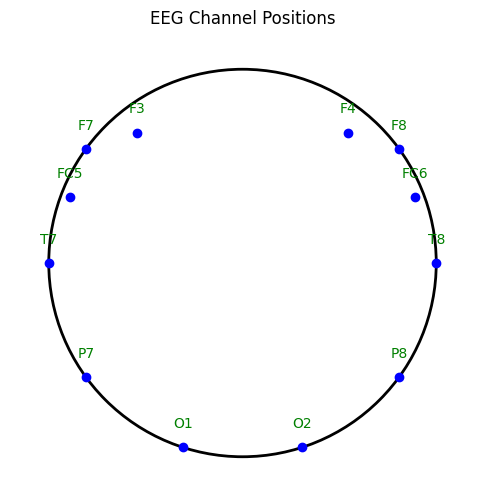

In [ ]:
channel_locations = {
    'F7': [-0.0768098, 0.05580558],
    'F3': [-0.05177571, 0.06393767],
    'FC5': [-0.08434934, 0.03237868],
    'T7': [-0.09494213, 0.0],
    'P7': [-0.0768098, -0.05580558],
    'O1': [-0.02933873, -0.09029533],
    'O2': [0.02933873, -0.09029533],
    'P8': [0.0768098, -0.05580558],
    'T8': [0.09494213, 0.0],
    'FC6': [0.08434934, 0.03237868],
    'F4': [0.05177571, 0.06393767],
    'F8': [0.0768098, 0.05580558]
}

plot_eeg_channels(channel_locations)


The graphs below illustrate the distribution of brain waves across frequency bands for each channel. The graph is at 300 seconds (5 minutes). It can be seen that in most channels, the waves belong to the beta and gamma frequency bands. This is true for the state of concentration. However, there are some channels that show more noise because they are more susceptible to external influences (O1, O2, P7, P8).

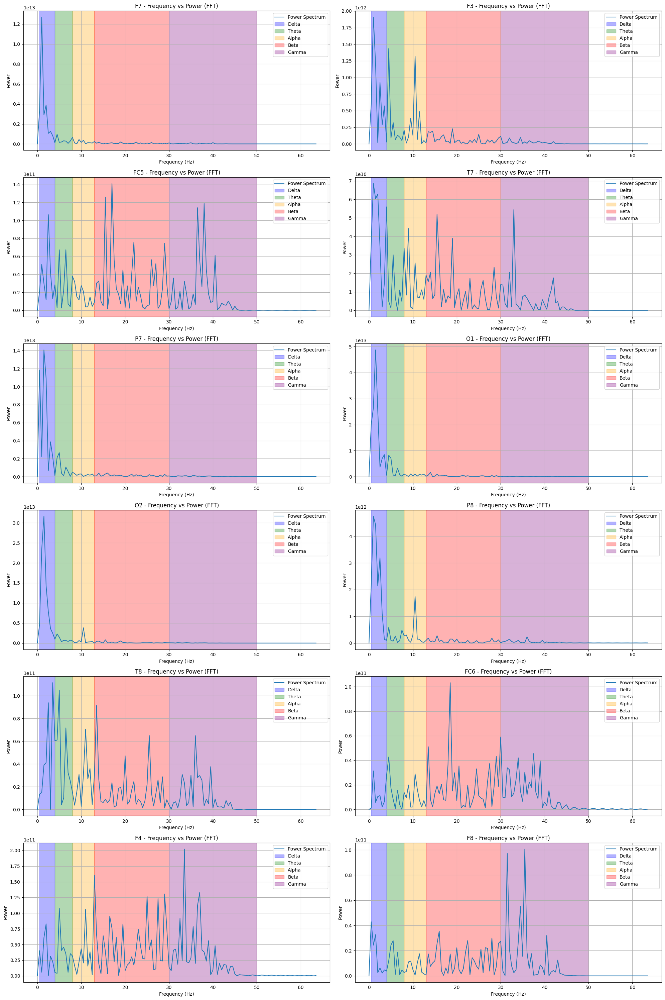

In [ ]:
plot_bands(features,300,2)

We analyze the waves in the FC5 channel in 3 states: Focus, Unfocus and Drowsy. It can be seen that in the focus state, the waves are concentrated in the beta and gamma bands, in the unfocus state, the waves are concentrated in the alpha band and in the drowsy state, the waves are concentrated in the delta band.

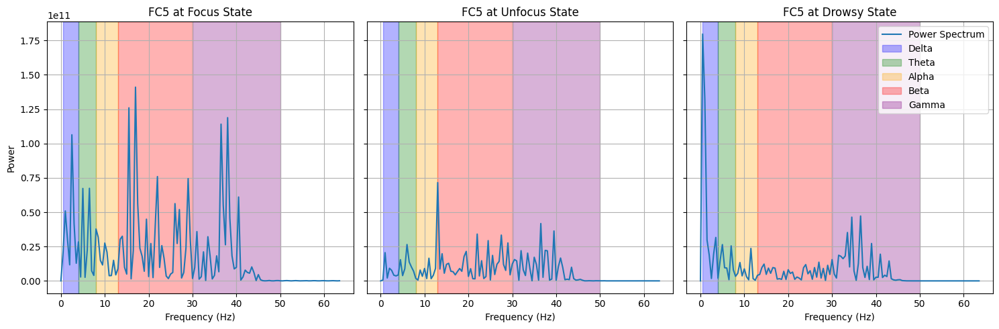

In [ ]:
time_points = [300, 900, 1800]

plot_single_channel_bands(features, "FC5", time_points, frame_duration=2)

From this factor, we can choose the wave frequency band as a characteristic to distinguish the 3 states from each other. In addition, we can add statistical features of the waves to enrich the data set.

### Classification by using fft and adding features

#### Loaded Data

In [ ]:
p1=pd.read_csv('/kaggle/input/no-cwt-dataset/X_1.csv')
p2=pd.read_csv('/kaggle/input/no-cwt-dataset/X_2.csv')
p3=pd.read_csv('/kaggle/input/no-cwt-dataset/X_3.csv')
p4=pd.read_csv('/kaggle/input/no-cwt-dataset/X_4.csv')
p5=pd.read_csv('/kaggle/input/no-cwt-dataset/X_5.csv')

dataset=pd.concat([p1,p2,p3,p4,p5], ignore_index=True)
dataset.drop(columns=['Unnamed: 0'],inplace=True)

#### Transforming EEG data set by using FFT and adding features

In [ ]:
# all_data=[]
# for i in range (31,35):
#         df=pd.read_csv(f'/kaggle/input/eeg-data/subject_{i}.csv')
#         print(f'subject_{i}')
#         df=df.drop(columns=['AF3','AF4'])
#         state_encode = {
#                 1: 0,
#                 2: 1,
#                 0: 2
#             }
#         df['state']=df['state'].map(state_encode)

#         df_focused = df[df['state'] == 0]
#         df_unfocused = df[df['state'] == 1].reset_index(drop=True)
#         df_drowsy = df[df['state'] == 2].reset_index(drop=True)

#         focused,focused_frq=make_frames(df_focused.drop(columns=['state']),1,0.3)
#         unfocused, unfocused_frq=make_frames(df_unfocused.drop(columns=['state']),1,0.3)
#         drowsy, drowsy_frq=make_frames(df_drowsy.drop(columns=['state']),1,0.3)

#         focused["state"] = 0
#         unfocused["state"] = 1
#         drowsy["state"] = 2
#         print('Length focused:',len(focused))
#         print('Length unfocused: ',len(unfocused))
#         print('Length drowsy: ',len(drowsy))
#         df_fft = pd.concat([focused, unfocused, drowsy])
#         all_data.append(df_fft)
# # Concatenate all DataFrames into one big DataFrame
# big_dataset = pd.concat(all_data, ignore_index=True)

# # Display or save the big dataset
# print('Length full dataset: ',len(big_dataset))
# big_dataset.to_csv('X_5.csv')

#### Features Engineering

In [ ]:
subject_X=dataset.drop(columns=['state'])
subject_y=dataset['state']

Through the data table and graph below, we can see that the data set is unbalanced due to

In [ ]:
num_y = subject_y.value_counts()
data = {
    'State': ['0', '1', '2'],
    'Count': [num_y[0], num_y[1], num_y[2]]
}

distribution = pd.DataFrame(data)

distribution['Percentage (%)'] = (distribution['Count'] / distribution['Count'].sum()) * 100

distribution


,State,Count,Percentage (%)
0,0,20448,26.549638
1,1,20387,26.470435
2,2,36183,46.979927


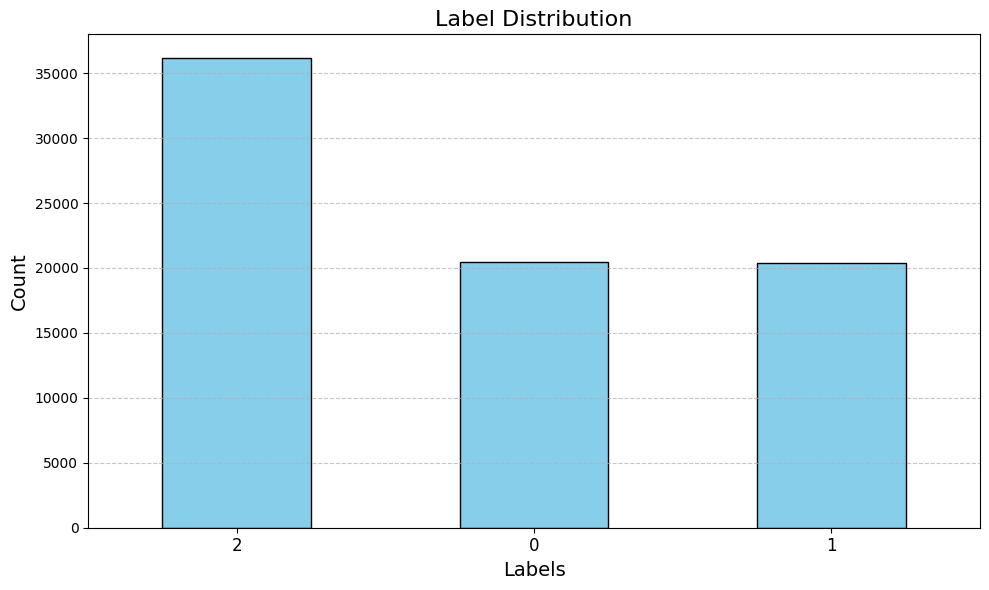

In [ ]:
plot_label_distribution(dataset['state'])

In [ ]:
print("Original class distribution:", Counter(subject_y))

rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(subject_X, subject_y)

print("Resampled class distribution:", Counter(y_resampled))

Original class distribution: Counter({2: 36183, 0: 20448, 1: 20387})
Resampled class distribution: Counter({0: 20387, 1: 20387, 2: 20387})


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_X=scaler.fit_transform(X_resampled)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y_resampled, test_size=0.3, random_state=42)

Decision Tree
              precision    recall  f1-score   support

           0       0.71      0.69      0.70      6101
           1       0.61      0.63      0.62      6096
           2       0.72      0.71      0.71      6152

    accuracy                           0.68     18349
   macro avg       0.68      0.68      0.68     18349
weighted avg       0.68      0.68      0.68     18349

Micro-average AUC: 0.7578


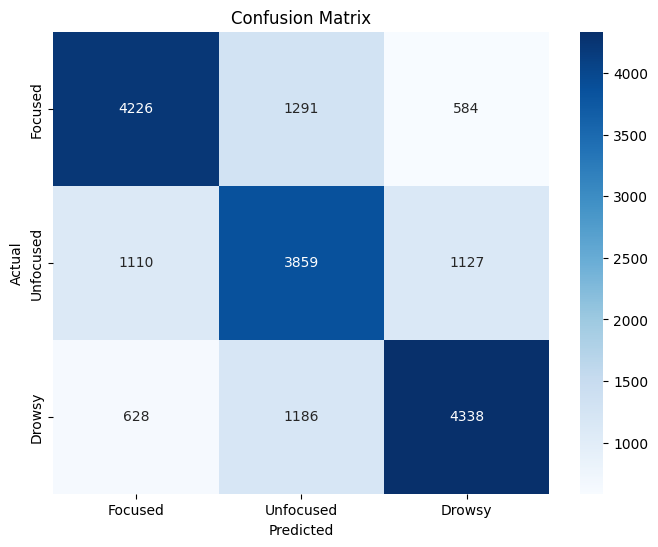

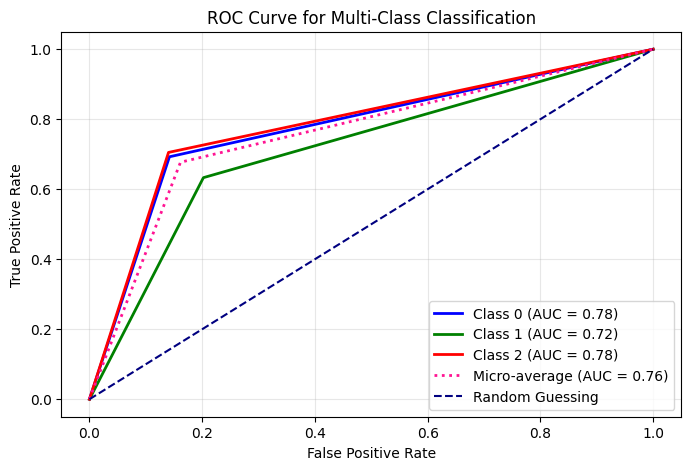

In [ ]:
dt_model = DecisionTreeClassifier(random_state=0)
dt_model.fit(X_train, y_train)

dt_preds = dt_model.predict(X_test)

print("Decision Tree")
print(classification_report(y_test, dt_preds))

y_score =dt_model.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, dt_preds)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])


plot_multiclass_roc(y_test, y_score, n_classes=3)

K-Nearest Neighbour:
              precision    recall  f1-score   support

           0       0.77      0.80      0.78      6101
           1       0.68      0.73      0.70      6096
           2       0.82      0.74      0.78      6152

    accuracy                           0.75     18349
   macro avg       0.76      0.75      0.76     18349
weighted avg       0.76      0.75      0.76     18349

Micro-average AUC: 0.9047


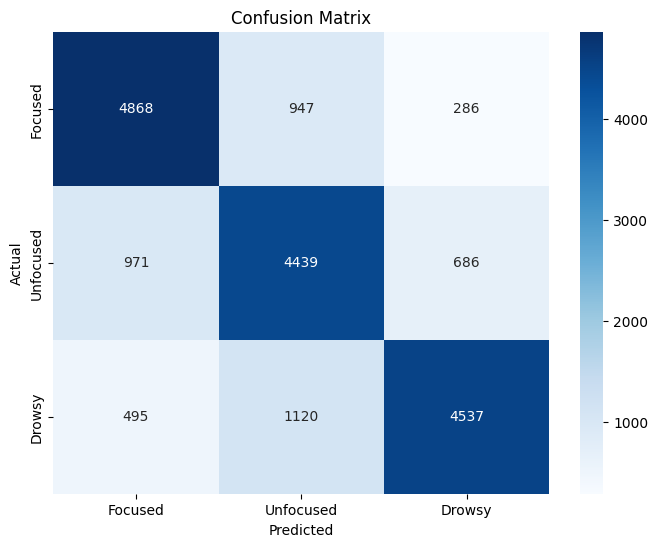

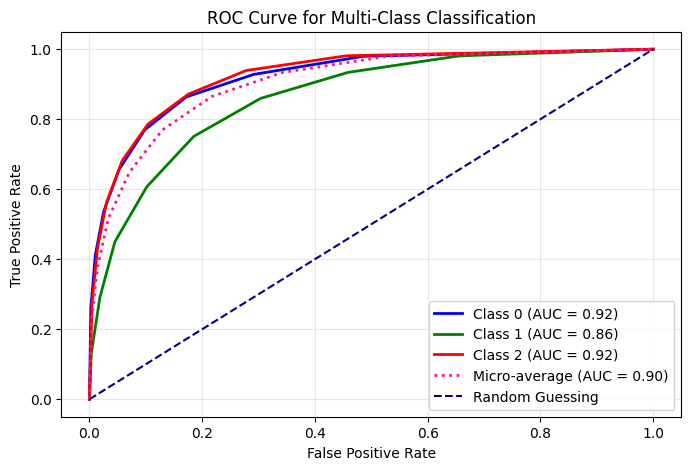

In [ ]:
# Using K-Nearest Neighbors to classification
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(
    n_neighbors=8,
    weights='uniform',
    algorithm='auto'
)
knn.fit(X_train, y_train)
knn_pred=knn.predict(X_test)

print("K-Nearest Neighbour:")
print(classification_report(y_test,knn_pred))

y_score =knn.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, knn_pred)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])

plot_multiclass_roc(y_test, y_score, n_classes=3)

As can be seen from the models above, the classification is not really good, the labels are still confused with each other, making the performance of the model only average. To solve this problem, we will add features to increase the strength of the data set. Specifically in this report, we will use Continuous Wavelet Transform (CWT) to create new features.

## Continuous Wavelet Transform

Continuous Wavelet Transform is an analysis tool that takes a time-domain signal and returns the signal’s components in the frequency domain. However, in contrast to the Fourier Transform, the Continuous Wavelet Transform returns a two-dimensional result, providing information in the frequency- as well as in time-domain

### Necessary Function

In [ ]:
def plot_cwt_per_channel(df, scales, wavelet='morl', Fs=128, time_window=None):
    """
    Plots the Continuous Wavelet Transform (CWT) for each EEG channel.

    Parameters:
    df (pandas.DataFrame): The EEG data (with channels as columns)
    scales (np.array): Array of scales for the CWT
    wavelet (str): The wavelet function name
    Fs (int): Sampling rate (default is 128 Hz)
    time_window (tuple, optional): The start and end time for the window (in seconds).
                                    If None, it plots the entire signal.
    """
    time = np.linspace(0, len(df) / Fs, len(df))

    n_channels = len(df.columns)
    n_rows = (n_channels + 1) // 2
    fig, axs = plt.subplots(n_rows, 2, figsize=(12, 6 * n_rows))

    if n_rows == 1:
        axs = axs.reshape(1, -1)

    for channel_idx, channel in enumerate(df.columns):
        row = channel_idx // 2
        col = channel_idx % 2
        ax = axs[row, col]

        signal = df[channel].values

        # Calculate signal's components
        cwtmatr, freqs = pywt.cwt(signal, scales, wavelet, 1 / Fs)
        cwtmatr = np.abs(cwtmatr)

        pcm = ax.pcolormesh(time, freqs, cwtmatr, shading='auto')
        ax.set_yscale("log")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Frequency (Hz)")
        ax.set_title(f"CWT of {channel}")

        fig.colorbar(pcm, ax=ax)

    for i in range(len(df.columns), n_rows * 2):
        row = i // 2
        col = i % 2
        fig.delaxes(axs[row, col])

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_cwt_and_fft(signal, wavelet="morl", scales=np.arange(1, 9), Fs=128):
    """
    Perform Continuous Wavelet Transform (CWT) and Fourier Transform (FFT)
    on a signal and plot the results.

    Parameters:
    signal (array-like): Input signal for analysis.
    wavelet (str): The wavelet type for CWT (default is "morl").
    scales (array-like): Array of scales for the CWT (default is np.arange(1, 9)).
    Fs (int): Sampling frequency of the signal (default is 128 Hz).
    """
    time = np.linspace(0, len(signal) / Fs, len(signal))
    sampling_period = 1 / Fs

    cwtmatr, freqs = pywt.cwt(signal, scales, wavelet, sampling_period)
    cwtmatr = np.abs(cwtmatr)

    fig, axs = plt.subplots(2, 1, figsize=(8, 6))

    pcm = axs[0].pcolormesh(time, freqs, cwtmatr, shading="auto")
    axs[0].set_yscale("log")
    axs[0].set_xlabel("Time (s)")
    axs[0].set_ylabel("Frequency (Hz)")
    axs[0].set_title("Continuous Wavelet Transform (Scaleogram) on")
    fig.colorbar(pcm, ax=axs[0])

    yf = rfft(signal)
    xf = rfftfreq(len(signal), d=sampling_period)
    axs[1].semilogx(xf, np.abs(yf))
    axs[1].set_xlabel("Frequency (Hz)")
    axs[1].set_title("Fourier Transform")

    plt.tight_layout()
    plt.show()

In [ ]:
def downsample_to_min_class(X, y, random_seed=42):
    """
    Downsamples the data of all classes to match the size of the smallest class.

    Parameters:
    X (numpy.ndarray): The feature data (samples x features).
    y (numpy.ndarray): The labels corresponding to the feature data.
    random_seed (int): Seed for reproducibility of random sampling.
    """
    np.random.seed(random_seed)

    unique_classes = np.unique(y)
    class_indices = {label: np.where(y == label)[0] for label in unique_classes}

    min_class_size = min(len(indices) for indices in class_indices.values())

    downsampled_indices = []
    for label, indices in class_indices.items():
        if len(indices) > min_class_size:
            selected_indices = np.random.choice(indices, size=min_class_size, replace=False)
        else:
            selected_indices = indices
        downsampled_indices.extend(selected_indices)

    downsampled_indices = np.array(downsampled_indices)
    downsampled_X = X[downsampled_indices]
    downsampled_y = y[downsampled_indices]

    shuffle_indices = np.random.permutation(len(downsampled_y))
    downsampled_X = downsampled_X[shuffle_indices]
    downsampled_y = downsampled_y[shuffle_indices]

    return downsampled_X, downsampled_y

### Data loaded and EDA

In [ ]:
df = pd.read_csv('/kaggle/input/eeg-data/subject_12.csv')
features = df.drop(columns=['state','AF3', 'AF4'])

Continuous Wavelet is displayed by scaleogram, the graphs below show scaleogram of each channel when tranform into Continuous Wavelet. The intensity of the wave is shown in the intensity of the light and dark. The lighter the position represent greater intensity.

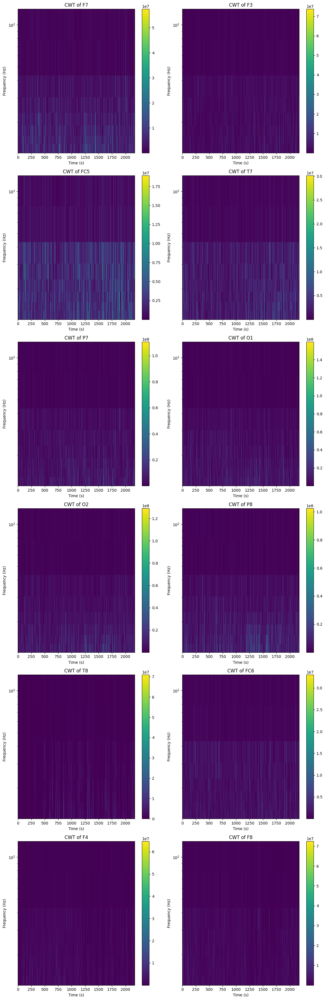

In [ ]:
scales = np.arange(1, 9)
plot_cwt_per_channel(features, scales)

The graph below shows the difference between CWT and Fourier Transform. While Fourier Transform change signal into Frequency domain, CWT change signal into Time-Frequency domain.

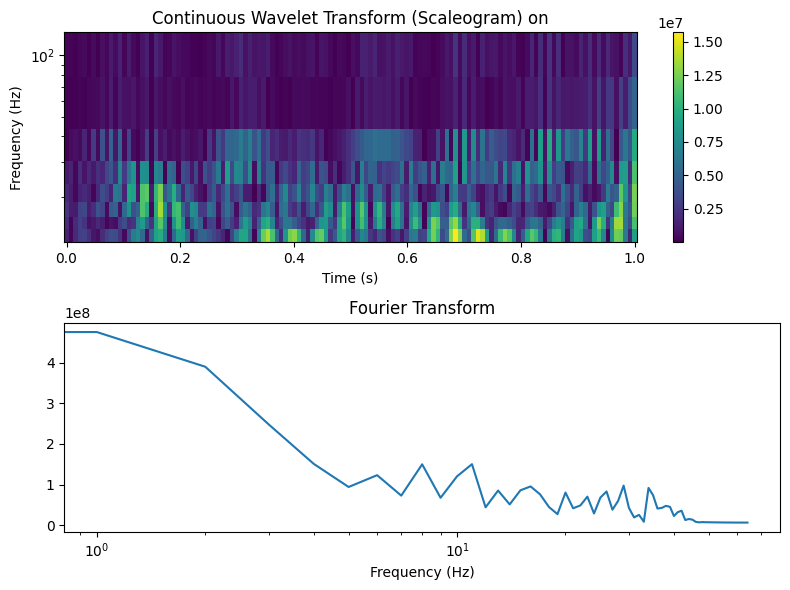

In [ ]:
signal = features.iloc[:128, 0]
plot_cwt_and_fft(signal)

### Classification by using CWT

Before making features and combined with FFT, we will use the CWT features to classify to evaluate this method. In this project, we use Morlet Wave as the Wave to transform and calculate component.

#### Transforming eeg dataset into cwt dataset

In [ ]:
# def make_epochs(X,num_rows, window_size=128, bridge=90):
#     """
#     Splits the input signal into overlapping or non-overlapping epochs.
#     """
#     epochs = []
#     for start in range(0, num_rows, bridge):
#         end = start + window_size
#         if end > num_rows:
#             end = num_rows
#         epochs.append(X[start:end])

#     print(f"Number of epochs: {len(epochs)}")
#     return epochs

# def process_epoch(epoch):
#      """
#     Processes a single epoch using the Continuous Wavelet Transform (CWT).
#     """
#     coeffs, freqs = pywt.cwt(epoch, scales, 'morl')
#     coeffs_abs = np.abs(coeffs)
#     coeffs_reduced = np.mean(coeffs_abs, axis=1, keepdims=True)
#     return coeffs_reduced

# def make_features(epochs):
#     """
#     Processes multiple epochs in parallel to extract features.
#     """
#     rows = Parallel(n_jobs=-1)(delayed(process_epoch)(epoch) for epoch in epochs)
#     return rows

In [ ]:
# # Initialize empty lists to store concatenated data
# all_X = []
# all_y = []

# # Test case with a small range
# for i in range(3,8):  # Adjust this range as needed
#         df = pd.read_csv(f'/kaggle/input/eeg-data/subject_{i}.csv')
#         X = df.drop(columns=['state','AF3','AF4'])

#         X_focused = X[0:76800]
#         X_unfocused = X[76800:153600]
#         X_drowsy = X[153600:]
#         print(f'subject_{i}')
#         focused = make_epochs(X_focused, X_focused.shape[0])
#         unfocused = make_epochs(X_unfocused, X_unfocused.shape[0])
#         drowsy = make_epochs(X_drowsy, X_drowsy.shape[0])

#         print(focused[0].shape)
#         # Process all epochs
#         focused_features = make_features(focused)
#         unfocused_features = make_features(unfocused)
#         drowsy_features = make_features(drowsy)

#         # Reshape the features with your existing logic
#         for j in range(len(focused)-1, 0, -1):
#             if focused_features[j].shape == (8, 1, 12):
#                 X_focused = np.stack(focused_features[:(j+1)])
#                 break

#         for j in range(len(unfocused)-1, 0, -1):
#             if unfocused_features[j].shape == (8, 1, 12):
#                 X_unfocused = np.stack(unfocused_features[:(j+1)])
#                 break

#         for j in range(len(drowsy)-1, 0, -1):
#             if drowsy_features[j].shape == (8, 1, 12):
#                 X_drowsy = np.stack(drowsy_features[:(j+1)])
#                 break

#         # Create corresponding labels
#         y_focused = np.zeros(len(X_focused))  # Label 0 for focused
#         y_unfocused = np.ones(len(X_unfocused))  # Label 1 for unfocused
#         y_drowsy = np.ones(len(X_drowsy)) * 2  # Label 2 for drowsy

#         # Combine features and labels for this subject
#         subject_X = np.concatenate([X_focused, X_unfocused, X_drowsy])
#         subject_y = np.concatenate([y_focused, y_unfocused, y_drowsy])

#         # Append to the overall lists
#         all_X.append(subject_X)
#         all_y.append(subject_y)

# # Concatenate data from all subjects
# final_X = np.concatenate(all_X)
# final_y = np.concatenate(all_y)

# # Verify shapes
# print("Final X shape:", final_X.shape)
# print("Final y shape:", final_y.shape)

# # Save to numpy files
# np.save('final_X_1.npy', final_X)
# np.save('final_y_1.npy', final_y)

# # Optional: Test loading the files
# loaded_X = np.load('final_X_1.npy')
# loaded_y = np.load('final_y_1.npy')

# print("Loaded X shape:", loaded_X.shape)
# print("Loaded y shape:", loaded_y.shape)

#### Data Loaded and Model Development

In [ ]:
X1=np.load('/kaggle/input/eeg-cwt-features/final_X_1.npy')
X2=np.load('/kaggle/input/eeg-cwt-features/final_X_2.npy')
X3=np.load('/kaggle/input/eeg-cwt-features/final_X_3.npy')
X4=np.load('/kaggle/input/eeg-cwt-features/final_X_4.npy')
X5=np.load('/kaggle/input/eeg-cwt-features/final_X_5.npy')

y1=np.load('/kaggle/input/eeg-cwt-features/final_y_1.npy')
y2=np.load('/kaggle/input/eeg-cwt-features/final_y_2.npy')
y3=np.load('/kaggle/input/eeg-cwt-features/final_y_3.npy')
y4=np.load('/kaggle/input/eeg-cwt-features/final_y_4.npy')
y5=np.load('/kaggle/input/eeg-cwt-features/final_y_5.npy')

In [ ]:
loaded_X=np.concatenate([X1,X2,X3,X4,X5])
loaded_y=np.concatenate([y1,y2,y3,y4,y5])

In [ ]:
# Process imbalance data by using down sampling
selected_X, selected_y = downsample_to_min_class(loaded_X, loaded_y)
print("Downsampled X shape:", selected_X.shape)
print("Downsampled y shape:", selected_y.shape)


unique, counts = np.unique(selected_y, return_counts=True)
print("Class distribution after downsampling:")
for class_label, count in zip(unique, counts):
    print(f"Label {class_label}: {count} samples")

Downsampled X shape: (61302, 8, 1, 12)
Downsampled y shape: (61302,)
Class distribution after downsampling:
Label 0.0: 20434 samples
Label 1.0: 20434 samples
Label 2.0: 20434 samples


In [ ]:
# Reshape data
X_reshaped = selected_X.reshape(selected_X.shape[0], -1)

In [ ]:
# Scale data before training
scaler=StandardScaler()
X_scaled = scaler.fit_transform(X_reshaped)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, selected_y, test_size=0.2, random_state=42)


Random Forest:
              precision    recall  f1-score   support

         0.0       0.63      0.71      0.67      4125
         1.0       0.60      0.55      0.58      4164
         2.0       0.69      0.65      0.67      3972

    accuracy                           0.64     12261
   macro avg       0.64      0.64      0.64     12261
weighted avg       0.64      0.64      0.64     12261

Micro-average AUC: 0.8208


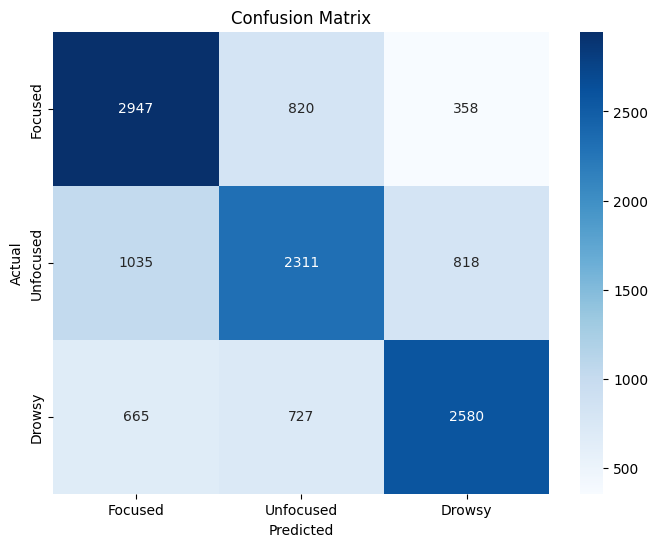

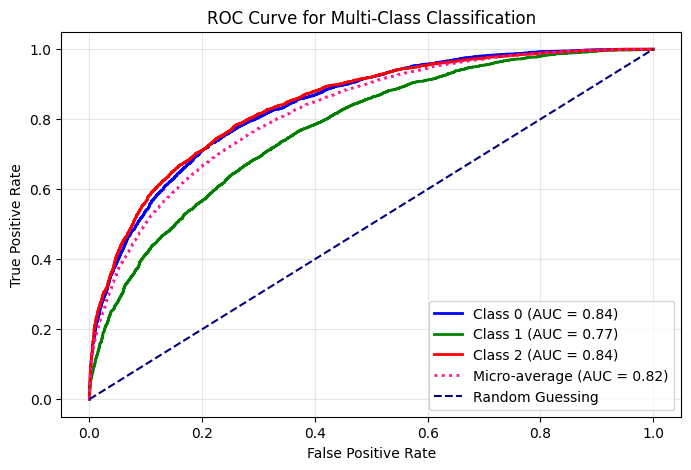

In [ ]:
# Using Random Forest to classification
rf =  RandomForestClassifier(
    max_depth=10,
    n_estimators=200,
    random_state=42
)
rf.fit(X_train, y_train)
rf_pred=rf.predict(X_test)

print("Random Forest:")
print(classification_report(y_test,rf_pred))

y_score =rf.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, rf_pred)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])

plot_multiclass_roc(y_test, y_score, n_classes=3)

K-Nearest Neighbour:
              precision    recall  f1-score   support

         0.0       0.67      0.72      0.69      4125
         1.0       0.61      0.60      0.61      4164
         2.0       0.71      0.67      0.69      3972

    accuracy                           0.66     12261
   macro avg       0.66      0.66      0.66     12261
weighted avg       0.66      0.66      0.66     12261

Micro-average AUC: 0.8395


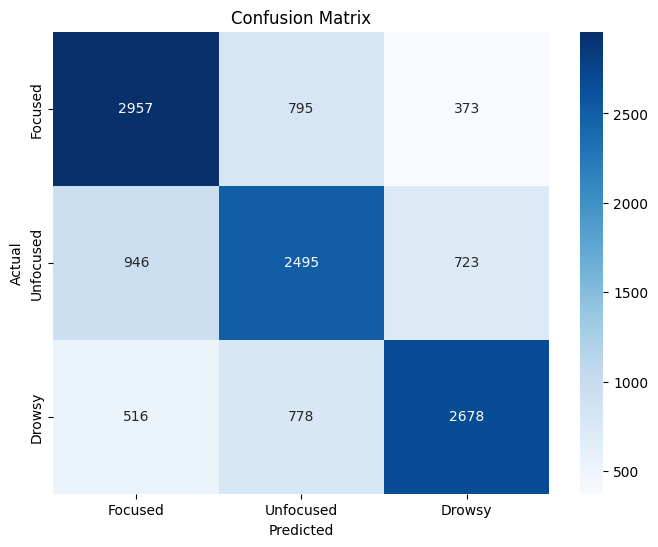

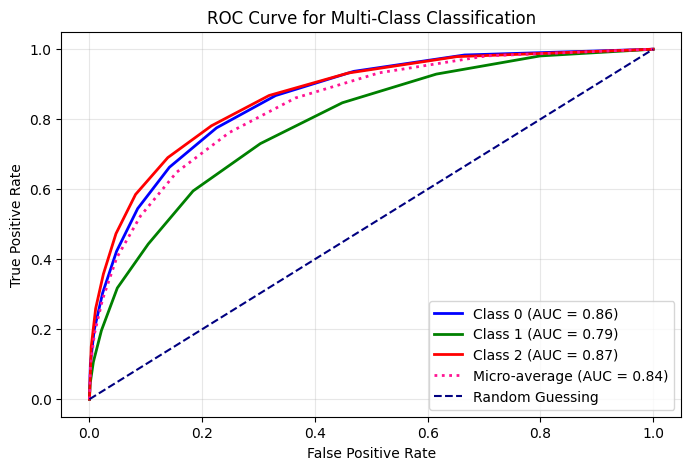

In [ ]:
# Using K-Nearest Neighbors to classification
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(
    n_neighbors=10,
    weights='uniform',
    algorithm='auto'
)
knn.fit(X_train, y_train)
knn_pred=knn.predict(X_test)

print("K-Nearest Neighbour:")
print(classification_report(y_test,knn_pred))

y_score =knn.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, knn_pred)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])

plot_multiclass_roc(y_test, y_score, n_classes=3)

As can be seen, using only CWT features will not give good results. At the same time, distinguishing label 1 (Unfocused) from the other 2 labels is difficult because this state is an intermediate state, easier to confuse than the other 2 states.

## Adding CWT features into FFT dataset

### Tranforming EEG data and add features (included CWT features)

In [ ]:
# def calculate_cwt(samples, scales=np.arange(1,9), wavelet='morl'):
#     """
#     Calculate the Continuous Wavelet Transform (CWT) for a given signal.
#     Parameters:
#     - samples (array-like): The 1D input signal for which the CWT is computed.
#     - scales (array-like, optional): An array of scales to use for the wavelet transform.
#       - Default is np.arange(1, 9), which corresponds to scales 1 through 8.
#       - Smaller scales correspond to higher frequencies, and larger scales correspond to lower frequencies.
#     - wavelet (str, optional): The type of wavelet to use for the transform.
#       - Default is 'morl', which is the Morlet wavelet, commonly used in signal processing.
#     """
#     coeffs, freqs = pywt.cwt(samples, scales, wavelet)
#     coeffs_abs = np.abs(coeffs)
#     return coeffs_abs

# def make_frames_2(df, frame_duration, overlap,Fs = 128.0):
#     '''
#     in: dataframe or array with all channels, frame duration in seconds
#     out: array of theta, alpha, beta averages for each probe for each time step
#         shape: (n-frames, m-probes, k-brainwave bands)
#     '''
#     frame_length = int(Fs * frame_duration)
#     frames = []
#     steps = make_steps(len(df), frame_duration, overlap)
#     frq = None

#     for step_idx, step in enumerate(steps):
#         frame = []
#         for channel_idx, channel in enumerate(df.columns):
#             snippet = np.array(df.loc[step[0]:step[1]-1, channel])
#             f, Y = get_fft(snippet)
#             if frq is not None:
#                 frq = np.concatenate((frq, f), axis=0)
#             else:
#                 frq = f

#             #Split into signal bands
#             alpha, beta, gamma, theta, delta = waves_averages(f, Y)
#             frame.extend([alpha, beta, theta, delta])

#             # Statistic features
#             mean = np.mean(snippet)
#             variance = np.var(snippet)
#             std = np.std(snippet)
#             energy = np.sum(snippet**2)
#             skewness = skew(snippet)
#             excess_kurtosis = kurtosis(snippet)
#             frame.extend([mean,variance, std, energy, skewness, excess_kurtosis])

#             #Spectral features
#             psd = Y**2
#             psd_mean=np.mean(psd)
#             psd_norm = psd/np.sum(psd)
#             entropy = -np.sum(psd_norm * np.log2(psd_norm + 1e-10))
#             frame.extend([psd_mean, entropy])

#             #Time-Frequency features
#             cwtmatr = calculate_cwt(snippet)
#             cwt_means = cwtmatr.mean(axis=1)
#             frame.extend(cwt_means)

#         frames.append(frame)

#     feature_columns = []
#     for channel in df.columns:
#         feature_columns.extend([
#             f'{channel}_alpha', f'{channel}_beta', f'{channel}_theta',
#             f'{channel}_delta', f'{channel}_mean', f'{channel}_variance',
#             f'{channel}_std', f'{channel}_energy', f'{channel}_skewness',
#             f'{channel}_kurtosis', f'{channel}_psd', f'{channel}_entropy'
#         ])
#         for i in range(1, 9):
#             feature_columns.append(f'{channel}_cwt_scale_{i}')
#     feature_df = pd.DataFrame(frames, columns=feature_columns)
#     return feature_df, frq

In [ ]:
# all_data=[]
# for i in range (17,21):
#         df=pd.read_csv(f'/kaggle/input/eeg-data/subject_{i}.csv')
#         print(f'subject_{i}')
#         df=df.drop(columns=['AF3','AF4'])
#         state_encode = {
#                 1: 0,
#                 2: 1,
#                 0: 2
#             }
#         df['state']=df['state'].map(state_encode)

#         df_focused = df[df['state'] == 0]
#         df_unfocused = df[df['state'] == 1].reset_index(drop=True)
#         df_drowsy = df[df['state'] == 2].reset_index(drop=True)

#         focused,focused_frq=make_frames_2(df_focused.drop(columns=['state']),1,0.3)
#         unfocused, unfocused_frq=make_frames_2(df_unfocused.drop(columns=['state']),1,0.3)
#         drowsy, drowsy_frq=make_frames_2(df_drowsy.drop(columns=['state']),1,0.3)

#         focused["state"] = 0
#         unfocused["state"] = 1
#         drowsy["state"] = 2
#         print('Length focused:',len(focused))
#         print('Length unfocused: ',len(unfocused))
#         print('Length drowsy: ',len(drowsy))
#         df_fft = pd.concat([focused, unfocused, drowsy])
#         all_data.append(df_fft)

# big_dataset = pd.concat(all_data, ignore_index=True)

# print('Length full dataset: ',len(big_dataset))
# big_data.to_csv('X_3.csv')

### Loading Data and Developing Model

As we know, the dataset is imbalance, so we still use down sampling to make it balance. Then we scale, split into train and test set and load into model

In [ ]:
p1=pd.read_csv('/kaggle/input/fft-features/Person_1.csv')
p2=pd.read_csv('/kaggle/input/fft-features/Person_2.csv')
p3=pd.read_csv('/kaggle/input/fft-features/Person_3.csv')
p4=pd.read_csv('/kaggle/input/fft-features/Person_4.csv')
p5=pd.read_csv('/kaggle/input/fft-features/Person_5.csv')

dataset=pd.concat([p1,p2,p3,p4,p5], ignore_index=True)
dataset.drop(columns=['Unnamed: 0'],inplace=True)

In [ ]:
subject_X=dataset.drop(columns=['state'])
subject_y=dataset['state']

In [ ]:
print("Original class distribution:", Counter(subject_y))

rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(subject_X, subject_y)

print("Resampled class distribution:", Counter(y_resampled))

Original class distribution: Counter({2: 36183, 0: 20448, 1: 20387})
Resampled class distribution: Counter({0: 20387, 1: 20387, 2: 20387})


In [ ]:
scaler=StandardScaler()
scaled_X=scaler.fit_transform(X_resampled)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y_resampled, test_size=0.3, random_state=42)

Decision Tree
              precision    recall  f1-score   support

           0       0.74      0.73      0.73      6101
           1       0.64      0.64      0.64      6096
           2       0.75      0.74      0.74      6152

    accuracy                           0.71     18349
   macro avg       0.71      0.71      0.71     18349
weighted avg       0.71      0.71      0.71     18349

Micro-average AUC: 0.7795


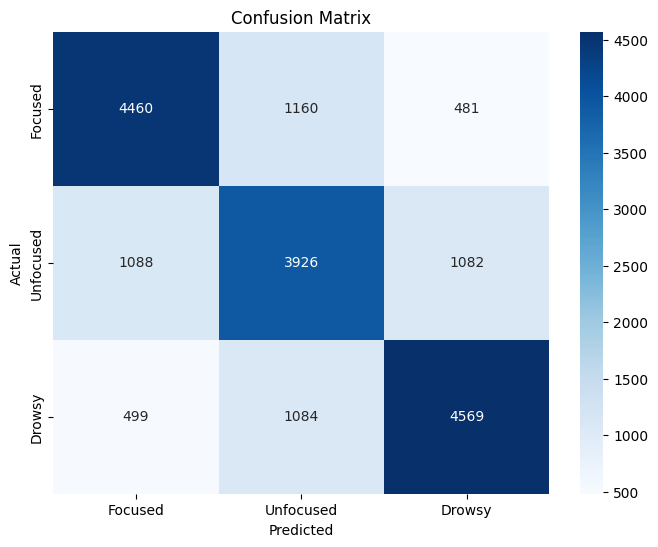

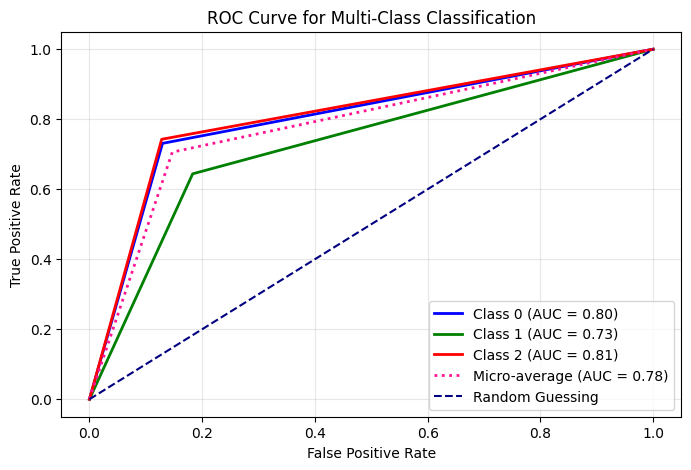

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=0)
dt_model.fit(X_train, y_train)

# Evaluate models
dt_preds = dt_model.predict(X_test)

print("Decision Tree")
print(classification_report(y_test, dt_preds))

y_score =dt_model.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, dt_preds)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])


plot_multiclass_roc(y_test, y_score, n_classes=3)

K-Neareast Neighbor
              precision    recall  f1-score   support

           0       0.82      0.83      0.83      6101
           1       0.73      0.76      0.75      6096
           2       0.85      0.80      0.83      6152

    accuracy                           0.80     18349
   macro avg       0.80      0.80      0.80     18349
weighted avg       0.80      0.80      0.80     18349

Micro-average AUC: 0.9381


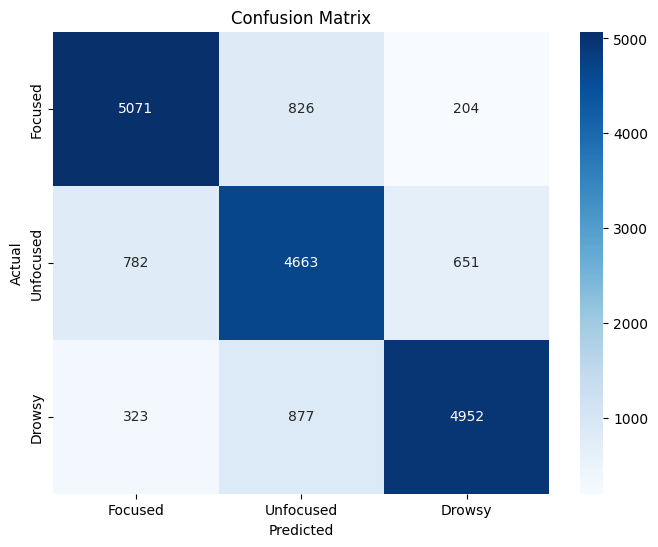

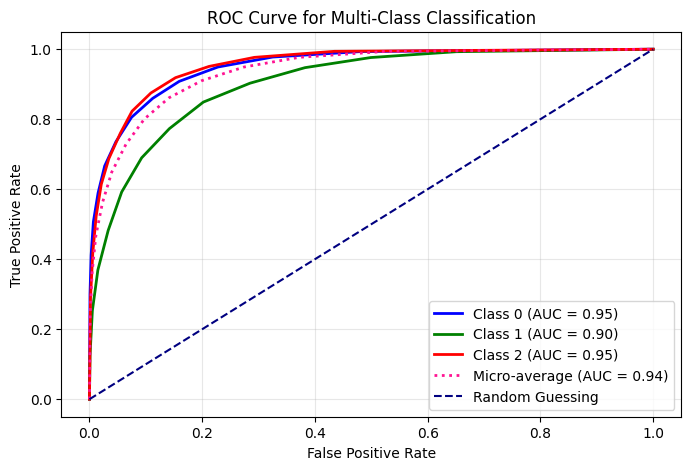

In [ ]:
knn_model = KNeighborsClassifier(
    n_neighbors=12,
    weights='uniform',
    algorithm='auto'
)
knn_model.fit(X_train, y_train)

# Evaluate models
knn_preds = knn_model.predict(X_test)

print("K-Neareast Neighbor")
print(classification_report(y_test, knn_preds))

y_score =knn_model.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, knn_preds)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])


plot_multiclass_roc(y_test, y_score, n_classes=3)

As we can see, after adding CWT features, the robust of dataset improved so that accuracy, f1 and auc scores are all increased
* **Decision Tree**
  * accuracy: 68% -> 71%
  * f1 score: 68% -> 71%
  * auc score: 76% -> 78%

* **KNN**
  * accuracy: 75% -> 80%
  * f1 score: 76% -> 80%
  * auc score: 90% -> 94%

**Now we use stacking classifier to find the most suitable model with our data**

Stacking Classifier
              precision    recall  f1-score   support

           0       0.86      0.85      0.86      6101
           1       0.78      0.79      0.78      6096
           2       0.87      0.87      0.87      6152

    accuracy                           0.84     18349
   macro avg       0.84      0.84      0.84     18349
weighted avg       0.84      0.84      0.84     18349

Micro-average AUC: 0.9554


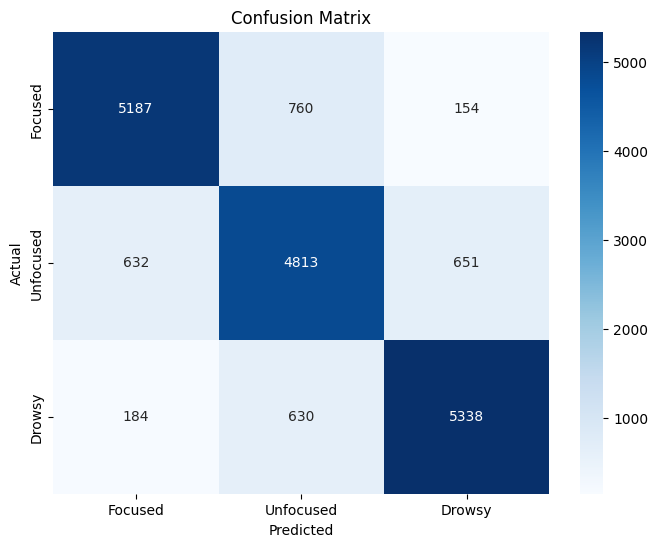

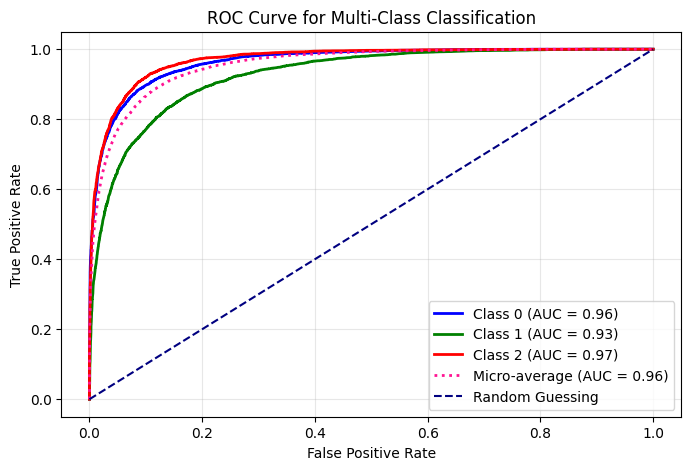

In [ ]:
estimators = [
    ('rf', RandomForestClassifier(n_estimators=10, random_state=42)),
    ('knn',  KNeighborsClassifier(
    n_neighbors=12,
    weights='uniform',
    algorithm='auto'
)),
    ('dt', DecisionTreeClassifier(random_state=0))
]
clf = StackingClassifier(
    estimators=estimators, final_estimator=LogisticRegression()
)
clf.fit(X_train, y_train)
preds = clf.predict(X_test)

print("Stacking Classifier")
print(classification_report(y_test, preds))

y_score =clf.predict_proba(X_test)
y_true_bin = label_binarize(y_test, classes=list(range(3)))
micro_auc = roc_auc_score(y_true_bin, y_score, average="micro")
print(f"Micro-average AUC: {micro_auc:.4f}")

cm = confusion_matrix(y_test, preds)
plot_confusion_matrix(cm=cm, labels=['Focused', 'Unfocused', 'Drowsy'])


plot_multiclass_roc(y_test, y_score, n_classes=3)

## Conclusion

* Fourier Transform is a way to process signal data when this method can transform data into frequency domain, which is easier to process
* Continuous Wavelet Transform is not only a way to transform data, it can also be used to make features for signal data to make data more robust
* Applying Signal Bands, Statistic and Continuous Wavelet Transform is a good way to process EEG data
* Using Machine Learning make good perfomance when classify EEG data into 3 states: focused, unfocused and drowsy

# 4. MLP model

Technique:
1. The rolling mean is the average of the previous observation window, where the window consists of a series of values from the time series data. Compute the mean for each ordered window. This can significantly help minimize noise in time series data.
2.  Stratified sampling:
- Stratified sampling involves dividing the population into subpopulations that may differ in important ways. It allows to draw more precise conclusions by ensuring that every subgroup is properly represented in the sample.I sampled 0.01 of the data while still retaining the ratio between the three classes each days.
3. Handle imbalance: I observed that label 2 is twice as frequent as label 1 and label 0. I decided to apply the following method:

- Step 1: I selected a subset of samples from label 2 with a size equal to (samples of label 1+samples of label 2)/2×1.3. The reason for this is to avoid forcing the model to entirely predict new samples as label 2.

- Step 2: I used the model to predict all samples of label 2, sorted them, and extracted the subset with the lowest accuracy, keeping the same size:
(samples of label 1+samples of label 2)/2×1.3


## 1. Library

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
random_state = 59
np.random.seed(random_state)
torch.manual_seed(random_state)
if torch.cuda.is_available():
    torch.cuda.manual_seed(random_state)

## 2. Data Engineering

In [ ]:
def extract_file_paths(folder_path, file_extension=None):

    file_paths = []
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file_extension and not file.endswith(file_extension):
                continue
            file_paths.append(os.path.join(root, file))
    return file_paths


folder_path = "/kaggle/input/eeg-data"
csv_files = extract_file_paths(folder_path, file_extension=".csv")

In [ ]:
!pip install --upgrade pandas

In [ ]:
def sliding_window(data, label):
    X = pd.DataFrame()
    y = pd.DataFrame()
    data=data.drop('state',axis=1)

    for channel in data.columns:
        rolling = data[channel].rolling(20).mean()
        X[channel] = rolling

    X = X.dropna()

    y = label[:len(X)]
    y = y.reset_index(drop=True)

    return X, y

In [ ]:
import pandas as pd
import numpy as np

def process_sliding_window(dataset, sliding_window):
    X = pd.DataFrame()
    y = pd.DataFrame()

    start = 0
    mapping = {1: 0, 2: 1, 0: 2}
    dataset['state'] = dataset['state'].map(mapping)
    dataset=dataset.drop(['AF3','AF4'],axis=1)

    for state in dataset['state'].unique():

        end = start + np.sum(dataset['state'] == state)

        X_label, y_label = sliding_window(dataset[start:end], dataset['state'][start:end])

        X = pd.concat([X, X_label], ignore_index=True)
        y = pd.concat([y, y_label], ignore_index=True)

        start = end

    return X, y


In [ ]:
def sampling_data(data):
    stratified_sample = data.groupby('state', group_keys=False, dropna=False).apply(
        lambda x: x.sample(frac=0.01, random_state=42), include_groups=False
    )

    stratified_sample['state'] = data.loc[stratified_sample.index, 'state'].values

    return stratified_sample

In [ ]:
X=pd.DataFrame()
y=pd.DataFrame()

for path in csv_files:
    data = pd.read_csv(path)
    stratified_sample = sampling_data(data)
    X_sample,y_sample=process_sliding_window(stratified_sample,sliding_window)
    X = pd.concat([X, X_sample], ignore_index=True)
    y = pd.concat([y, y_sample], ignore_index=True)



## 3. Modeling with raw-data

In [ ]:
y=y.values.reshape(-1)

In [ ]:
val_size=0.2
test_size=0.125
is_shuffle=True

X_train,X_val,y_train,y_val=train_test_split(X,y,test_size=val_size,shuffle=is_shuffle,stratify=y)
X_train,X_test,y_train,y_test=train_test_split(X_train,y_train,test_size=test_size,shuffle=is_shuffle,stratify=y_train)


In [ ]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_val=scaler.transform(X_val)
X_test=scaler.transform(X_test)

X_train=torch.tensor(X_train,dtype=torch.float32)
X_val=torch.tensor(X_val,dtype=torch.float32)
X_test=torch.tensor(X_test,dtype=torch.float32)
y_train=torch.tensor(y_train,dtype=torch.float32)
y_val=torch.tensor(y_val,dtype=torch.float32)
y_test=torch.tensor(y_test,dtype=torch.float32)

### a) Handling with imbalance

In [ ]:
class CustomDataset(Dataset):
  def __init__(self,X,y):
    self.X=X
    self.y=y
  def __len__(self):
    return len(self.X)
  def __getitem__ (self , idx ) :
    return self .X[ idx ] , self .y[ idx ]

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.linear1 = nn.Linear(input_dim, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.linear3 = nn.Linear(hidden_dim, hidden_dim)
        self.bn3 = nn.BatchNorm1d(hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.bn1(self.linear1(x)))
        x = F.relu(self.bn2(self.linear2(x)))
        x = self.dropout(x)
        x = F.relu(self.bn3(self.linear3(x)))
        x = self.output(x)
        return x


In [ ]:
batch_size = 32
train_dataset = CustomDataset ( X_train , y_train )
val_dataset = CustomDataset (X_val , y_val )
train_loader = DataLoader ( train_dataset ,batch_size = batch_size ,shuffle = True )
val_loader = DataLoader ( val_dataset ,batch_size = batch_size ,shuffle = False )

In [ ]:
class ModelTrainer:
    def __init__(self, model, criterion, optimizer):
        self.model = model
        self.criterion = criterion
        self.optimizer = optimizer

    def train(self, train_loader, val_loader, epochs):
        train_losses = []
        val_losses = []

        for epoch in range(epochs):
            train_loss = 0.0
            train_target = []
            train_pred = []
            val_loss = 0.0
            val_target = []
            val_pred = []

            self.model.train()
            for X_samples, y_samples in train_loader:
                X_samples, y_samples = X_samples.to(device), y_samples.to(device)
                self.optimizer.zero_grad()
                y_pred = self.model(X_samples)

                train_target.extend(y_samples.cpu().detach().numpy())
                train_pred.extend(y_pred.cpu().detach().numpy())
                loss = self.criterion(y_pred, y_samples.long())
                train_loss += loss.item()

                loss.backward()
                self.optimizer.step()

            train_losses.append(train_loss / len(train_loader))

            self.model.eval()
            with torch.no_grad():
                for X_samples, y_samples in val_loader:
                    X_samples, y_samples = X_samples.to(device), y_samples.to(device)
                    y_pred = self.model(X_samples)

                    val_target.extend(y_samples.cpu().detach().numpy())
                    val_pred.extend(y_pred.cpu().detach().numpy())
                    loss = self.criterion(y_pred, y_samples.long())
                    val_loss += loss.item()

                val_losses.append(val_loss / len(val_loader))

        return train_losses, val_losses


In [ ]:
input_dim=X_train.shape[1]
hidden_dim=64
output_dim=3
model = MLP(input_dim, hidden_dim, output_dim).to(device)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
mask_label_2 = y_train == 2.0
mask_label_01 = ~mask_label_2

X_train_label_2 = X_train[mask_label_2]
y_train_label_2 = y_train[mask_label_2]

X_train_label_01 = X_train[mask_label_01]
y_train_label_01 = y_train[mask_label_01]

In [ ]:
model_MLP=ModelTrainer(model,criterion,optimizer)

model_MLP.model.to(device)

X_train_label_01 = X_train_label_01.to(device)
y_train_label_01 = y_train_label_01.to(device)
X_train_label_2=X_train_label_2.to(device)

In [ ]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score
from torch.utils.data import DataLoader

few_epochs = 1
epochs = 40
check = True
sorted_with_indices = None

for epoch in range(epochs):
    if check:
        idx_random = np.random.choice(len(X_train_label_2), size=int(len(X_train_label_01) / 2 * 1.3), replace=False)
        X_train_label_2_subset = X_train_label_2[idx_random]
        y_train_label_2_subset = y_train_label_2[idx_random]
    else:
        selected_indices = [idx for idx, _ in sorted_with_indices[:int(len(X_train_label_01) / 2 * 1.3)]]
        X_train_label_2_subset = X_train_label_2[selected_indices]
        y_train_label_2_subset = y_train_label_2[selected_indices]

    X_train_combined = torch.cat((X_train_label_01, X_train_label_2_subset), dim=0)
    y_train_combined = torch.cat((y_train_label_01, y_train_label_2_subset.to(device)), dim=0)

    train_dataset = CustomDataset(X_train_combined, y_train_combined)
    val_dataset = CustomDataset(X_val, y_val)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    train_losses, val_losses = model_MLP.train(train_loader, val_loader, few_epochs)

    model_MLP.model.eval()
    with torch.no_grad():
        y_hat = model_MLP.model(X_train_label_2)
        y_pred_labels = torch.argmax(y_hat, dim=1)

        per_sample_accuracy = (y_train_label_2.cpu() == y_pred_labels.cpu()).numpy()

        sorted_with_indices = sorted(enumerate(per_sample_accuracy), key=lambda x: x[1], reverse=True)

        check = False

    print(f'\nEPOCH {epoch + 1}:\tTraining loss: {train_losses[-1]:.3f}\tValidation loss: {val_losses[-1]:.3f}')


EPOCH 1:	Training loss: 0.977	Validation loss: 0.932

EPOCH 2:	Training loss: 0.901	Validation loss: 0.970

EPOCH 3:	Training loss: 0.910	Validation loss: 0.963

EPOCH 4:	Training loss: 0.909	Validation loss: 0.952

EPOCH 5:	Training loss: 0.901	Validation loss: 0.969

EPOCH 6:	Training loss: 0.902	Validation loss: 0.957

EPOCH 7:	Training loss: 0.898	Validation loss: 0.962

EPOCH 8:	Training loss: 0.902	Validation loss: 0.977

EPOCH 9:	Training loss: 0.908	Validation loss: 0.942

EPOCH 10:	Training loss: 0.896	Validation loss: 0.965

EPOCH 11:	Training loss: 0.902	Validation loss: 0.954

EPOCH 12:	Training loss: 0.901	Validation loss: 0.954

EPOCH 13:	Training loss: 0.897	Validation loss: 0.965

EPOCH 14:	Training loss: 0.893	Validation loss: 0.958

EPOCH 15:	Training loss: 0.895	Validation loss: 0.965

EPOCH 16:	Training loss: 0.896	Validation loss: 0.961

EPOCH 17:	Training loss: 0.900	Validation loss: 0.949

EPOCH 18:	Training loss: 0.899	Validation loss: 0.953

EPOCH 19:	Training

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, f1_score
from sklearn.preprocessing import label_binarize
import torch
import seaborn as sns
import matplotlib.pyplot as plt

X_test = X_test.to(device)
y_test = y_test.to(device)


model_MLP.model.eval()
with torch.no_grad():
    y_hat_imbalance_handling = model_MLP.model(X_test)
    y_hat_classes_imbalance_handling = torch.argmax(y_hat_imbalance_handling, dim=1)


y_hat_imbalance_handling =y_hat_imbalance_handling.cpu()
y_hat_classes_imbalance_handling = y_hat_classes_imbalance_handling.cpu()
y_test = y_test.cpu()


n_classes = y_hat_imbalance_handling.size(1)
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))

auc_scores_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_imbalance_handling, average=None, multi_class='ovr')
macro_auc_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_imbalance_handling, average='macro', multi_class='ovr')

cm_imbalance_handling = confusion_matrix(y_test, y_hat_classes_imbalance_handling)

f1_macro_imbalance_handling = f1_score(y_test, y_hat_classes_imbalance_handling, average='macro')

### b) No handling imbalance

In [ ]:
input_dim=X_train.shape[1]
hidden_dim=64
output_dim=3
model = MLP(input_dim, hidden_dim, output_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
batch_size = 32
train_dataset = CustomDataset ( X_train , y_train )
val_dataset = CustomDataset (X_val , y_val )
train_dataloader = DataLoader ( train_dataset ,batch_size = batch_size ,shuffle = True )
valid_dataloader = DataLoader ( val_dataset ,batch_size = batch_size ,shuffle = False )

In [ ]:
def custom_cel_loss(pred, target):
    cel_loss = nn.CrossEntropyLoss()
    return cel_loss(pred, target)

num_epochs = 40
for epoch in range(num_epochs):

    model.train()
    total_loss = 0
    all_preds = []
    all_labels = []

    for x_batch, y_batch in train_dataloader:
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device).long()

        optimizer.zero_grad()
        pred = model(x_batch)

        loss = custom_cel_loss(pred, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()


    avg_train_loss = total_loss / len(train_dataloader)



    model.eval()
    val_total_loss = 0
    val_all_preds = []
    val_all_labels = []

    with torch.no_grad():
        for x_batch, y_batch in valid_dataloader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device).long()

            pred = model(x_batch)
            val_loss = custom_cel_loss(pred, y_batch)

            val_total_loss += val_loss.item()

    avg_val_loss = val_total_loss / len(valid_dataloader)

    print(f'\nEPOCH {epoch + 1}:\tTraining loss: {avg_train_loss:.3f}\tValidation loss: {avg_val_loss:.3f}')



EPOCH 1:	Training loss: 1.032	Validation loss: 0.999

EPOCH 2:	Training loss: 1.009	Validation loss: 0.986

EPOCH 3:	Training loss: 0.997	Validation loss: 0.975

EPOCH 4:	Training loss: 0.986	Validation loss: 0.964

EPOCH 5:	Training loss: 0.977	Validation loss: 0.952

EPOCH 6:	Training loss: 0.972	Validation loss: 0.947

EPOCH 7:	Training loss: 0.969	Validation loss: 0.942

EPOCH 8:	Training loss: 0.963	Validation loss: 0.935

EPOCH 9:	Training loss: 0.956	Validation loss: 0.926

EPOCH 10:	Training loss: 0.953	Validation loss: 0.925

EPOCH 11:	Training loss: 0.951	Validation loss: 0.920

EPOCH 12:	Training loss: 0.946	Validation loss: 0.913

EPOCH 13:	Training loss: 0.944	Validation loss: 0.912

EPOCH 14:	Training loss: 0.939	Validation loss: 0.912

EPOCH 15:	Training loss: 0.936	Validation loss: 0.903

EPOCH 16:	Training loss: 0.936	Validation loss: 0.898

EPOCH 17:	Training loss: 0.933	Validation loss: 0.900

EPOCH 18:	Training loss: 0.932	Validation loss: 0.897

EPOCH 19:	Training

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, f1_score
from sklearn.preprocessing import label_binarize
import torch
import seaborn as sns
import matplotlib.pyplot as plt

X_test = X_test.to(device)
y_test = y_test.to(device)

model.eval()
with torch.no_grad():
    y_hat_no_imbalance_handling = model(X_test)
    y_hat_classes_no_imbalance_handling = torch.argmax(y_hat_no_imbalance_handling, dim=1)

y_hat_no_imbalance_handling = y_hat_no_imbalance_handling.cpu()
y_hat_classes_no_imbalance_handling = y_hat_classes_no_imbalance_handling.cpu()
y_test = y_test.cpu()

n_classes = y_hat.size(1)
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))

auc_scores_no_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_no_imbalance_handling, average=None, multi_class='ovr')
macro_auc_no_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_no_imbalance_handling, average='macro', multi_class='ovr')

cm_no_imbalance_handling = confusion_matrix(y_test, y_hat_classes_no_imbalance_handling)

f1_macro_no_imbalance_handling = f1_score(y_test, y_hat_classes_no_imbalance_handling, average='macro')


### c. Evaluation

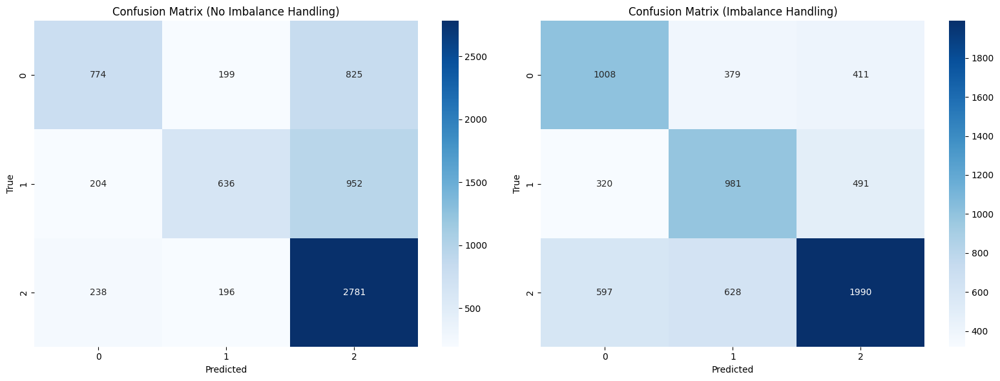

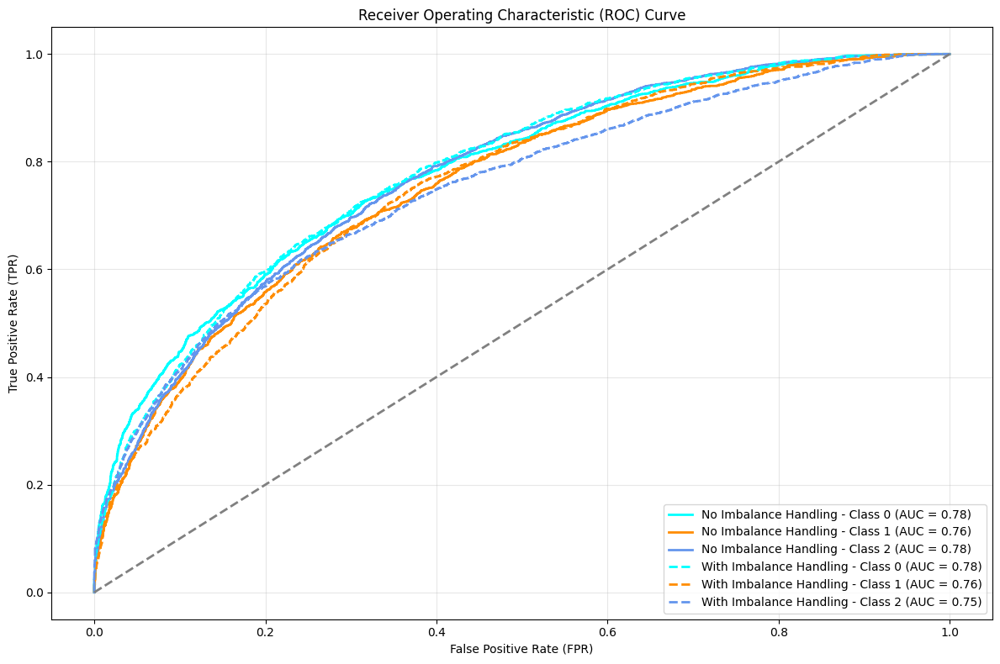

Evaluation without Imbalance Handling:
Class-wise AUC scores: [0.78078066 0.75925907 0.77566907]
Macro-average AUC: 0.7719029315352844
Macro-average F1 Score: 0.5599138366476751
Classification Report:
              precision    recall  f1-score   support

         0.0       0.64      0.43      0.51      1798
         1.0       0.62      0.35      0.45      1792
         2.0       0.61      0.87      0.72      3215

    accuracy                           0.62      6805
   macro avg       0.62      0.55      0.56      6805
weighted avg       0.62      0.62      0.59      6805


Evaluation with Imbalance Handling:
Class-wise AUC scores: [0.78238486 0.75665524 0.75024931]
Macro-average AUC: 0.7630964708506544
Macro-average F1 Score: 0.5707525204943328
Classification Report:
              precision    recall  f1-score   support

         0.0       0.52      0.56      0.54      1798
         1.0       0.49      0.55      0.52      1792
         2.0       0.69      0.62      0.65      3215

 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, roc_curve, auc

def plot_comparison():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    sns.heatmap(cm_no_imbalance_handling, annot=True, fmt='d', cmap='Blues',
                xticklabels=range(n_classes), yticklabels=range(n_classes), ax=axes[0])
    axes[0].set_title('Confusion Matrix (No Imbalance Handling)')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('True')

    sns.heatmap(cm_imbalance_handling, annot=True, fmt='d', cmap='Blues',
                xticklabels=range(n_classes), yticklabels=range(n_classes), ax=axes[1])
    axes[1].set_title('Confusion Matrix (Imbalance Handling)')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('True')

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 8))

    colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat_no_imbalance_handling[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=colors[i % len(colors)], lw=2,
                 label=f'No Imbalance Handling - Class {i} (AUC = {roc_auc:.2f})')

    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat_imbalance_handling[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=colors[i % len(colors)], lw=2, linestyle='--',
                 label=f'With Imbalance Handling - Class {i} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)

    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print("Evaluation without Imbalance Handling:")
    print(f"Class-wise AUC scores: {auc_scores_no_imbalance_handling}")
    print(f"Macro-average AUC: {macro_auc_no_imbalance_handling}")
    print(f"Macro-average F1 Score: {f1_macro_no_imbalance_handling}")
    print("Classification Report:")
    print(classification_report(y_test, y_hat_classes_no_imbalance_handling))

    print("\nEvaluation with Imbalance Handling:")
    print(f"Class-wise AUC scores: {auc_scores_imbalance_handling}")
    print(f"Macro-average AUC: {macro_auc_imbalance_handling}")
    print(f"Macro-average F1 Score: {f1_macro_imbalance_handling}")
    print("Classification Report:")
    print(classification_report(y_test, y_hat_classes_imbalance_handling))

plot_comparison()


1. Confusion Matrix:

The true predictions across the three classes from imbalance handling are more balanced compared to those without imbalance handling. The model's capability to handle imbalance improves predictions for classes 0 and 1.

2. Class-wise AUC Scores:

For 0.5 < AUC < 1.0, the model demonstrates some discrimination ability.
The model can distinguish between positive and negative classes regardless of the classification threshold.

3. F1 Score:

The F1 score and AUC score are not significantly different.

3. Classification Report:

The second method achieves higher overall accuracy and better recall for Class 2, making it preferable when accurately identifying this class is critical.
The first method performs better in Class 0 and Class 1 recall, which may be advantageous if recall for these classes is more important.

## 4. Modeling for data with added features

In [ ]:
import glob

In [ ]:

directory_path = '/kaggle/input/fft-features'


file_paths = glob.glob(f"{directory_path}/*.csv")


data_frames = [pd.read_csv(file) for file in file_paths]
data = pd.concat(data_frames, ignore_index=True)


In [ ]:
data=data.drop('Unnamed: 0',axis=1)

In [ ]:
y=data['state']
X=data.drop('state',axis=1)

In [ ]:
y=y.values.reshape(-1)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
random_state = 59
np.random.seed(random_state)
torch.manual_seed(random_state)
if torch.cuda.is_available():
    torch.cuda.manual_seed(random_state)

In [ ]:
val_size=0.2
test_size=0.125
is_shuffle=True

X_train,X_val,y_train,y_val=train_test_split(X,y,test_size=val_size,shuffle=is_shuffle,stratify=y)
X_train,X_test,y_train,y_test=train_test_split(X_train,y_train,test_size=test_size,shuffle=is_shuffle,stratify=y_train)


In [ ]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_val=scaler.transform(X_val)
X_test=scaler.transform(X_test)

X_train=torch.tensor(X_train,dtype=torch.float32)
X_val=torch.tensor(X_val,dtype=torch.float32)
X_test=torch.tensor(X_test,dtype=torch.float32)
y_train=torch.tensor(y_train,dtype=torch.float32)
y_val=torch.tensor(y_val,dtype=torch.float32)
y_test=torch.tensor(y_test,dtype=torch.float32)

### a) Handling with imbalance

In [ ]:
class CustomDataset(Dataset):
  def __init__(self,X,y):
    self.X=X
    self.y=y
  def __len__(self):
    return len(self.X)
  def __getitem__ (self , idx ) :
    return self .X[ idx ] , self .y[ idx ]

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.linear1 = nn.Linear(input_dim, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.linear3 = nn.Linear(hidden_dim, hidden_dim)
        self.bn3 = nn.BatchNorm1d(hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.bn1(self.linear1(x)))
        x = F.relu(self.bn2(self.linear2(x)))
        x = self.dropout(x)
        x = F.relu(self.bn3(self.linear3(x)))
        x = self.output(x)
        return x


In [ ]:
batch_size = 32
train_dataset = CustomDataset ( X_train , y_train )
val_dataset = CustomDataset (X_val , y_val )
train_loader = DataLoader ( train_dataset ,batch_size = batch_size ,shuffle = True )
val_loader = DataLoader ( val_dataset ,batch_size = batch_size ,shuffle = False )

In [ ]:
class ModelTrainer:
    def __init__(self, model, criterion, optimizer):
        self.model = model
        self.criterion = criterion
        self.optimizer = optimizer

    def train(self, train_loader, val_loader, epochs):
        train_losses = []
        val_losses = []

        for epoch in range(epochs):
            train_loss = 0.0
            train_target = []
            train_pred = []
            val_loss = 0.0
            val_target = []
            val_pred = []

            self.model.train()
            for X_samples, y_samples in train_loader:
                X_samples, y_samples = X_samples.to(device), y_samples.to(device)
                self.optimizer.zero_grad()
                y_pred = self.model(X_samples)

                train_target.extend(y_samples.cpu().detach().numpy())
                train_pred.extend(y_pred.cpu().detach().numpy())
                loss = self.criterion(y_pred, y_samples.long())
                train_loss += loss.item()

                loss.backward()
                self.optimizer.step()

            train_losses.append(train_loss / len(train_loader))

            self.model.eval()
            with torch.no_grad():
                for X_samples, y_samples in val_loader:
                    X_samples, y_samples = X_samples.to(device), y_samples.to(device)
                    y_pred = self.model(X_samples)

                    val_target.extend(y_samples.cpu().detach().numpy())
                    val_pred.extend(y_pred.cpu().detach().numpy())
                    loss = self.criterion(y_pred, y_samples.long())
                    val_loss += loss.item()

                val_losses.append(val_loss / len(val_loader))

        return train_losses, val_losses


In [ ]:
input_dim=X_train.shape[1]
hidden_dim=64
output_dim=3
model = MLP(input_dim, hidden_dim, output_dim).to(device)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
mask_label_2 = y_train == 2.0
mask_label_01 = ~mask_label_2

X_train_label_2 = X_train[mask_label_2]
y_train_label_2 = y_train[mask_label_2]

X_train_label_01 = X_train[mask_label_01]
y_train_label_01 = y_train[mask_label_01]

In [ ]:
model_MLP=ModelTrainer(model,criterion,optimizer)

model_MLP.model.to(device)

X_train_label_01 = X_train_label_01.to(device)
y_train_label_01 = y_train_label_01.to(device)
X_train_label_2=X_train_label_2.to(device)

In [ ]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score
from torch.utils.data import DataLoader

few_epochs = 1
epochs = 40
check = True
sorted_with_indices = None

for epoch in range(epochs):
    if check:
        idx_random = np.random.choice(len(X_train_label_2), size=int(len(X_train_label_01) / 2 * 1.3), replace=False)
        X_train_label_2_subset = X_train_label_2[idx_random]
        y_train_label_2_subset = y_train_label_2[idx_random]
    else:
        selected_indices = [idx for idx, _ in sorted_with_indices[:int(len(X_train_label_01) / 2 * 1.3)]]
        X_train_label_2_subset = X_train_label_2[selected_indices]
        y_train_label_2_subset = y_train_label_2[selected_indices]

    X_train_combined = torch.cat((X_train_label_01, X_train_label_2_subset), dim=0)
    y_train_combined = torch.cat((y_train_label_01, y_train_label_2_subset.to(device)), dim=0)

    train_dataset = CustomDataset(X_train_combined, y_train_combined)
    val_dataset = CustomDataset(X_val, y_val)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    train_losses, val_losses = model_MLP.train(train_loader, val_loader, few_epochs)

    model_MLP.model.eval()
    with torch.no_grad():
        y_hat = model_MLP.model(X_train_label_2)
        y_pred_labels = torch.argmax(y_hat, dim=1)

        per_sample_accuracy = (y_train_label_2.cpu() == y_pred_labels.cpu()).numpy()

        sorted_with_indices = sorted(enumerate(per_sample_accuracy), key=lambda x: x[1], reverse=True)

        check = False

    print(f'\nEPOCH {epoch + 1}:\tTraining loss: {train_losses[-1]:.3f}\tValidation loss: {val_losses[-1]:.3f}')


EPOCH 1:	Training loss: 0.855	Validation loss: 0.712

EPOCH 2:	Training loss: 0.704	Validation loss: 0.677

EPOCH 3:	Training loss: 0.668	Validation loss: 0.651

EPOCH 4:	Training loss: 0.646	Validation loss: 0.658

EPOCH 5:	Training loss: 0.628	Validation loss: 0.646

EPOCH 6:	Training loss: 0.619	Validation loss: 0.652

EPOCH 7:	Training loss: 0.608	Validation loss: 0.636

EPOCH 8:	Training loss: 0.601	Validation loss: 0.648

EPOCH 9:	Training loss: 0.599	Validation loss: 0.622

EPOCH 10:	Training loss: 0.597	Validation loss: 0.607

EPOCH 11:	Training loss: 0.604	Validation loss: 0.610

EPOCH 12:	Training loss: 0.594	Validation loss: 0.597

EPOCH 13:	Training loss: 0.596	Validation loss: 0.609

EPOCH 14:	Training loss: 0.592	Validation loss: 0.610

EPOCH 15:	Training loss: 0.578	Validation loss: 0.606

EPOCH 16:	Training loss: 0.575	Validation loss: 0.615

EPOCH 17:	Training loss: 0.572	Validation loss: 0.623

EPOCH 18:	Training loss: 0.566	Validation loss: 0.601

EPOCH 19:	Training

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, f1_score
from sklearn.preprocessing import label_binarize
import torch
import seaborn as sns
import matplotlib.pyplot as plt


X_test = X_test.to(device)
y_test = y_test.to(device)


model_MLP.model.eval()
with torch.no_grad():
    y_hat_imbalance_handling = model_MLP.model(X_test)
    y_hat_classes_imbalance_handling = torch.argmax(y_hat_imbalance_handling, dim=1)


y_hat_imbalance_handling =y_hat_imbalance_handling.cpu()
y_hat_classes_imbalance_handling = y_hat_classes_imbalance_handling.cpu()
y_test = y_test.cpu()


n_classes = y_hat_imbalance_handling.size(1)
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))


auc_scores_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_imbalance_handling, average=None, multi_class='ovr')
macro_auc_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_imbalance_handling, average='macro', multi_class='ovr')

cm_imbalance_handling = confusion_matrix(y_test, y_hat_classes_imbalance_handling)

f1_macro_imbalance_handling = f1_score(y_test, y_hat_classes_imbalance_handling, average='macro')

### b) No handling with imbalance

In [ ]:
input_dim=X_train.shape[1]
hidden_dim=64
output_dim=3
model = MLP(input_dim, hidden_dim, output_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)  # Lower learning rate

In [ ]:
batch_size = 32
train_dataset = CustomDataset ( X_train , y_train )
val_dataset = CustomDataset (X_val , y_val )
train_dataloader = DataLoader ( train_dataset ,batch_size = batch_size ,shuffle = True )
valid_dataloader = DataLoader ( val_dataset ,batch_size = batch_size ,shuffle = False )

In [ ]:
import torch
import torch.nn as nn



def custom_cel_loss(pred, target):
    cel_loss = nn.CrossEntropyLoss()
    return cel_loss(pred, target)

num_epochs = 40
for epoch in range(num_epochs):

    model.train()
    total_loss = 0
    all_preds = []
    all_labels = []

    for x_batch, y_batch in train_dataloader:
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device).long()

        optimizer.zero_grad()
        pred = model(x_batch)

        loss = custom_cel_loss(pred, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()


    avg_train_loss = total_loss / len(train_dataloader)



    model.eval()
    val_total_loss = 0
    val_all_preds = []
    val_all_labels = []

    with torch.no_grad():
        for x_batch, y_batch in valid_dataloader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device).long()

            pred = model(x_batch)
            val_loss = custom_cel_loss(pred, y_batch)

            val_total_loss += val_loss.item()


    avg_val_loss = val_total_loss / len(valid_dataloader)

    print(f'\nEPOCH {epoch + 1}:\tTraining loss: {avg_train_loss:.3f}\tValidation loss: {avg_val_loss:.3f}')



EPOCH 1:	Training loss: 0.746	Validation loss: 0.572

EPOCH 2:	Training loss: 0.621	Validation loss: 0.520

EPOCH 3:	Training loss: 0.576	Validation loss: 0.485

EPOCH 4:	Training loss: 0.547	Validation loss: 0.466

EPOCH 5:	Training loss: 0.530	Validation loss: 0.463

EPOCH 6:	Training loss: 0.516	Validation loss: 0.465

EPOCH 7:	Training loss: 0.502	Validation loss: 0.431

EPOCH 8:	Training loss: 0.496	Validation loss: 0.422

EPOCH 9:	Training loss: 0.487	Validation loss: 0.426

EPOCH 10:	Training loss: 0.483	Validation loss: 0.408

EPOCH 11:	Training loss: 0.474	Validation loss: 0.419

EPOCH 12:	Training loss: 0.469	Validation loss: 0.407

EPOCH 13:	Training loss: 0.464	Validation loss: 0.402

EPOCH 14:	Training loss: 0.464	Validation loss: 0.402

EPOCH 15:	Training loss: 0.457	Validation loss: 0.403

EPOCH 16:	Training loss: 0.452	Validation loss: 0.389

EPOCH 17:	Training loss: 0.450	Validation loss: 0.394

EPOCH 18:	Training loss: 0.449	Validation loss: 0.395

EPOCH 19:	Training

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, f1_score
from sklearn.preprocessing import label_binarize
import torch
import seaborn as sns
import matplotlib.pyplot as plt


X_test = X_test.to(device)
y_test = y_test.to(device)

model.eval()
with torch.no_grad():
    y_hat_no_imbalance_handling = model(X_test)
    y_hat_classes_no_imbalance_handling = torch.argmax(y_hat_no_imbalance_handling, dim=1)


y_hat_no_imbalance_handling = y_hat_no_imbalance_handling.cpu()
y_hat_classes_no_imbalance_handling = y_hat_classes_no_imbalance_handling.cpu()
y_test = y_test.cpu()


n_classes = y_hat.size(1)
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))

auc_scores_no_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_no_imbalance_handling, average=None, multi_class='ovr')
macro_auc_no_imbalance_handling = roc_auc_score(y_test_one_hot, y_hat_no_imbalance_handling, average='macro', multi_class='ovr')

cm_no_imbalance_handling = confusion_matrix(y_test, y_hat_classes_no_imbalance_handling)

f1_macro_no_imbalance_handling = f1_score(y_test, y_hat_classes_no_imbalance_handling, average='macro')


### c) Evalutation

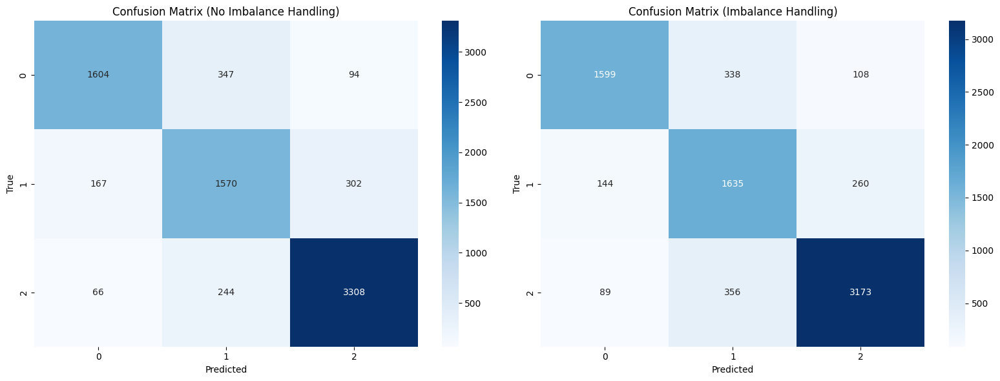

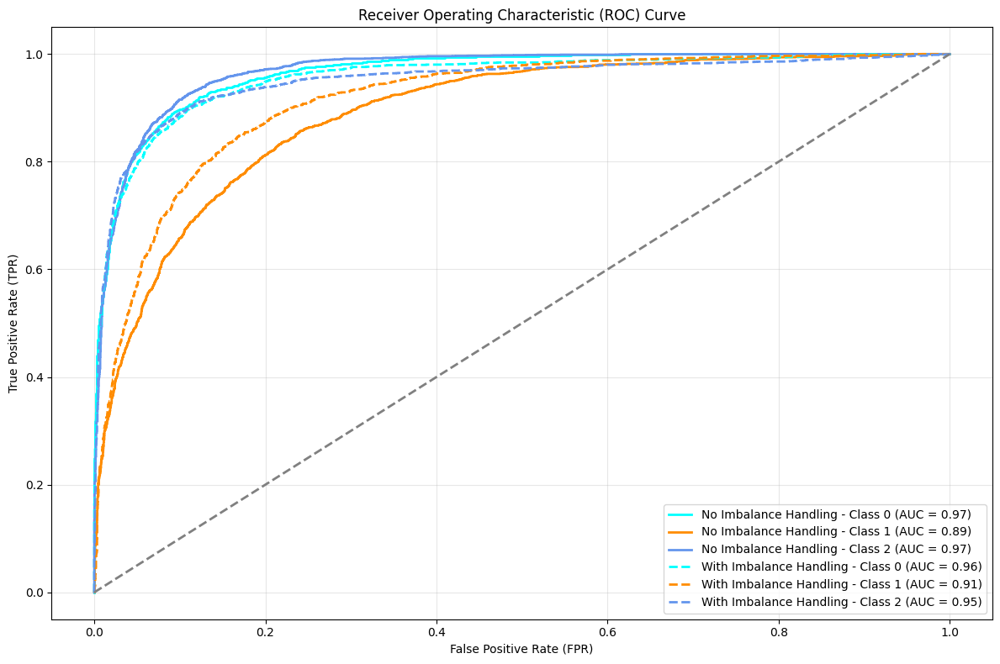

Evaluation without Imbalance Handling:
Class-wise AUC scores: [0.96503222 0.88982993 0.96836398]
Macro-average AUC: 0.941075380041244
Macro-average F1 Score: 0.8258584868385656
Classification Report:
              precision    recall  f1-score   support

         0.0       0.87      0.78      0.83      2045
         1.0       0.73      0.77      0.75      2039
         2.0       0.89      0.91      0.90      3618

    accuracy                           0.84      7702
   macro avg       0.83      0.82      0.83      7702
weighted avg       0.84      0.84      0.84      7702


Evaluation with Imbalance Handling:
Class-wise AUC scores: [0.95606992 0.91431582 0.94965062]
Macro-average AUC: 0.9400121190167808
Macro-average F1 Score: 0.8199758709367807
Classification Report:
              precision    recall  f1-score   support

         0.0       0.87      0.78      0.82      2045
         1.0       0.70      0.80      0.75      2039
         2.0       0.90      0.88      0.89      3618

  

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, roc_curve, auc

def plot_comparison():

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))


    sns.heatmap(cm_no_imbalance_handling, annot=True, fmt='d', cmap='Blues',
                xticklabels=range(n_classes), yticklabels=range(n_classes), ax=axes[0])
    axes[0].set_title('Confusion Matrix (No Imbalance Handling)')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('True')


    sns.heatmap(cm_imbalance_handling, annot=True, fmt='d', cmap='Blues',
                xticklabels=range(n_classes), yticklabels=range(n_classes), ax=axes[1])
    axes[1].set_title('Confusion Matrix (Imbalance Handling)')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('True')

    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(12, 8))


    colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat_no_imbalance_handling[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=colors[i % len(colors)], lw=2,
                 label=f'No Imbalance Handling - Class {i} (AUC = {roc_auc:.2f})')


    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat_imbalance_handling[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=colors[i % len(colors)], lw=2, linestyle='--',
                 label=f'With Imbalance Handling - Class {i} (AUC = {roc_auc:.2f})')


    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)


    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


    print("Evaluation without Imbalance Handling:")
    print(f"Class-wise AUC scores: {auc_scores_no_imbalance_handling}")
    print(f"Macro-average AUC: {macro_auc_no_imbalance_handling}")
    print(f"Macro-average F1 Score: {f1_macro_no_imbalance_handling}")
    print("Classification Report:")
    print(classification_report(y_test, y_hat_classes_no_imbalance_handling))

    print("\nEvaluation with Imbalance Handling:")
    print(f"Class-wise AUC scores: {auc_scores_imbalance_handling}")
    print(f"Macro-average AUC: {macro_auc_imbalance_handling}")
    print(f"Macro-average F1 Score: {f1_macro_imbalance_handling}")
    print("Classification Report:")
    print(classification_report(y_test, y_hat_classes_imbalance_handling))
plot_comparison()



1. Confusion Matrix:
The inclusion of imbalance handling is a positive step toward improving the fairness and overall balance of the model's predictions, especially for the underperforming class (class 1).
2. F1 Score: The F1 score and AUC score are not significantly different.

3. Classification Report: Without Imbalance Handling: The model achieves 0.84 accuracy, which is good, but macro-average F1-score (0.83) indicates room for improvement, especially in handling imbalanced data. With Imbalance Handling: The accuracy remains the same (0.84), but the performance balance across classes improves.

=> Imbalance handling is beneficial for improving the performance balance between classes, particularly for the underperforming class (class 1)


# XG-Boost

## Import libraries

In [ ]:
# Core Libraries
import numpy as np
import pandas as pd

# Data Processing and Resampling
from sklearn.utils import resample
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from collections import Counter

# Model and Training
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

# Evaluation Metrics
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    roc_auc_score,
    confusion_matrix,
    f1_score,
    roc_curve,
    auc
)
from sklearn.preprocessing import label_binarize

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Kaggle and File Handling
import kagglehub
import os
import glob

# Feature Importance (Permutation)
from sklearn.inspection import permutation_importance

## Explaining techniques applied



### XGBoost

#### What is Gradient Boosting?

XGBoost (eXtreme Gradient Boosting) is a cutting-edge machine learning algorithm that excels in structured data problems, such as classification and regression.

Gradient Boosting is an ensemble learning method that builds a predictive model incrementally by combining the strengths of multiple weak learners, typically decision trees. It works by sequentially adding new trees that correct the errors made by previous models. The process involves minimizing a loss function (e.g., mean squared error for regression or log loss for classification) by iteratively optimizing the predictions.

Key steps in gradient boosting:
1. **Initialization**: Start with a simple model, such as predicting the mean of the target values.
2. **Residual Calculation**: Calculate the residuals (errors) between the current predictions and actual values.
3. **New Model**: Train a new model to predict the residuals.
4. **Update**: Add the new model's predictions to the previous model, gradually improving accuracy.
5. **Repeat**: Continue adding models until a stopping criterion, such as a maximum number of iterations or a negligible improvement, is met.

Gradient boosting's strength lies in its ability to optimize complex objective functions and handle both regression and classification tasks effectively.

#### How XGBoost Enhances Gradient Boosting

XGBoost builds on the foundation of gradient boosting by introducing several key enhancements:
1. **Regularization**: XGBoost incorporates L1 (Lasso) and L2 (Ridge) regularization to reduce overfitting, making it more robust on complex datasets.
2. **Efficient Computations**: It uses optimized data structures and algorithms, such as parallel processing and in-memory computations, to handle large datasets with remarkable speed.
3. **Sparsity Awareness**: Automatically handles missing or sparse data by learning optimal split directions.
4. **Flexibility**: Supports custom objective functions and evaluation metrics, catering to a wide range of use cases.
5. **Advanced Tree Pruning**: Employs a "max delta step" algorithm for better handling of imbalanced data.

#### Why Use XGBoost?

XGBoost is widely regarded for its superior predictive accuracy and efficiency. It consistently outperforms other machine learning algorithms in tasks involving tabular data. It has also gained immense popularity in data science competitions like Kaggle, where small performance gains can make a significant difference.

#### Benefits of XGBoost

- Handles large datasets with high performance.
- Offers fine-grained control over model parameters.
- Supports distributed computing for scalability.
- Can be used for classification and regression.

#### Model Explanation

##### Simple Explanation

To put it in a way that a person without mathematical background can understand, XGBoost is a machine learning algorithm that builds a series of simple decision trees, each focusing on correcting the mistakes of the previous ones. It starts with a basic prediction (like guessing the average value) and measures the errors. Then, it creates a tree to learn patterns in those errors and updates the predictions by combining the original guess with the tree's corrections. This process is repeated step by step, gradually improving accuracy. XGBoost also includes safeguards to prevent overfitting by limiting tree complexity and adding penalties for overly complicated models, making it fast, efficient, and highly effective for many types of data.

##### Mathematical Explanation

###### Objective Function

XGBoost optimizes an objective function that combines a loss function and a regularization term:
$$
\mathcal{L}\left(F_m\right)=\sum_{i=1}^N L\left(y_i, \hat{y}_i\right)+\Omega\left(f_m\right)
$$

Where:
- $L\left(y_i, \hat{y}_i\right)$ : A differentiable convex loss function (e.g., mean squared error for regression, log-loss for classification).
- $\hat{y}_i=F_m\left(x_i\right)$ : The predicted value for sample $i$.
- $\Omega\left(f_m\right)$ : Regularization term for the complexity of the current tree $f_m(x)$.


####### Regularization Term

The regularization term controls the complexity of the tree:
$$
\Omega\left(f_m\right)=\gamma T+\frac{1}{2} \lambda \sum_{j=1}^T w_j^2
$$

Where:
- $T$ : Number of leaves in the tree.
- $w_j$ : The weight of the $j$-th leaf.
- $\gamma$ : Minimum loss reduction required to make a split.
- $\quad \lambda$ : L2 regularization term on leaf weights.

###### Second-Order Approximation for Efficiency


To make optimization tractable, XGBoost uses a second-order Taylor expansion of the loss function around the current prediction $F_{m-1}(x)$ :
$$
L\left(y_i, F_m\left(x_i\right)\right) \approx L\left(y_i, F_{m-1}\left(x_i\right)\right)+g_i f_m\left(x_i\right)+\frac{1}{2} h_i\left[f_m\left(x_i\right)\right]^2
$$

Where:
- $g_i=\frac{\partial L\left(y_i, F\left(x_i\right)\right)}{\partial F\left(x_i\right)}:$ First derivative (gradient).
- $h_i=\frac{\partial^2 L\left(y_i, F\left(x_i\right)\right)}{\partial^2 F\left(x_i\right)}$ : Second derivative (Hessian).

Substituting this into the objective function:
$$
\mathcal{L}\left(F_m\right) \approx \sum_{i=1}^N\left[g_i f_m\left(x_i\right)+\frac{1}{2} h_i f_m^2\left(x_i\right)\right]+\Omega\left(f_m\right)
$$

This approximation makes it possible to optimize each tree efficiently.

###### Tree Structure

XGBoost builds decision trees $f_m(x)$, where each tree maps an input $x$ to a leaf node weight $w_j$. The structure of the tree is defined by partitioning the data into regions $R_j$, so the prediction for $x \in R_j$ is:
$$
f_m(x)=w_j \quad \text { if } \quad x \in R_j
$$

The goal is to find the optimal $w_j$ and splits $R_j$ to minimize the objective function.

###### Optimizing Leaf Weights



For a given structure of the tree, the optimal weight $w_j$ for a leaf $j$ is computed as:
$$
w_j^*=-\frac{\sum_{i \in R_j} g_i}{\sum_{i \in R_j} h_i+\lambda}
$$

Where:
- $\sum_{i \in R_j} g_i$ : Sum of gradients for samples in leaf $j$.
- $\sum_{i \in R_j} h_i$ : Sum of Hessians for samples in leaf $j$.
- $\lambda$ : L2 regularization parameter.


###### Tree Splitting Criterion



The quality of a split is evaluated using the gain, which measures the improvement in the objective function. For a split into two regions $R_L$ and $R_R$ :
$$
\text { Gain }=\frac{1}{2}\left[\frac{\left(\sum_{i \in R_L} g_i\right)^2}{\sum_{i \in R_L} h_i+\lambda}+\frac{\left(\sum_{i \in R_R} g_i\right)^2}{\sum_{i \in R_R} h_i+\lambda}-\frac{\left(\sum_{i \in R} g_i\right)^2}{\sum_{i \in R} h_i+\lambda}\right]-\gamma
$$

Where:
- $R$ : The region before the split.
- $\gamma$ : Regularization term for tree complexity.

The split with the highest gain is chosen.

###### Prediction Update

After building the $m$-th tree, the model is updated as:
$$
F_m(x)=F_{m-1}(x)+\nu f_m(x)
$$

Where $\nu$ is the learning rate.

## SMOTE

#### Quick explanation

SMOTE (Synthetic Minority Over-sampling Technique) is a method used to solve the problem of imbalanced datasets in machine learning. When one class in a dataset has fewer examples than the other, SMOTE creates new, synthetic data points for the underrepresented class. It does this by picking random points between an existing minority class sample and its neighbors, then generating new data points along the way. This helps balance the dataset, allowing the model to learn better from the minority class and improve performance, especially in predicting rare events. However, it can also introduce noise if the original data is not clean.

#### Example

Class distribution before SMOTE: Counter({0: 744, 1: 256})
Class distribution after SMOTE: Counter({0: 744, 1: 744})


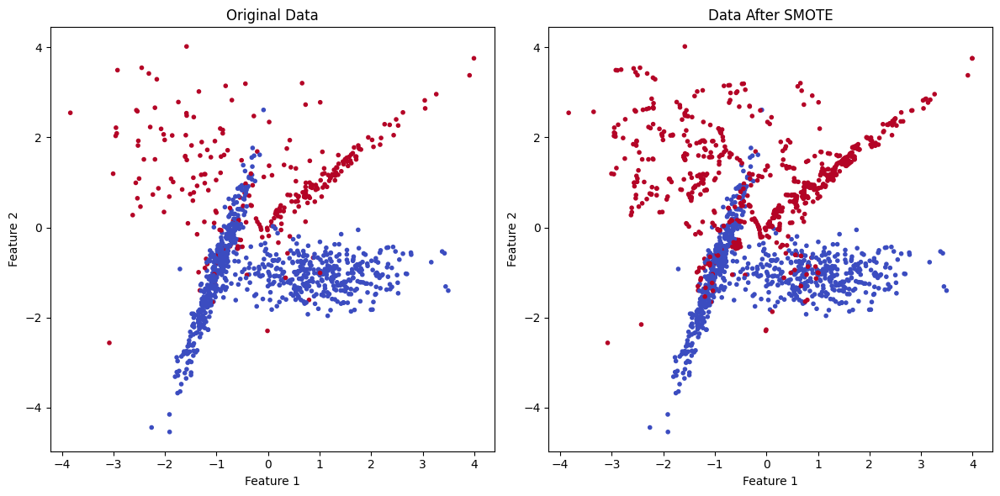

In [ ]:
# Generate an imbalanced dataset with a 75-25 distribution
X, y = make_classification(n_samples=1000, n_features=2, n_classes=2,
                           n_informative=2, n_redundant=0, weights=[0.75, 0.25], random_state=42)

# Before applying SMOTE: Show class distribution
print("Class distribution before SMOTE:", Counter(y))

# Apply SMOTE to balance the classes
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_res, y_res = smote.fit_resample(X, y)

# After applying SMOTE: Show new class distribution
print("Class distribution after SMOTE:", Counter(y_res))

# Plotting the data before and after SMOTE
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot original data
axes[0].scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', marker='.')
axes[0].set_title("Original Data")
axes[0].set_xlabel("Feature 1")
axes[0].set_ylabel("Feature 2")

# Plot resampled data
axes[1].scatter(X_res[:, 0], X_res[:, 1], c=y_res, cmap='coolwarm', marker='.')
axes[1].set_title("Data After SMOTE")
axes[1].set_xlabel("Feature 1")
axes[1].set_ylabel("Feature 2")

plt.tight_layout()
plt.show()

*   Class distribution before SMOTE: You'll see that the majority class (0) makes up 75% of the data, and the minority class (1) makes up 25%.
*   Class distribution after SMOTE: The minority class will be upsampled to match the majority class, achieving a balanced dataset with a 50-50 distribution of classes.
*   Visualization: The plot will show the original imbalanced data and the new synthetic data points generated by SMOTE for the minority class.

This will balance the class distribution to 50-50 after applying SMOTE and help in addressing the class imbalance for better model performance.

## Downsampling

#### Quick explanation

Downsampling is the technique of reducing the number of instances in the majority class to balance the dataset. By doing so, the model won't be biased toward the majority class and will have a better chance of learning to predict the minority class.

#### Example

Original class distribution: Target
0.0    800
1.0    200
Name: count, dtype: int64
New class distribution after downsampling: Target
0.0    300
1.0    200
Name: count, dtype: int64


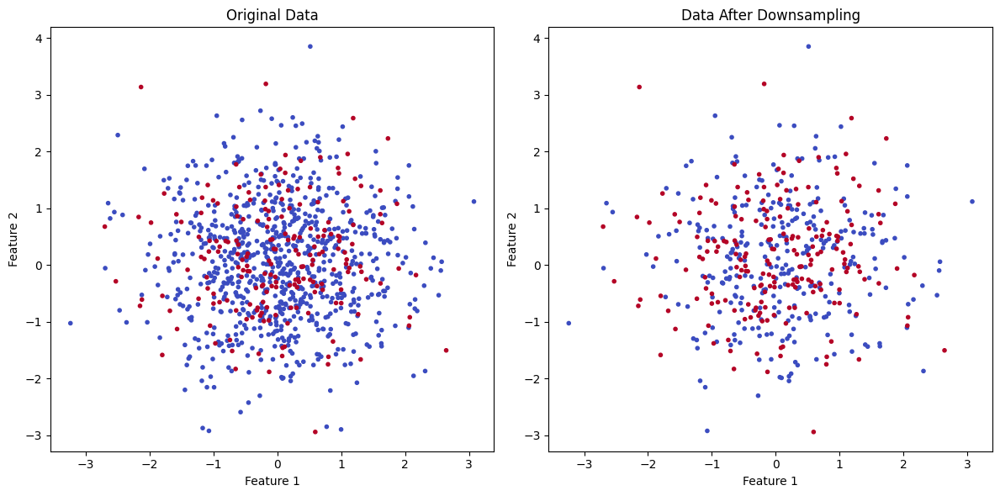

In [ ]:
# Create a synthetic dataset with imbalanced classes
np.random.seed(42)
n_samples = 1000
majority_class_size = 800
minority_class_size = 200

# Majority class (Class 0)
X_majority = np.random.randn(majority_class_size, 2)
y_majority = np.zeros(majority_class_size)

# Minority class (Class 1)
X_minority = np.random.randn(minority_class_size, 2)
y_minority = np.ones(minority_class_size)

# Combine majority and minority class into one dataset
X = np.vstack((X_majority, X_minority))
y = np.hstack((y_majority, y_minority))

# Create a DataFrame for convenience
df = pd.DataFrame(X, columns=['Feature1', 'Feature2'])
df['Target'] = y

# Show original class distribution
print("Original class distribution:", df['Target'].value_counts())

# Separate majority and minority classes
majority_class = df[df['Target'] == 0]
minority_class = df[df['Target'] == 1]

# Downsample the majority class
downsampled_majority_size = min(int(1.5 * len(minority_class)), len(majority_class))

majority_downsampled = resample(
    majority_class,
    replace=False,  # No replacement
    n_samples=downsampled_majority_size,  # Downsample size
    random_state=42
)

# Combine the downsampled majority class with the minority class
downsampled_data = pd.concat([majority_downsampled, minority_class])

# Show new class distribution
print("New class distribution after downsampling:", downsampled_data['Target'].value_counts())

# Plot the data before and after downsampling
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot original data
axes[0].scatter(df['Feature1'], df['Feature2'], c=df['Target'], cmap='coolwarm', marker='.')
axes[0].set_title("Original Data")
axes[0].set_xlabel("Feature 1")
axes[0].set_ylabel("Feature 2")

# Plot downsampled data
axes[1].scatter(downsampled_data['Feature1'], downsampled_data['Feature2'], c=downsampled_data['Target'], cmap='coolwarm', marker='.')
axes[1].set_title("Data After Downsampling")
axes[1].set_xlabel("Feature 1")
axes[1].set_ylabel("Feature 2")

plt.tight_layout()
plt.show()



*   Original Distribution: The original dataset will have a 4:1 ratio (80% majority and 20% minority).
*   New Distribution: After downsampling, the dataset will have a more balanced distribution, closer to 50:50.

## XGBoost on Raw Data

### Import data

In [ ]:
anhphanmancity_eeg_data_path = kagglehub.dataset_download('anhphanmancity/eeg-data')

print('Data source import complete.')

100%|██████████| 867M/867M [00:13<00:00, 66.0MB/s]

Extracting files...


Data source import complete.


In [ ]:
!ls $anhphanmancity_eeg_data_path

subject_10.csv	subject_14.csv	subject_20.csv	subject_26.csv	subject_32.csv	subject_4.csv
subject_11.csv	subject_17.csv	subject_21.csv	subject_27.csv	subject_33.csv	subject_5.csv
subject_12.csv	subject_18.csv	subject_24.csv	subject_28.csv	subject_34.csv	subject_6.csv
subject_13.csv	subject_19.csv	subject_25.csv	subject_31.csv	subject_3.csv	subject_7.csv


In [ ]:
# Path to your directory (set your path here)
directory_path = anhphanmancity_eeg_data_path

# Use glob to get all CSV files in the directory
file_paths = glob.glob(f"{directory_path}/*.csv")

### Define necessary functions

In [ ]:
# Sliding window function
def sliding_window(data, label):
    X = pd.DataFrame()
    y = pd.DataFrame()
    data = data.drop('state', axis=1)
    for channel in data.columns:
        rolling = data[channel].rolling(20).mean()
        X[channel] = rolling
    X = X.dropna()
    y = label[:len(X)].reset_index(drop=True)
    return X, y

In [ ]:
# Process sliding window
def process_sliding_window(dataset, sliding_window):
    X = pd.DataFrame()
    y = pd.DataFrame()
    start = 0
    mapping = {1: 0, 2: 1, 0: 2}
    dataset['state'] = dataset['state'].map(mapping)
    dataset = dataset.drop(['AF3', 'AF4'], axis=1, errors='ignore')  # Handle missing columns
    for state in dataset['state'].unique():
        end = start + np.sum(dataset['state'] == state)
        X_label, y_label = sliding_window(dataset[start:end], dataset['state'][start:end])
        X = pd.concat([X, X_label], ignore_index=True)
        y = pd.concat([y, y_label], ignore_index=True)
        start = end
    return X, y

In [ ]:
# Sampling function
def sampling_data(data):
    stratified_sample = data.groupby('state', group_keys=False, dropna=False).apply(
        lambda x: x.sample(frac=0.01, random_state=42)
    )
    return stratified_sample.reset_index(drop=True)

### Store data

In [ ]:
# Initialize empty DataFrames to store processed data
X = pd.DataFrame()
y = pd.DataFrame()

In [ ]:
# Process all files using the Colab-compatible approach
for path in file_paths:
    data = pd.read_csv(path)  # Read each CSV file
    stratified_sample = sampling_data(data)  # Apply sampling
    X_sample, y_sample = process_sliding_window(stratified_sample, sliding_window)  # Apply sliding window
    X = pd.concat([X, X_sample], ignore_index=True)
    y = pd.concat([y, y_sample], ignore_index=True)

<ipython-input-9-2e69d3fd6fdc>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stratified_sample = data.groupby('state', group_keys=False, dropna=False).apply(
<ipython-input-9-2e69d3fd6fdc>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stratified_sample = data.groupby('state', group_keys=False, dropna=False).apply(
<ipython-input-9-2e69d3fd6fdc>:3: DeprecationWarning: DataFrameGroupBy.apply operated on

In [ ]:
# Features and target extraction for the final processed data
final_X = X  # Features
final_y = y  # Target variable

In [ ]:
# Display results
print("Processed Features (X):")
print(final_X.head())

print("\nProcessed Target (y):")
print(final_y.head())

Processed Features (X):
             F7             F3            FC5            T7            P7  \
0  8.822099e+05  456212.333851  195762.930370  4.089811e+05  3.260532e+06   
1  6.954385e+05  431423.136666  192309.335865  4.785997e+05  2.821032e+06   
2  5.102635e+05  190011.879361   38896.913425  9.028818e+05  2.615484e+06   
3  1.051151e+06  125405.141150 -175098.503486  1.112547e+06  1.685674e+06   
4  1.031279e+06 -337467.642642 -626222.325498  1.010744e+06  8.807240e+05   

             O1            O2            P8             T8            FC6  \
0  3.943551e+06  4.498052e+05 -2.511906e+06 -562033.977549  400889.038206   
1  3.301278e+06  1.478284e+05 -2.302999e+06 -496878.413468  286890.912383   
2  2.612377e+06 -8.556301e+04 -2.088083e+06 -238017.894988  436741.363242   
3  1.748125e+06 -8.002119e+05 -2.641484e+06 -470689.135677  327097.069347   
4  1.390886e+06 -1.702554e+06 -3.148507e+06 -695290.881784  112188.411783   

              F4            F8  
0 -245108.986092 

In [ ]:
print(X.shape, y.shape)

(68043, 12) (68043, 1)


### Basic information about data

In [ ]:
# Ensure y is a single-column DataFrame and convert it to a Series
if isinstance(y, pd.DataFrame) and y.shape[1] == 1:
    y = pd.Series(y.iloc[:, 0].values, name='state')  # Extract the first column as a Series
elif not isinstance(y, pd.Series):
    y = pd.Series(y, name='state')  # Convert to Series if it's not already one
else:
    y = y.rename('state')  # Rename if it's already a Series

# Combine X and y into a single DataFrame
combined_data = pd.concat([X, y], axis=1)

In [ ]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68043 entries, 0 to 68042
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   F7      68043 non-null  float64
 1   F3      68043 non-null  float64
 2   FC5     68043 non-null  float64
 3   T7      68043 non-null  float64
 4   P7      68043 non-null  float64
 5   O1      68043 non-null  float64
 6   O2      68043 non-null  float64
 7   P8      68043 non-null  float64
 8   T8      68043 non-null  float64
 9   FC6     68043 non-null  float64
 10  F4      68043 non-null  float64
 11  F8      68043 non-null  float64
 12  state   68043 non-null  float64
dtypes: float64(13)
memory usage: 6.7 MB


In [ ]:
combined_data.head()

,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,state
0,8.822099e+05,456212.333851,195762.930370,4.089811e+05,3.260532e+06,3.943551e+06,4.498052e+05,-2.511906e+06,-562033.977549,400889.038206,-245108.986092,-45004.648002,2.0
1,6.954385e+05,431423.136666,192309.335865,4.785997e+05,2.821032e+06,3.301278e+06,1.478284e+05,-2.302999e+06,-496878.413468,286890.912383,-310149.239314,-78541.640607,2.0
2,5.102635e+05,190011.879361,38896.913425,9.028818e+05,2.615484e+06,2.612377e+06,-8.556301e+04,-2.088083e+06,-238017.894988,436741.363242,-440647.973144,-13917.719627,2.0
3,1.051151e+06,125405.141150,-175098.503486,1.112547e+06,1.685674e+06,1.748125e+06,-8.002119e+05,-2.641484e+06,-470689.135677,327097.069347,-419480.652782,-585.783887,2.0
4,1.031279e+06,-337467.642642,-626222.325498,1.010744e+06,8.807240e+05,1.390886e+06,-1.702554e+06,-3.148507e+06,-695290.881784,112188.411783,-282833.509023,-23312.416921,2.0


In [ ]:
combined_data.describe()

,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,state
count,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,6.804300e+04,68043.000000
mean,2.381873e+04,-2.146757e+04,3.145085e+03,1.521646e+04,-3.598779e+03,6.151961e+04,5.486314e+04,-1.735498e+04,-1.434843e+03,9.904996e+03,-6.035575e+02,-3.191649e+03,1.208251
std,1.526615e+06,1.094197e+06,4.573696e+05,5.303628e+05,2.080027e+06,3.201071e+06,3.081966e+06,2.285712e+06,5.327573e+05,5.043806e+05,3.614190e+05,3.832895e+05,0.832625
min,-1.268858e+07,-7.015482e+06,-4.799467e+06,-5.631211e+06,-1.238903e+07,-1.806526e+07,-1.452194e+07,-1.327686e+07,-3.333463e+06,-5.510886e+06,-2.247826e+06,-3.430706e+06,0.000000
25%,-7.534147e+05,-5.700151e+05,-2.181610e+05,-2.314854e+05,-1.194815e+06,-1.822373e+06,-1.689310e+06,-1.311096e+06,-2.876816e+05,-1.510604e+05,-1.828343e+05,-1.826465e+05,0.000000
50%,2.327051e+04,-1.787282e+04,5.258504e+03,9.621510e+03,-1.355144e+04,-1.016784e+03,-5.959936e+03,-2.005017e+04,-1.350774e+04,1.731428e+03,-4.849292e+02,2.329826e+03,1.000000
75%,8.297868e+05,5.266135e+05,2.309434e+05,2.542224e+05,1.176211e+06,1.909148e+06,1.746632e+06,1.274088e+06,2.783373e+05,1.620728e+05,1.798095e+05,1.828407e+05,2.000000
max,9.076918e+06,1.650307e+07,3.685124e+06,5.379802e+06,1.719183e+07,2.404136e+07,2.288852e+07,1.512509e+07,4.007266e+06,6.673451e+06,4.891215e+06,3.107037e+06,2.000000


### Apply downsampling and SMOTE for balancing data

#### Downsampling

In [ ]:
# Separate majority and minority classes
majority_class = combined_data[combined_data['state'] == 0.0]
minority_classes = combined_data[combined_data['state'] != 0.0]

# Determine 1.5x the largest minority class size
largest_minority_class_size = minority_classes['state'].value_counts().max()

# Ensure downsample size is not larger than available majority class size
downsampled_majority_size = min(int(1.5 * largest_minority_class_size), len(majority_class))

# Downsample the majority class
majority_downsampled = resample(
    majority_class,
    replace=False,  # Sampling without replacement
    n_samples=downsampled_majority_size,
    random_state=42
)

# Combine the downsampled majority class with minority classes
downsampled_data = pd.concat([majority_downsampled, minority_classes])

# Split features and target again
X_downsampled = downsampled_data.drop(columns=['state'])
y_downsampled = downsampled_data['state']

# Print class distribution after downsampling
print("Class distribution after downsampling:", Counter(y_downsampled))

Class distribution after downsampling: Counter({2.0: 32146, 0.0: 17976, 1.0: 17921})


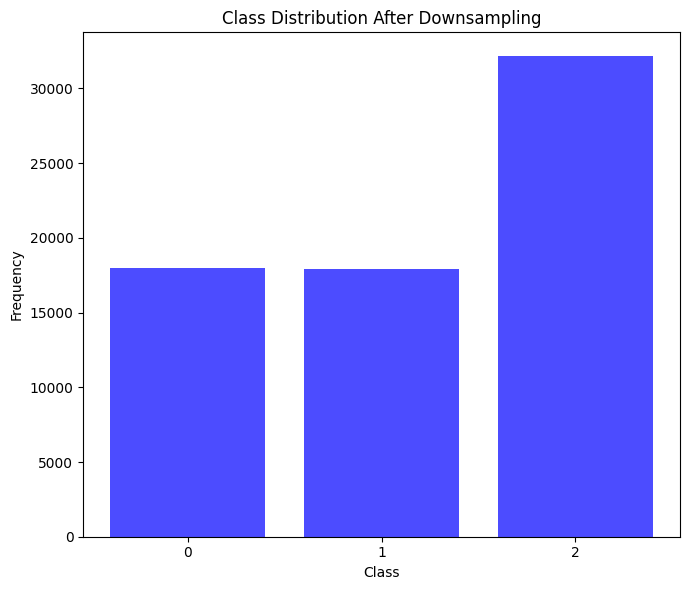

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

# Class distribution after downsampling
class_dist_downsampling = Counter({2.0: 32146, 0.0: 17976, 1.0: 17921})

# Plot the histogram for class distribution after downsampling
plt.figure(figsize=(7, 6))
plt.bar(class_dist_downsampling.keys(), class_dist_downsampling.values(), color='blue', alpha=0.7)
plt.title('Class Distribution After Downsampling')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(list(class_dist_downsampling.keys()))
plt.tight_layout()
plt.show()


#### SMOTE

In [ ]:
# Apply SMOTE on the downsampled dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_downsampled, y_downsampled)

# Print class distribution after SMOTE
print("Class distribution after SMOTE:", Counter(y_resampled))

Class distribution after SMOTE: Counter({0.0: 32146, 2.0: 32146, 1.0: 32146})


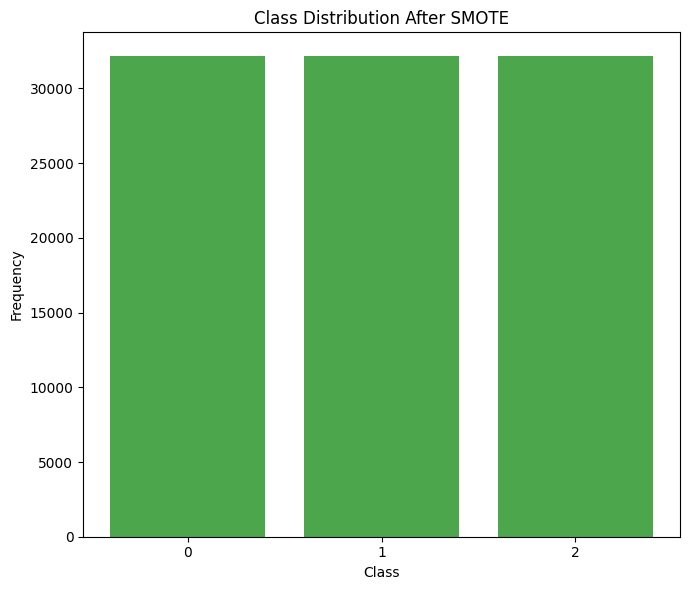

In [ ]:
# Class distribution after applying SMOTE
class_dist_smote = Counter({0.0: 32146, 2.0: 32146, 1.0: 32146})

# Plot the histogram for class distribution after SMOTE
plt.figure(figsize=(7, 6))
plt.bar(class_dist_smote.keys(), class_dist_smote.values(), color='green', alpha=0.7)
plt.title('Class Distribution After SMOTE')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(list(class_dist_smote.keys()))
plt.tight_layout()
plt.show()

In [ ]:
# Combine resampled features and target into a single DataFrame if needed
resampled_data = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled, columns=['state'])], axis=1)

# Print the final resampled data
print(resampled_data.head())

             F7            F3            FC5            T7            P7  \
0 -1.114944e+06  7.800167e+05 -119470.564770 -1.812373e+05  1.688520e+05   
1 -3.690410e+05 -4.306844e+05 -138768.976028  1.679965e+05 -2.370645e+06   
2 -4.951554e+05 -3.720053e+05  403964.448126  1.113711e+06  1.988450e+05   
3  2.169985e+06  7.675395e+05  469961.191414 -1.024831e+05 -1.575372e+06   
4  1.117321e+06 -1.139467e+06   -9636.484402  1.441366e+05 -2.423259e+06   

             O1            O2            P8             T8            FC6  \
0  2.291015e+06  7.860301e+05  2.652605e+06  398476.346944  -37078.903761   
1 -3.642295e+06 -4.586840e+06 -1.590212e+06 -155833.858753   72554.795117   
2 -2.349653e+06 -3.585945e+06 -5.348533e+05  -54250.236226 -138489.796909   
3 -1.222349e+06  1.227791e+06  1.668138e+06    -801.760126  132736.842244   
4 -4.486034e+06 -4.985442e+06 -3.092697e+06 -280862.708821   38388.405334   

              F4             F8  state  
0 -294435.415670 -437474.233506    0.0 

### Split data

In [ ]:
# Split into 80% training/validation and 20% test based on 'state'
train_val, test = train_test_split(
    resampled_data, test_size=0.2, stratify=resampled_data['state'], random_state=42
)

# Further split training/validation into 80% training and 20% validation
train, val = train_test_split(
    train_val, test_size=0.2, stratify=train_val['state'], random_state=42
)

# Verify the splits
train_percentage = len(train) / len(resampled_data) * 100
val_percentage = len(val) / len(resampled_data) * 100
test_percentage = len(test) / len(resampled_data) * 100

print(f"Train: {len(train)} ({train_percentage:.2f}%)")
print(f"Validation: {len(val)} ({val_percentage:.2f}%)")
print(f"Test: {len(test)} ({test_percentage:.2f}%)")

Train: 61720 (64.00%)
Validation: 15430 (16.00%)
Test: 19288 (20.00%)


In [ ]:
# Prepare Features and Target
X_train = train.drop(columns=['state'])
y_train = train['state']

X_val = val.drop(columns=['state'])
y_val = val['state']

X_test = test.drop(columns=['state'])
y_test = test['state']

### Train model

The following model is configured for robust multi-class classification with mechanisms to prevent overfitting (`subsample`, `colsample_bytree`, `early_stopping_rounds`), while ensuring sufficient flexibility to learn from the data (`learning_rate`, `max_depth`). The high `n_estimators` ensures adequate boosting rounds, with early stopping to halt training when the performance plateaus.

In [ ]:
# Define the XGBoost model
model = XGBClassifier(
    objective="multi:softmax",  # Objective function for multi-class classification
    num_class=data['state'].nunique(),  # Number of unique classes in the target
    learning_rate=0.05,         # Learning rate for gradient boosting
    n_estimators=3000,          # Maximum number of boosting iterations
    max_depth=4,                # Maximum depth of each tree
    subsample=0.8,              # Fraction of samples used for training each tree
    colsample_bytree=0.8,       # Fraction of features used for training each tree
    early_stopping_rounds=100,  # Stops training if validation score doesn't improve
    random_state=42,            # For reproducibility
    verbosity=1                 # Controls the level of output during training
)

**General Parameters**

- **`objective="multi:softmax"`**:
  - Specifies the task the model is solving.
  - `"multi:softmax"` means the model will perform multi-class classification and output the predicted class directly (as opposed to probabilities).
  
- **`num_class=data['state'].nunique()`**:
  - Specifies the number of unique classes in the target variable (`data['state']`).
  - This is required for multi-class classification.

- **`random_state=42`**:
  - Sets a seed for random number generation, ensuring reproducibility of results.
  - Using the same seed will always yield the same results.

- **`verbosity=1`**:
  - Controls the level of logs printed during training.
  - `0` = silent, `1` = shows progress, `2` = shows detailed logs.

**Optimization Parameters**

- **`learning_rate=0.05`**:
  - Step size for updating model weights during optimization.
  - A smaller learning rate makes training slower but can improve performance by preventing the model from overshooting the optimal solution.

- **`n_estimators=3000`**:
  - Maximum number of boosting rounds (trees) the model will train.
  - The actual number of iterations may be less if `early_stopping_rounds` is triggered.

**Tree Parameters**

- **`max_depth=4`**:
  - Maximum depth of each decision tree.
  - Controls model complexity and prevents overfitting.
  - Smaller values reduce overfitting but may underfit; larger values increase complexity.

- **`subsample=0.8`**:
  - Fraction of the training data used for each boosting iteration.
  - Helps prevent overfitting by introducing randomness (only 80% of the data is used in each tree).

- **`colsample_bytree=0.8`**:
  - Fraction of features (columns) used for each tree.
  - Adds randomness by using only 80% of features during training.

**Early Stopping**

- **`early_stopping_rounds=100`**:
  - Stops training if the validation score doesn’t improve for 100 consecutive rounds.
  - Prevents overfitting and saves computational resources.

In [ ]:
# Train the model
model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_val, y_val)],  # Training and validation sets
    verbose=50  # Log progress every 50 rounds
)

[0]	validation_0-mlogloss:1.09654	validation_1-mlogloss:1.09668
[50]	validation_0-mlogloss:1.04025	validation_1-mlogloss:1.04498
[100]	validation_0-mlogloss:1.01117	validation_1-mlogloss:1.01976
[150]	validation_0-mlogloss:0.98995	validation_1-mlogloss:1.00194
[200]	validation_0-mlogloss:0.97117	validation_1-mlogloss:0.98632
[250]	validation_0-mlogloss:0.95451	validation_1-mlogloss:0.97264
[300]	validation_0-mlogloss:0.93890	validation_1-mlogloss:0.96030
[350]	validation_0-mlogloss:0.92534	validation_1-mlogloss:0.94995
[400]	validation_0-mlogloss:0.91197	validation_1-mlogloss:0.93991
[450]	validation_0-mlogloss:0.89951	validation_1-mlogloss:0.93039
[500]	validation_0-mlogloss:0.88755	validation_1-mlogloss:0.92140
[550]	validation_0-mlogloss:0.87567	validation_1-mlogloss:0.91272
[600]	validation_0-mlogloss:0.86428	validation_1-mlogloss:0.90404
[650]	validation_0-mlogloss:0.85357	validation_1-mlogloss:0.89625
[700]	validation_0-mlogloss:0.84366	validation_1-mlogloss:0.88902
[750]	validat

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=100,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=3000, n_jobs=None, num_class=3,
              num_parallel_tree=None, ...)

The reported values (e.g., validation_0-mlogloss and validation_1-mlogloss) correspond to the multi-class logarithmic loss (log-loss): validation_0 refers to the training data performance, while validation_1 refers to the validation data performance.

Log-loss measures the model's uncertainty in predictions. Lower values indicate better performance. It penalizes incorrect predictions more severely when the model is confident about the wrong class.

Loss Trends

*   Training Loss (validation_0-mlogloss):

The training loss steadily decreases as the model continues to learn from the data. This shows that the model is capturing patterns in the training dataset effectively.

*   Validation Loss (validation_1-mlogloss):

The validation loss decreases initially and closely tracks the training loss.

As training progresses, validation loss also continues to decrease without divergence, which suggests no significant overfitting.

Key Observations

Validation loss (0.70741) at the final iteration is slightly higher than the training loss (0.57065). This is a good sign because:

- It indicates the model hasn't overfit to the training data.
- A slight gap between training and validation loss is expected.

The consistent decline in validation loss shows the model effectively learns patterns in the validation set, suggesting a well-generalized model.

### Model evaluation

In [ ]:
# Evaluate the model
# Validation
y_val_pred = model.predict(X_val)  # Predict classes for validation data
val_accuracy = accuracy_score(y_val, y_val_pred)  # Calculate accuracy
print(f"Validation Accuracy: {val_accuracy:.2f}")

# Test
y_test_pred = model.predict(X_test)  # Predict classes for test data
test_accuracy = accuracy_score(y_test, y_test_pred)  # Calculate accuracy
print(f"Test Accuracy: {test_accuracy:.2f}")

Validation Accuracy: 0.71
Test Accuracy: 0.71


In [ ]:
# Predict probabilities
y_hat = model.predict_proba(X_test)  # Predict probabilities for each class

# Convert probabilities to class labels
y_hat_classes = np.argmax(y_hat, axis=1)

# One-hot encode the labels for AUC calculation
n_classes = y_hat.shape[1]  # Number of classes
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))

# Calculate AUC (OvR strategy)
auc_scores = roc_auc_score(y_test_one_hot, y_hat, average=None, multi_class='ovr')
macro_auc = roc_auc_score(y_test_one_hot, y_hat, average='macro', multi_class='ovr')

# Print evaluation metrics
print('Evaluation on test set:')
print(classification_report(y_test, y_hat_classes))
print(f'Class-wise AUC scores: {auc_scores}')
print(f'Macro-average AUC: {macro_auc}')

Evaluation on test set:
              precision    recall  f1-score   support

         0.0       0.72      0.74      0.73      6429
         1.0       0.70      0.73      0.72      6429
         2.0       0.70      0.66      0.68      6430

    accuracy                           0.71     19288
   macro avg       0.71      0.71      0.71     19288
weighted avg       0.71      0.71      0.71     19288

Class-wise AUC scores: [0.88997282 0.88548192 0.85797797]
Macro-average AUC: 0.8778109002682642


Metrics Explained:
1. **Precision**:
   - The ratio of true positive predictions to the total predicted positives (true positives + false positives).
   - A high precision indicates fewer false positives.

2. **Recall**:
   - The ratio of true positives to the total actual positives (true positives + false negatives).
   - A high recall indicates fewer false negatives.

3. **F1-Score**:
   - The harmonic mean of precision and recall.
   - Balances precision and recall and is particularly useful when the dataset is imbalanced.

4. **Support**:
   - The number of actual occurrences of each class in the dataset.

5. **Accuracy**:
   - The proportion of correctly predicted instances out of the total instances.

6. **Macro Average**:
   - An unweighted average across all classes for precision, recall, and F1-score.
   - Treats all classes equally, regardless of support.

7. **Weighted Average**:
   - A weighted average of precision, recall, and F1-score, taking into account the support of each class.

8. **Class-wise AUC Scores**:
   - The Area Under the Curve (AUC) score for each class, showing how well the model separates positive and negative instances for that specific class.

9. **Macro-average AUC**:
   - The average of the AUC scores for all classes, treating each class equally.


Details in Your Table:

- **Class-specific metrics (0.0, 1.0, 2.0)**:
   - **Class 0.0**: Precision = 0.72, Recall = 0.74, F1-score = 0.73
   - **Class 1.0**: Precision = 0.70, Recall = 0.73, F1-score = 0.72
   - **Class 2.0**: Precision = 0.70, Recall = 0.66, F1-score = 0.68

- **Overall Performance**:
   - **Accuracy**: 71% of predictions are correct.
   - **Macro Average**: Precision, Recall, and F1-score are all around 0.71, treating all classes equally.
   - **Weighted Average**: Similar to macro average but accounts for class imbalances (weights based on support).

- **AUC Scores**:
   - Class-wise AUC scores are relatively high (0.8899, 0.8855, 0.8579), showing good separation capability.
   - Macro-average AUC: 0.8778 indicates strong overall performance.


Observations:
1. The model performs relatively well across all three classes, with precision, recall, and F1-scores close to 0.7.
2. Class 2.0 has the lowest recall (0.66) and F1-score (0.68), indicating potential room for improvement in identifying instances of this class.
3. The AUC scores suggest the model performs well in distinguishing classes.

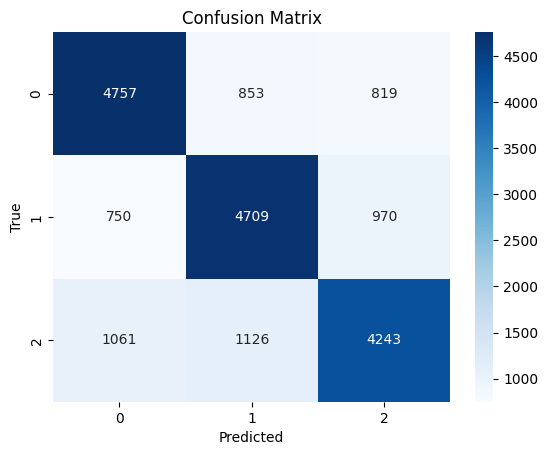

Macro-average F1 Score: 0.710321570416613


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_hat_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(n_classes), yticklabels=range(n_classes))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# F1 Score (Macro average)
f1_macro = f1_score(y_test, y_hat_classes, average='macro')
print(f'Macro-average F1 Score: {f1_macro}')

Key Points in the Confusion Matrix:

1. **Axes:**
   - The rows represent the **true class** labels (actual values in the test set).
   - The columns represent the **predicted class** labels (what the model predicted).

2. **Diagonal Cells:**
   - The diagonal cells (top-left to bottom-right) represent correct predictions (true positives for each class).
   - Higher values here indicate good performance for that class.

3. **Off-Diagonal Cells:**
   - The off-diagonal cells represent misclassifications:
     - For example, the cell at row 0 and column 1 (853) shows the number of samples of **class 0** that were incorrectly predicted as **class 1**.







Breakdown of the Matrix:

**Class 0 (Row 0):**
   - **True Positives**: 4757 (correctly classified as class 0).
   - **Misclassified as class 1**: 853.
   - **Misclassified as class 2**: 819.
   - The model struggles a bit with distinguishing class 0 from classes 1 and 2.

**Class 1 (Row 1):**
   - **True Positives**: 4709 (correctly classified as class 1).
   - **Misclassified as class 0**: 750.
   - **Misclassified as class 2**: 970.
   - Class 1 has relatively good performance but shows some confusion with class 2.

**Class 2 (Row 2):**
   - **True Positives**: 4243 (correctly classified as class 2).
   - **Misclassified as class 0**: 1061.
   - **Misclassified as class 1**: 1126.
   - Class 2 has the lowest true positives, indicating it is the most challenging class for the model to predict.

Macro-Average F1 Score: 0.7103
- The macro-average F1 score is provided at the bottom of the figure. This metric is the unweighted average of the F1-scores across all classes.
- A score of 0.71 aligns with the earlier evaluation, indicating the model's overall balanced but moderate performance.

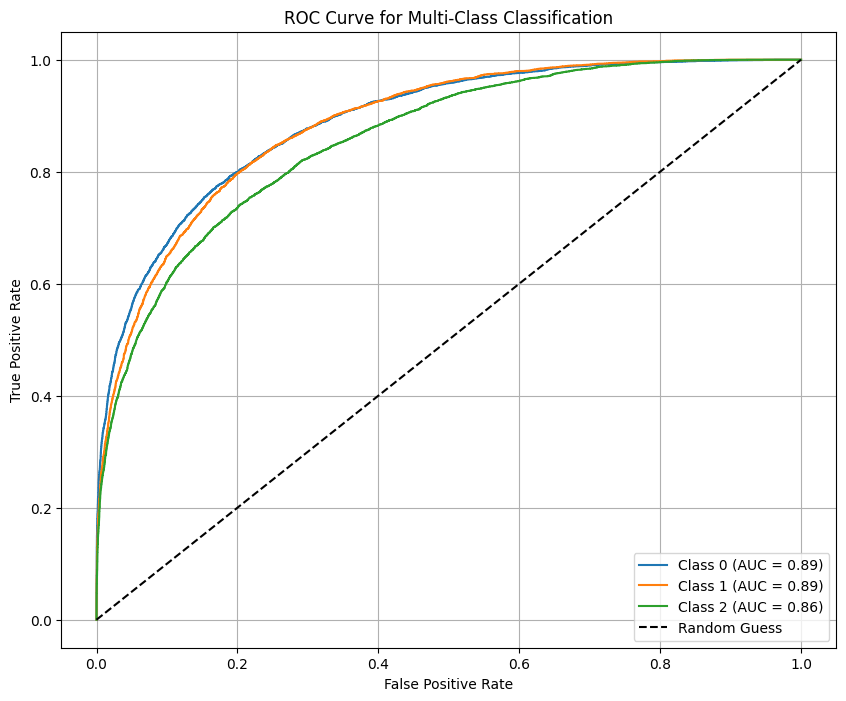

In [ ]:
# Ensure y_test_one_hot and y_hat are correctly formatted
# y_test_one_hot: One-hot encoded true labels
# y_hat: Predicted probabilities for each class

# Initialize a plot for ROC curves
plt.figure(figsize=(10, 8))

# Iterate over each class to plot its ROC curve
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat[:, i])  # Get FPR and TPR
    roc_auc = auc(fpr, tpr)  # Calculate AUC
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')  # Plot each curve

# Plot the diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')

# Add labels, title, and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid()
plt.show()

Components of the Plot:
1. **True Positive Rate (y-axis)**:
   - Also known as **sensitivity** or **recall**.
   - Represents the proportion of actual positives that are correctly identified by the model.

2. **False Positive Rate (x-axis)**:
   - Represents the proportion of actual negatives that are incorrectly classified as positives.

3. **Curves for Each Class**:
   - Each curve corresponds to the performance of the model for one specific class (using a one-vs-rest approach).
   - The curves show how the trade-off between true positives and false positives changes as the decision threshold varies.

4. **AUC (Area Under the Curve)**:
   - AUC quantifies the overall performance of the model for each class.
   - Higher AUC values (closer to 1) indicate better model performance in distinguishing between classes.
   - Here:
     - Class 0: AUC = 0.89
     - Class 1: AUC = 0.89
     - Class 2: AUC = 0.86
   - The AUC values suggest the model performs slightly worse for **class 2** compared to classes 0 and 1.

5. **Random Guess Line (dashed line)**:
   - Represents the baseline performance of a random classifier (AUC = 0.5).
   - All curves above this line indicate that the model performs better than random guessing.

Observations:
1. **Strong Model Performance**:
   - All curves are significantly above the random guess line, showing that the model has good discriminative ability for all classes.
   - AUC values of 0.89 and 0.86 indicate solid performance.

2. **Class-Specific Differences**:
   - The model performs slightly worse for **class 2** (AUC = 0.86) compared to the other two classes (AUC = 0.89 for classes 0 and 1).
   - This aligns with earlier findings from the confusion matrix, where **class 2** had more misclassifications.

3. **Balanced Performance**:
   - The curves are fairly close together, suggesting the model does not heavily favor one class over another.


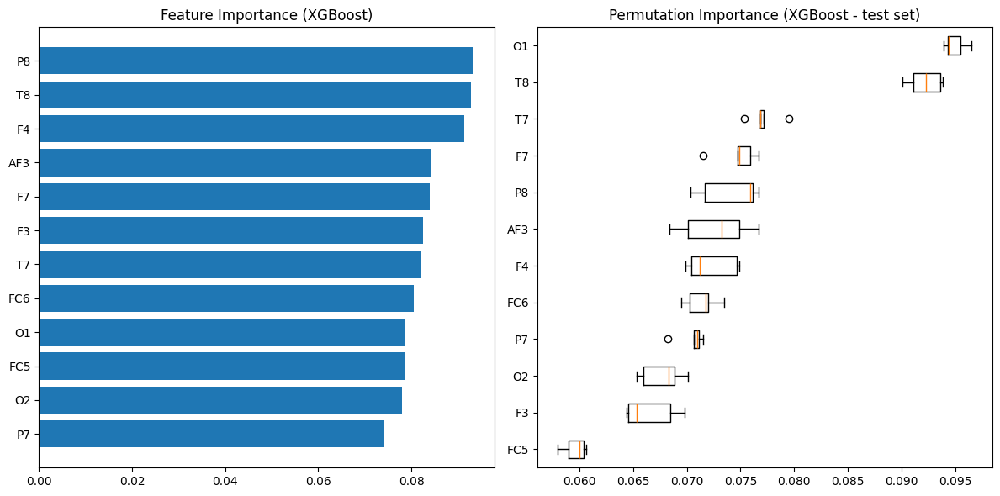

In [ ]:
fig = plt.figure(figsize=(12, 6))

# Feature Importance (using XGBoost's built-in feature importance)
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5

plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(data.columns.drop('state'))[sorted_idx])  # Replace with your feature names
plt.title("Feature Importance (XGBoost)")

# Permutation Importance
result = permutation_importance(
    model, X_test, y_test, n_repeats=5, random_state=42, n_jobs=3
)
sorted_idx = result.importances_mean.argsort()

plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(data.columns.drop('state'))[sorted_idx],  # Replace with your feature names
)
plt.title("Permutation Importance (XGBoost - test set)")

fig.tight_layout()
plt.show()

This image contains two subplots that represent feature importance for a dataset analyzed using an XGBoost model. The subplots show:

- Feature Importance (XGBoost): This is a bar chart showing the importance of features based on the XGBoost model's internal metrics (e.g., gain, split count, or weight).

- Permutation Importance (XGBoost - test set): This is a box plot illustrating the permutation importance of features on the test set, reflecting how much shuffling each feature affects the model's performance.
Left Chart: Feature Importance (XGBoost)



Left Chart: Feature Importance (XGBoost)


What it represents:

- This chart shows the relative importance of each feature as calculated by the XGBoost model during training.

Observations:

- The features P8, T8, and F4 have the highest importance, as indicated by their longer bars. These features contribute significantly to the decision-making of the model.
Features like FC5, O2, and P7 have lower importance, indicating they were less useful for the model's predictions.
Implications:

- This model relies heavily on certain features like P8 and T8, which might indicate these features are strongly correlated with the target variable.

- Less important features might be candidates for removal or reduction during feature engineering to simplify the model.

Right Chart: Permutation Importance (XGBoost - test set)

What it represents:

- This chart shows the permutation importance of features. It measures the impact on model performance when a feature's values are randomly shuffled.
The box plot indicates the distribution of importance values across multiple shuffles, capturing variability.

Observations:

- Features like O1, T8, and T7 have the highest permutation importance. These features significantly impact the model's predictive ability on the test set.

- Features like P8, AF3, and F4, while important in the training feature importance chart, have a lower permutation importance. This suggests they may not generalize as well to unseen data.

- Features such as FC5 have consistently low importance, as reflected by their low box plot position.

Implications:

High permutation importance for features like O1 and T8 implies that these features are essential for the model's performance on unseen data.
Features with high variability in the box plot (e.g., P8, T8) might have unstable contributions and could benefit from further investigation or feature transformations.

Comparison Between Charts

Key Differences:

- In the left chart, features like P8 and T8 have high importance during training but are not as prominent in the permutation importance test (right chart). This could indicate overfitting, where these features are more useful for training but less so for generalization.

- Conversely, features like O1, which have lower training importance, are highly significant on the test set. This suggests they are robust and reliable for prediction.




Conclusion
While some features like P8 are influential during training, others like O1 are more impactful for generalization. Balancing these insights can improve the model's predictive accuracy and robustness.

## XGBoost on Data with Added Features

### Import data

In [ ]:
miraikawai_fft_features_path = kagglehub.dataset_download('miraikawai/fft-features')

print('Data source import complete.')


100%|██████████| 162M/162M [00:01<00:00, 91.3MB/s]

Extracting files...


Data source import complete.


In [ ]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
!ls $miraikawai_fft_features_path

Person_1.csv  Person_2.csv  Person_3.csv  Person_4.csv	Person_5.csv


In [ ]:
# Path to your directory
directory_path = miraikawai_fft_features_path

# Use glob to get all CSV files in the directory
file_paths = glob.glob(f"{directory_path}/*.csv")

# Read and concatenate all files
data_frames = [pd.read_csv(file) for file in file_paths]
data = pd.concat(data_frames, ignore_index=True)

### Basic information about data

In [ ]:
# Display the combined DataFrame
print(data)

       Unnamed: 0      F7_alpha       F7_beta      F7_theta      F7_delta  \
0               0  2.019564e+06  6.240262e+06  9.766144e+05  3.517040e+06   
1               1  2.492632e+06  5.460677e+06  1.232390e+06  2.950267e+06   
2               2  1.988606e+06  5.203172e+06  8.243734e+05  1.262590e+06   
3               3  2.060999e+06  4.743702e+06  2.403329e+06  2.835741e+06   
4               4  4.443342e+06  4.493957e+06  1.502904e+06  3.938372e+06   
...           ...           ...           ...           ...           ...   
77013       14968  2.238678e+06  5.404367e+06  3.436808e+06  3.143167e+06   
77014       14969  3.717173e+06  5.929175e+06  1.385599e+06  1.182567e+06   
77015       14970  3.937617e+06  5.371593e+06  4.939543e+06  5.759510e+06   
77016       14971  2.914715e+06  6.227182e+06  5.305246e+06  2.871356e+06   
77017       14972  1.602605e+06  5.310265e+06  1.280913e+06  4.400732e+06   

            F7_mean   F7_variance        F7_std     F7_energy  F7_skewness 

In [ ]:
# Remove "Unnamed" column
data = data.loc[:, ~data.columns.str.contains('^Unnamed')]

In [ ]:
print(data)

           F7_alpha       F7_beta      F7_theta      F7_delta       F7_mean  \
0      2.019564e+06  6.240262e+06  9.766144e+05  3.517040e+06 -1.439607e+06   
1      2.492632e+06  5.460677e+06  1.232390e+06  2.950267e+06 -8.494304e+04   
2      1.988606e+06  5.203172e+06  8.243734e+05  1.262590e+06 -1.017136e+06   
3      2.060999e+06  4.743702e+06  2.403329e+06  2.835741e+06  1.126675e+06   
4      4.443342e+06  4.493957e+06  1.502904e+06  3.938372e+06  1.715669e+06   
...             ...           ...           ...           ...           ...   
77013  2.238678e+06  5.404367e+06  3.436808e+06  3.143167e+06  1.684380e+05   
77014  3.717173e+06  5.929175e+06  1.385599e+06  1.182567e+06 -1.651016e+06   
77015  3.937617e+06  5.371593e+06  4.939543e+06  5.759510e+06  2.203437e+05   
77016  2.914715e+06  6.227182e+06  5.305246e+06  2.871356e+06  3.999747e+02   
77017  1.602605e+06  5.310265e+06  1.280913e+06  4.400732e+06 -3.367641e+05   

        F7_variance        F7_std     F7_energy  F7

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77018 entries, 0 to 77017
Columns: 241 entries, F7_alpha to state
dtypes: float64(240), int64(1)
memory usage: 141.6 MB


In [ ]:
data.head()

,F7_alpha,F7_beta,F7_theta,F7_delta,F7_mean,F7_variance,F7_std,F7_energy,F7_skewness,F7_kurtosis,...,F8_entropy,F8_cwt_scale_1,F8_cwt_scale_2,F8_cwt_scale_3,F8_cwt_scale_4,F8_cwt_scale_5,F8_cwt_scale_6,F8_cwt_scale_7,F8_cwt_scale_8,state
0,2.019564e+06,6.240262e+06,9.766144e+05,3.517040e+06,-1.439607e+06,2.889108e+13,5.375043e+06,3.963335e+15,0.116025,-0.825722,...,4.969311,240315.382290,386986.545991,9.844163e+05,1.298300e+06,1.288017e+06,1.450194e+06,1.363207e+06,1.378921e+06,0
1,2.492632e+06,5.460677e+06,1.232390e+06,2.950267e+06,-8.494304e+04,2.146412e+13,4.632939e+06,2.748331e+15,-0.139809,-0.354622,...,4.775157,263594.351746,397955.708838,1.153358e+06,1.145545e+06,1.297568e+06,1.290384e+06,1.508681e+06,1.696827e+06,0
2,1.988606e+06,5.203172e+06,8.243734e+05,1.262590e+06,-1.017136e+06,1.232204e+13,3.510276e+06,1.709645e+15,-0.448870,0.184537,...,4.806995,205688.349496,312558.246240,9.096787e+05,8.722772e+05,8.605585e+05,1.115224e+06,1.253758e+06,1.366726e+06,0
3,2.060999e+06,4.743702e+06,2.403329e+06,2.835741e+06,1.126675e+06,2.630131e+13,5.128481e+06,3.529051e+15,0.537868,0.515378,...,4.643967,316885.857417,416438.633404,1.402061e+06,1.273365e+06,1.357673e+06,1.902725e+06,2.067492e+06,1.875586e+06,0
4,4.443342e+06,4.493957e+06,1.502904e+06,3.938372e+06,1.715669e+06,3.512644e+13,5.926756e+06,4.872954e+15,0.253685,-0.197599,...,4.698355,513120.233843,643280.376992,2.314447e+06,1.984203e+06,1.892672e+06,2.337084e+06,2.426204e+06,1.894639e+06,0


In [ ]:
data.describe()

,F7_alpha,F7_beta,F7_theta,F7_delta,F7_mean,F7_variance,F7_std,F7_energy,F7_skewness,F7_kurtosis,...,F8_entropy,F8_cwt_scale_1,F8_cwt_scale_2,F8_cwt_scale_3,F8_cwt_scale_4,F8_cwt_scale_5,F8_cwt_scale_6,F8_cwt_scale_7,F8_cwt_scale_8,state
count,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,77018.000000,77018.000000,...,77018.000000,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,7.701800e+04,77018.000000
mean,3.130376e+06,4.126713e+06,1.902193e+06,3.664366e+06,4.631611e+03,4.323082e+13,5.480282e+06,5.933064e+15,-0.000162,-0.017329,...,4.480602,2.058211e+05,2.883451e+05,8.799804e+05,8.589441e+05,8.628582e+05,9.298303e+05,9.973613e+05,1.058593e+06,1.204303
std,2.665308e+06,2.031076e+06,1.389352e+06,3.087878e+06,1.766708e+06,1.140553e+14,3.632837e+06,1.639113e+16,0.441958,0.953677,...,0.679233,1.677366e+05,2.264797e+05,7.066955e+05,7.258388e+05,7.669720e+05,8.436616e+05,9.154047e+05,9.965579e+05,0.832805
min,5.266921e+04,1.561527e+05,2.478606e+04,2.607709e+04,-7.083209e+07,2.160840e+10,1.469980e+05,3.260470e+12,-3.942779,-1.721161,...,0.369057,2.009184e+02,2.185382e+02,8.022299e+02,7.675600e+02,1.061793e+03,1.113637e+03,9.406657e+02,1.045125e+03,0.000000
25%,1.394938e+06,2.708311e+06,9.123774e+05,1.531680e+06,-5.484963e+05,7.998678e+12,2.828193e+06,1.065234e+15,-0.237847,-0.497005,...,4.335261,6.545182e+04,9.101554e+04,2.879754e+05,2.898340e+05,2.778480e+05,3.137498e+05,3.639270e+05,4.153792e+05,0.000000
50%,2.348407e+06,4.096292e+06,1.597902e+06,2.973844e+06,-1.473236e+03,2.475397e+13,4.975336e+06,3.370056e+15,0.002983,-0.191770,...,4.745075,1.809931e+05,2.571439e+05,7.828415e+05,7.557564e+05,7.493803e+05,8.047888e+05,8.539298e+05,8.867501e+05,1.000000
75%,4.043877e+06,5.411672e+06,2.551397e+06,5.034553e+06,5.539153e+05,5.306905e+13,7.284851e+06,7.184681e+15,0.242836,0.211473,...,4.894025,3.122654e+05,4.469314e+05,1.335350e+06,1.246936e+06,1.220322e+06,1.276544e+06,1.330070e+06,1.375995e+06,2.000000
max,2.756428e+07,4.065690e+07,5.079454e+07,1.239956e+08,3.208965e+07,1.794814e+16,1.339707e+08,2.301560e+18,5.124953,34.517488,...,5.899557,2.591963e+06,3.566822e+06,1.152596e+07,1.410437e+07,1.533206e+07,1.864470e+07,1.972830e+07,2.185981e+07,2.000000


### Handle data imbalance

#### Visualize data imbalance

In [ ]:
# Group by the 'State' column and count occurrences
state_counts = data['state'].value_counts()

# Calculate percentages
state_percentages = (state_counts / len(data)) * 100

# Combine counts and percentages into a single DataFrame for easy viewing
state_distribution = pd.DataFrame({
    'Count': state_counts,
    'Percentage': state_percentages
})

# Print the distribution
print(state_distribution)

       Count  Percentage
state                   
2      36183   46.979927
0      20448   26.549638
1      20387   26.470435


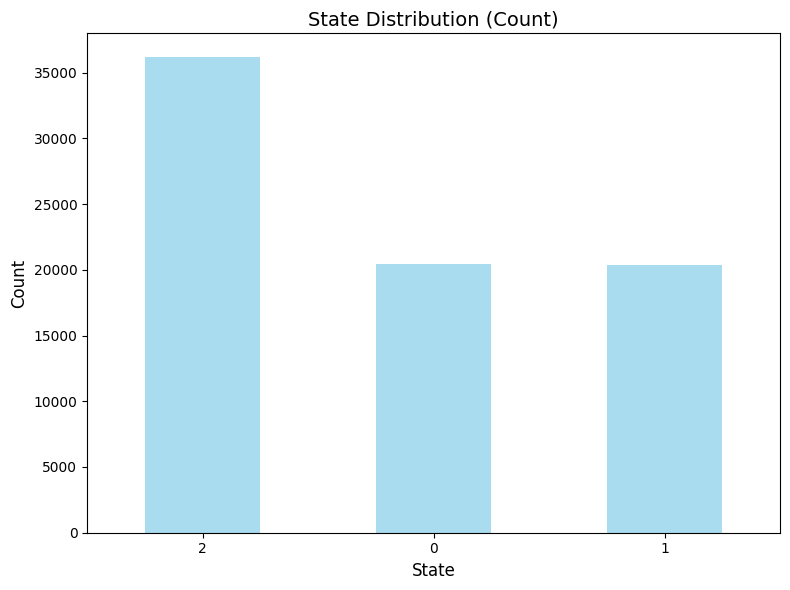

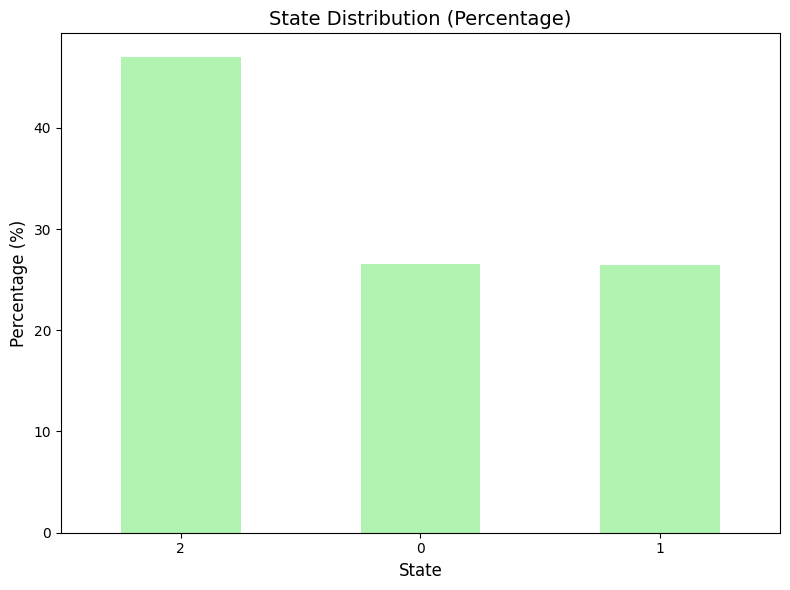

In [ ]:
# Combine counts and percentages into a single DataFrame for easy viewing
state_distribution = pd.DataFrame({
    'Count': state_counts,
    'Percentage': state_percentages
})

# Visualize the state distribution (count)
plt.figure(figsize=(8, 6))
state_counts.plot(kind='bar', color='skyblue', alpha=0.7)
plt.title('State Distribution (Count)', fontsize=14)
plt.xlabel('State', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#### Downsampling and SMOTE

In [ ]:
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd

# Features and target
X = data.drop(columns=['state'])  # Features
y = data['state']                 # Target variable

# Combine X and y into a single DataFrame for easier handling
combined_data = pd.concat([X, y], axis=1)

# Separate majority and minority classes
majority_class = combined_data[combined_data['state'] == 0]
minority_classes = combined_data[combined_data['state'] != 0]

# Determine 1.5x the largest minority class size
largest_minority_class_size = minority_classes['state'].value_counts().max()
downsampled_majority_size = int(1.5 * largest_minority_class_size)

# Determine the downsample size, ensuring it's no larger than the available majority class size
downsampled_majority_size = min(int(1.5 * largest_minority_class_size), len(majority_class))

# Downsample the majority class
majority_downsampled = resample(
    majority_class,
    replace=False,  # Sampling without replacement
    n_samples=downsampled_majority_size,
    random_state=42
)

# Combine the downsampled majority class with minority classes
downsampled_data = pd.concat([majority_downsampled, minority_classes])

# Split features and target again
X_downsampled = downsampled_data.drop(columns=['state'])
y_downsampled = downsampled_data['state']

# Print class distribution after downsampling
print("Class distribution after downsampling:", Counter(y_downsampled))

# Apply SMOTE on the downsampled dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_downsampled, y_downsampled)

# Print class distribution after SMOTE
print("Class distribution after SMOTE:", Counter(y_resampled))

# Combine resampled features and target into a single DataFrame if needed
resampled_data = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled, columns=['state'])], axis=1)


Class distribution after downsampling: Counter({2: 36183, 0: 20448, 1: 20387})
Class distribution after SMOTE: Counter({0: 36183, 1: 36183, 2: 36183})


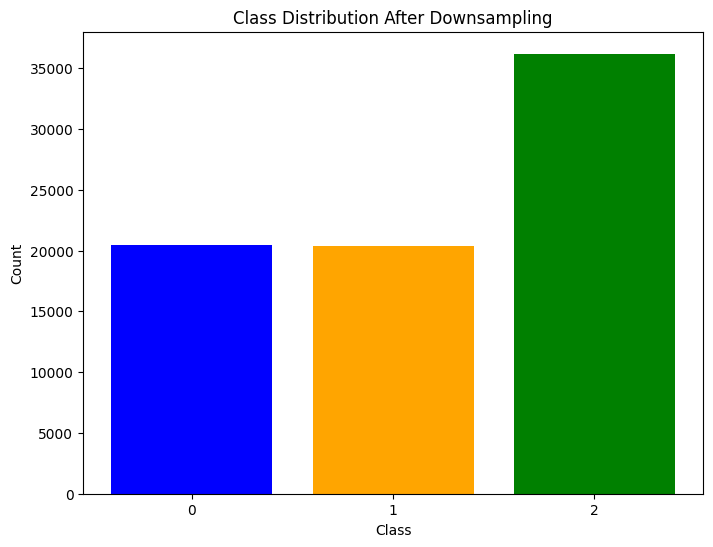

In [ ]:
# Histogram for downsampled data
plt.figure(figsize=(8, 6))
plt.bar(Counter(y_downsampled).keys(), Counter(y_downsampled).values(), color=['blue', 'orange', 'green'])
plt.title("Class Distribution After Downsampling")
plt.xlabel("Class")
plt.ylabel("Count")
plt.xticks(list(Counter(y_downsampled).keys()))
plt.show()


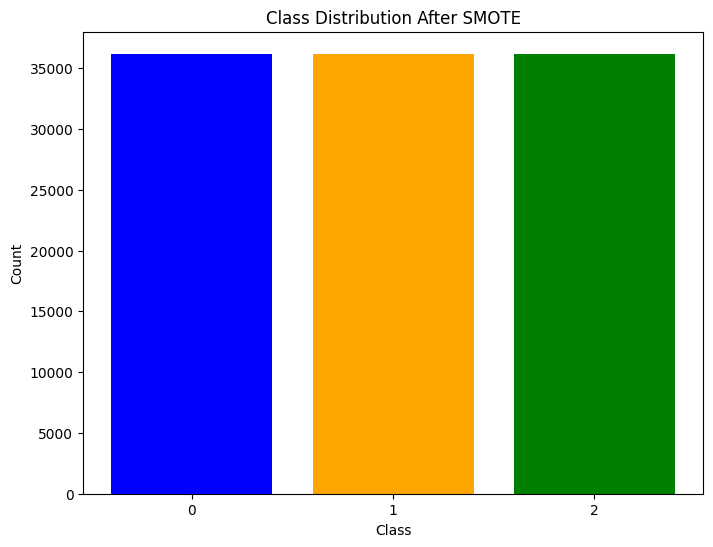

In [ ]:
# Histogram for SMOTE resampled data
plt.figure(figsize=(8, 6))
plt.bar(Counter(y_resampled).keys(), Counter(y_resampled).values(), color=['blue', 'orange', 'green'])
plt.title("Class Distribution After SMOTE")
plt.xlabel("Class")
plt.ylabel("Count")
plt.xticks(list(Counter(y_resampled).keys()))
plt.show()

### Split data

In [ ]:
# Split into 80% training/validation and 20% test based on 'state'
train_val, test = train_test_split(
    resampled_data, test_size=0.2, stratify=resampled_data['state'], random_state=42
)

# Further split training/validation into 80% training and 20% validation
train, val = train_test_split(
    train_val, test_size=0.2, stratify=train_val['state'], random_state=42
)

# Verify the splits (optional)
train_percentage = len(train) / len(resampled_data) * 100
val_percentage = len(val) / len(resampled_data) * 100
test_percentage = len(test) / len(resampled_data) * 100

print(f"Train: {len(train)} ({train_percentage:.2f}%)")
print(f"Validation: {len(val)} ({val_percentage:.2f}%)")
print(f"Test: {len(test)} ({test_percentage:.2f}%)")

Train: 69471 (64.00%)
Validation: 17368 (16.00%)
Test: 21710 (20.00%)


In [ ]:
# Prepare Features and Target
X_train = train.drop(columns=['state'])
y_train = train['state']

X_val = val.drop(columns=['state'])
y_val = val['state']

X_test = test.drop(columns=['state'])
y_test = test['state']

### Train model

Configuration for the following model is the same as the model in the previous section, except for parameter 'n_estimators' is reduced to 2000 from 3000 in order to speed up the training process on this dataset, due to the fact that it is larger than the other dataset.

In [ ]:
# Prepare Features and Target
# Define the XGBoost model
model = XGBClassifier(
    objective="multi:softmax",  # Objective function for multi-class classification
    num_class=data['state'].nunique(),  # Number of unique classes in the target
    learning_rate=0.05,         # Learning rate for gradient boosting
    n_estimators=2000,          # Maximum number of boosting iterations
    max_depth=4,                # Maximum depth of each tree
    subsample=0.8,              # Fraction of samples used for training each tree
    colsample_bytree=0.8,       # Fraction of features used for training each tree
    early_stopping_rounds=100,  # Stops training if validation score doesn't improve
    random_state=42,            # For reproducibility
    verbosity=1                 # Controls the level of output during training
)

# Train the model
model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_val, y_val)],  # Training and validation sets
    verbose=50  # Log progress every 50 rounds
)

[0]	validation_0-mlogloss:1.08553	validation_1-mlogloss:1.08569
[50]	validation_0-mlogloss:0.81781	validation_1-mlogloss:0.82255
[100]	validation_0-mlogloss:0.71986	validation_1-mlogloss:0.72998
[150]	validation_0-mlogloss:0.65608	validation_1-mlogloss:0.67163
[200]	validation_0-mlogloss:0.60962	validation_1-mlogloss:0.62999
[250]	validation_0-mlogloss:0.57063	validation_1-mlogloss:0.59530
[300]	validation_0-mlogloss:0.53871	validation_1-mlogloss:0.56702
[350]	validation_0-mlogloss:0.51232	validation_1-mlogloss:0.54458
[400]	validation_0-mlogloss:0.48871	validation_1-mlogloss:0.52500
[450]	validation_0-mlogloss:0.46763	validation_1-mlogloss:0.50756
[500]	validation_0-mlogloss:0.44809	validation_1-mlogloss:0.49153
[550]	validation_0-mlogloss:0.43179	validation_1-mlogloss:0.47847
[600]	validation_0-mlogloss:0.41498	validation_1-mlogloss:0.46508
[650]	validation_0-mlogloss:0.40066	validation_1-mlogloss:0.45375
[700]	validation_0-mlogloss:0.38710	validation_1-mlogloss:0.44328
[750]	validat

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=100,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=2000, n_jobs=None, num_class=3,
              num_parallel_tree=None, ...)

Results

1. **Starting High Log Loss**
   - At iteration 0, the log loss is around `1.08553` for training and `1.08569` for validation. This high loss at the beginning is expected as the model starts without any optimization (random initialization).

2. **Gradual Decrease in Log Loss**
   - Over the iterations, the log loss for both training and validation sets decreases significantly. For instance:
     - By iteration 100: Training loss = `0.71986`, Validation loss = `0.72998`.
     - By iteration 1000: Training loss = `0.32107`, Validation loss = `0.39406`.
     - By iteration 1999: Training loss = `0.19267`, Validation loss = `0.30692`.
   - This demonstrates the model is fitting the training data and improving on the validation set.

3. **No Early Stopping Triggered**
   - The training continued for the full 2000 iterations, implying that the validation loss kept improving (no plateau or overfitting detected).

4. **Validation Loss Higher Than Training Loss**
   - The validation loss is slightly higher than the training loss throughout the process, which is typical and expected due to the model's exposure to training data and its inability to see the validation data during training.

Analysis

1. **Improvement in Validation Loss**
   - The validation loss reduction from `1.08569` to `0.30692` shows the model learned patterns from the training data and applied them well to the validation data.

2. **Small Gap Between Training and Validation Loss**
   - The gap between training and validation loss reduces as training progresses. This suggests the model achieves better generalization, likely due to the choice of regularization parameters (e.g., subsampling and feature sampling).

3. **Key Observations**
   - The validation loss decreasing steadily indicates:
     - No early plateau or divergence (which would indicate underfitting or overfitting).
     - The dataset's features are likely informative for the target variable.
     - There may still be room for improvement in the loss values if fine-tuned hyperparameters or additional data transformations are applied.

### Model evaluation

In [ ]:
# Evaluate the model
# Validation
y_val_pred = model.predict(X_val)  # Predict classes for validation data
val_accuracy = accuracy_score(y_val, y_val_pred)  # Calculate accuracy
print(f"Validation Accuracy: {val_accuracy:.2f}")

# Test
y_test_pred = model.predict(X_test)  # Predict classes for test data
test_accuracy = accuracy_score(y_test, y_test_pred)  # Calculate accuracy
print(f"Test Accuracy: {test_accuracy:.2f}")

Validation Accuracy: 0.89
Test Accuracy: 0.89


In [ ]:
# Predict probabilities
y_hat = model.predict_proba(X_test)  # Predict probabilities for each class

# Convert probabilities to class labels
y_hat_classes = np.argmax(y_hat, axis=1)

# One-hot encode the labels for AUC calculation
n_classes = y_hat.shape[1]  # Number of classes
y_test_one_hot = label_binarize(y_test, classes=range(n_classes))

# Calculate AUC (OvR strategy)
auc_scores = roc_auc_score(y_test_one_hot, y_hat, average=None, multi_class='ovr')
macro_auc = roc_auc_score(y_test_one_hot, y_hat, average='macro', multi_class='ovr')

# Print evaluation metrics
print('Evaluation on test set:')
print(classification_report(y_test, y_hat_classes))
print(f'Class-wise AUC scores: {auc_scores}')
print(f'Macro-average AUC: {macro_auc}')

Evaluation on test set:
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      7236
           1       0.85      0.85      0.85      7237
           2       0.91      0.92      0.92      7237

    accuracy                           0.89     21710
   macro avg       0.89      0.89      0.89     21710
weighted avg       0.89      0.89      0.89     21710

Class-wise AUC scores: [0.97880822 0.9624737  0.98568444]
Macro-average AUC: 0.9756554517380542


**Metrics Overview**

1. **Precision**
   - Class `0`: 0.90
   - Class `1`: 0.85
   - Class `2`: 0.91
   - **Interpretation**:
     - Precision indicates the proportion of predicted positives for a class that are actually correct.
     - Class `2` has the highest precision, suggesting that the model is least likely to produce false positives for this class.
     - Class `1` has the lowest precision, indicating relatively more false positives.

2. **Recall**
   - Class `0`: 0.89
   - Class `1`: 0.85
   - Class `2`: 0.92
   - **Interpretation**:
     - Recall (sensitivity) indicates the proportion of actual positives for a class that are correctly identified.
     - Class `2` has the highest recall, meaning the model captures most of the true positives for this class.
     - Class `1` has the lowest recall, indicating some true positives for this class are missed.

3. **F1-Score**
   - Class `0`: 0.89
   - Class `1`: 0.85
   - Class `2`: 0.92
   - **Interpretation**:
     - The F1-score is the harmonic mean of precision and recall, balancing the two metrics.
     - Class `2` has the best F1-score, showing strong performance in both precision and recall.
     - Class `1` has the lowest F1-score, suggesting room for improvement.

4. **Support**
   - Each class has equal support: 7236 samples for classes `0`, `1`, and `2`.
   - **Interpretation**: The balanced support ensures that performance metrics are not biased by an imbalanced dataset.

5. **Accuracy**
   - **Value**: 0.89
   - **Interpretation**: The model correctly predicts the class for 89% of the samples in the test set.

6. **Macro Average**
   - **Precision, Recall, F1-Score**: All equal to 0.89.
   - **Interpretation**: The macro-average equally weights each class when calculating metrics, regardless of their support. Here, all metrics align due to balanced class support.

7. **Weighted Average**
   - **Precision, Recall, F1-Score**: All equal to 0.89.
   - **Interpretation**: The weighted average takes class support into account, but since the dataset is balanced, the weighted averages match the macro averages.

8. **AUC Scores**
   - **Class-wise AUC**: `[0.9788, 0.9624, 0.9856]`
   - **Macro-average AUC**: `0.9756`
   - **Interpretation**:
     - AUC measures the ability of the model to distinguish between classes. Values close to 1 indicate excellent performance.
     - Class `2` has the highest AUC (`0.9856`), meaning the model is most effective at distinguishing this class from others.
     - Class `1` has the lowest AUC (`0.9624`), but the performance is still strong.




**Strengths**

1. **High Overall Performance**
   - The model achieves high precision, recall, and F1-scores across all classes, with no significant drop in performance for any class.

2. **Balanced Metrics**
   - Metrics like macro and weighted averages are consistent, indicating a well-balanced model performance across classes.

3. **Excellent AUC**
   - AUC values above 0.96 for all classes show the model excels at distinguishing between classes.

4. **Balanced Dataset**
   - Equal class support ensures the evaluation is unbiased and each class contributes equally to the metrics.

**Weaknesses**

1. **Class 1 Performance**
   - Class `1` has slightly lower precision (`0.85`), recall (`0.85`), and F1-score (`0.85`) compared to the other classes.
   - Suggests the model might struggle to correctly classify samples from Class `1`.

2. **Room for Improvement in Precision**
   - Precision for Class `1` and Class `0` is slightly lower than for Class `2`. Improving this would reduce false positives for these classes.

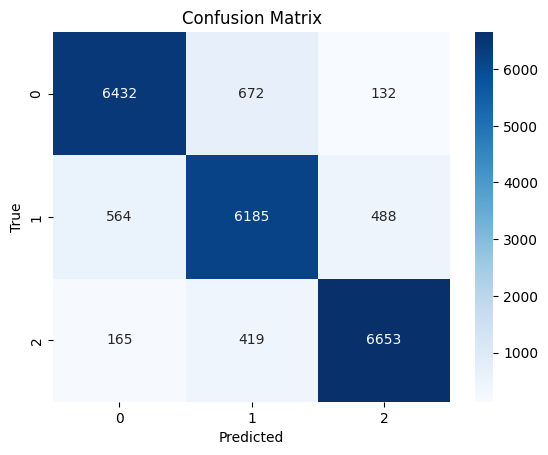

Macro-average F1 Score: 0.8876271693948641


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_hat_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(n_classes), yticklabels=range(n_classes))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# F1 Score (Macro average)
f1_macro = f1_score(y_test, y_hat_classes, average='macro')
print(f'Macro-average F1 Score: {f1_macro}')

**Insights**

Class 0 (Top Row)

- True Positives (Correctly Predicted as 0): 6432
- False Negatives (Misclassified as 1 or 2): 804
  - Misclassified as 1: 672
  - Misclassified as 2: 132
    
- Key Observations:
  - Most predictions for Class 0 are correct.
  - The majority of errors occur when Class 0 is misclassified as Class 1, which suggests some overlap or confusion between these two classes in the model.

Class 1 (Middle Row)
- True Positives (Correctly Predicted as 1): 6185
- False Negatives (Misclassified as 0 or 2): 1052
  - Misclassified as 0: 564
  - Misclassified as 2: 488
- Key Observations:
  - While the model performs well on Class 1, there is noticeable confusion with Class 0 (564 cases) and Class 2 (488 cases).
  - This aligns with the slightly lower metrics for Class 1 (as observed in the classification report from your earlier screenshot).

Class 2 (Bottom Row)
- True Positives (Correctly Predicted as 2): 6653
- False Negatives (Misclassified as 0 or 1): 584
  - Misclassified as 0: 165
  - Misclassified as 1: 419
- Key Observations:
  - Class 2 has the least misclassifications overall, indicating that the model handles this class well.
  - The main source of error is misclassifying Class 2 as Class 1.

Macro-Average F1-Score
- Value: 0.8876
- Interpretation:
  - This score reflects a balanced performance across all classes, taking into account precision and recall equally for each class.
  - The model achieves a strong overall F1-score, but there’s room for slight improvement, particularly for Class 1.

Error Analysis
- Confusion Between Classes 0 and 1:
  - Class 0 is often confused with Class 1 (672 instances).
  - Class 1 is frequently misclassified as Class 0 (564 instances). This suggests shared features or overlapping boundaries in the data between these two classes.

- Confusion Between Classes 1 and 2:
  - Class 1 is misclassified as Class 2 (488 instances).
  - Class 2 is misclassified as Class 1 (419 instances). This indicates a secondary area of confusion that could be addressed similarly to the Class 0 and 1 case.

Key Strengths
- Strong Overall Performance:
  - The diagonal dominance of the confusion matrix shows that most predictions are correct.
  - Class 2, in particular, is predicted very accurately, with minimal misclassifications.
- High F1-Score: The macro-average F1-score of 0.8876 is indicative of a well-performing model.

**Summary**

The model achieves excellent overall performance, but there is noticeable confusion between specific class pairs, particularly Class 0 and Class 1. Addressing these misclassifications with targeted techniques could further boost the model’s effectiveness. The macro-average F1-score of 0.8876 demonstrates that the model is generally robust and balanced.

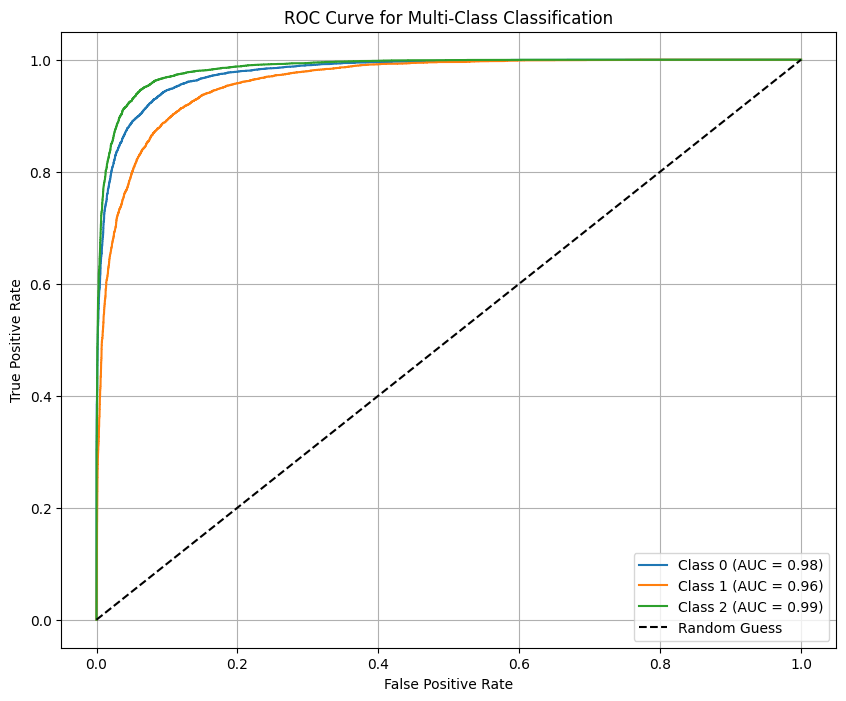

In [ ]:
# Ensure y_test_one_hot and y_hat are correctly formatted
# y_test_one_hot: One-hot encoded true labels
# y_hat: Predicted probabilities for each class

# Initialize a plot for ROC curves
plt.figure(figsize=(10, 8))

# Iterate over each class to plot its ROC curve
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_one_hot[:, i], y_hat[:, i])  # Get FPR and TPR
    roc_auc = auc(fpr, tpr)  # Calculate AUC
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')  # Plot each curve

# Plot the diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')

# Add labels, title, and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid()
plt.show()

**Key Observations**
1. **Overall Shape**:
   - All three curves (Classes 0, 1, and 2) are much closer to the top-left corner, indicating excellent classification performance. This means the model achieves a high TPR while maintaining a low FPR for each class.

2. **AUC Scores**:
   - **Class 0 (Blue Line)**: AUC = 0.98
     - This indicates that the model distinguishes Class 0 very well from the other classes.
   - **Class 1 (Orange Line)**: AUC = 0.96
     - Class 1 has a slightly lower AUC than the others, which aligns with the confusion matrix and classification report where Class 1 had the most errors (misclassified as Class 0 or Class 2).
   - **Class 2 (Green Line)**: AUC = 0.99
     - Class 2 achieves the highest AUC, indicating it is the easiest class for the model to identify.

3. **Random Guess Baseline (Black Dashed Line)**:
   - The dashed line represents the performance of a random classifier with an AUC of 0.5. All three curves are far above this baseline, confirming that the model significantly outperforms random guessing.


**Class-Level Insights**
1. **Class 0**:
   - Excellent discrimination between Class 0 and the other two classes (AUC = 0.98).
   - Minimal overlap with false positives, as indicated by the curve hugging the top-left corner.

2. **Class 1**:
   - AUC = 0.96, slightly lower than Class 0 and Class 2. This is consistent with the confusion matrix, where Class 1 exhibited more misclassifications.
   - The model struggles slightly more with distinguishing Class 1 from Classes 0 and 2 compared to the other classes.

3. **Class 2**:
   - AUC = 0.99, indicating near-perfect separation from other classes.
   - Consistent with the confusion matrix and classification report, where Class 2 had the fewest misclassifications.

**Model Strengths**
- **High Overall AUC**:
  - All classes have AUC values above 0.95, indicating that the model performs exceptionally well across all classes.
- **Good Class Balance**:
  - While Class 1 has a slightly lower AUC, it is still very high, demonstrating that the model is fairly balanced across the three classes.

**Summary**

This ROC analysis confirms the model's strong performance, with excellent AUC scores for all classes (0.96–0.99). Class 1 shows slightly weaker performance relative to Classes 0 and 2, but the difference is minor. To further improve, focus on understanding why Class 1 is more prone to misclassification and fine-tune the model accordingly.

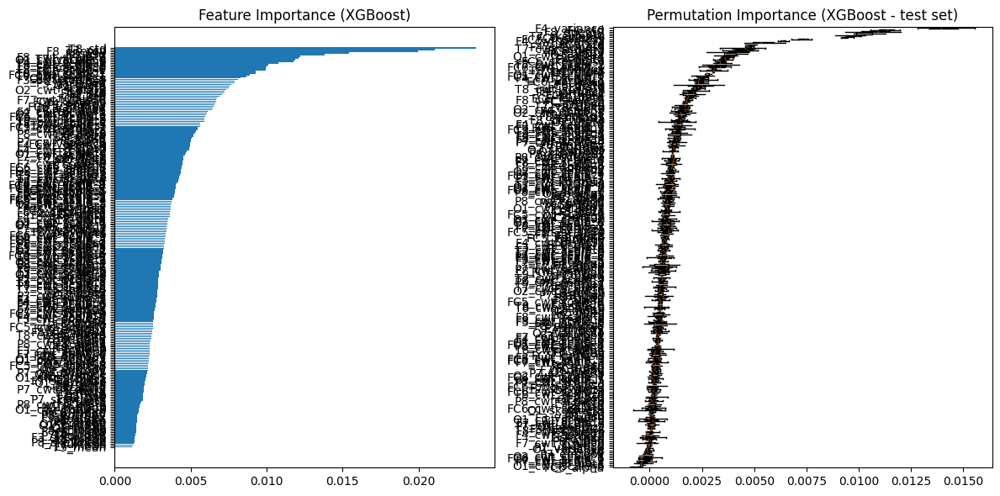

In [ ]:
fig = plt.figure(figsize=(12, 6))

# Feature Importance (using XGBoost's built-in feature importance)
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5

plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(data.columns.drop('state'))[sorted_idx])  # Replace with your feature names
plt.title("Feature Importance (XGBoost)")

# Permutation Importance
result = permutation_importance(
    model, X_test, y_test, n_repeats=3, random_state=42, n_jobs=3
)
sorted_idx = result.importances_mean.argsort()

plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(data.columns.drop('state'))[sorted_idx],  # Replace with your feature names
)
plt.title("Permutation Importance (XGBoost - test set)")

fig.tight_layout()
plt.show()

**Left Panel: Feature Importance (XGBoost)**
**Insights**:
   - The importance is skewed: A few features at the top have much higher importance, while many have negligible contributions.
   - This implies the model relies heavily on a small subset of features, which dominate the decision-making process.


**Right Panel: Permutation Importance (Test Set)**
1. **Interpretation**:
   - Permutation Importance evaluates the effect of randomly shuffling a feature's values on the model's performance.
   - Features that cause significant drops in performance when shuffled are more important.
   - Error bars represent variability in importance across multiple permutations or cross-validation folds.

2. **Insights**:
   - The importance distribution is narrower compared to the XGBoost-calculated importance, suggesting that while a few features are still more important, the relative contributions of other features are more evenly spread.
   - The error bars are small for most features, indicating consistent behavior across different data subsets.

3. **Comparison with Left Panel**:
   - Permutation Importance offers a more robust, model-agnostic view compared to the intrinsic XGBoost importance.
   - This might help identify features that are less biased by the tree-building process.


**General Observations**
1. **Feature Redundancy**:
   - If features ranked low in permutation importance appear high in the XGBoost chart, it could indicate redundancy (e.g., correlated features). You may want to investigate these further.

2. **Clarity of Feature Names**:
   - The cluttered Y-axis in both plots makes it hard to extract actionable information. Re-plotting with fewer top features or separating them into groups could improve interpretability.

**Summary**
- The left panel shows feature importance directly from the XGBoost model, highlighting a few dominant features.
- The right panel uses permutation importance, providing a more data-driven, robust assessment of feature contributions.
- To refine the analysis, focus on the top features in both charts, reduce dimensionality by excluding unimportant ones, and consider improving the plot’s readability.

For more clarity of the feature names, the top 20 important features and the top 20 features that have the most permutation importance are printed below.

In [ ]:
# Extract top 20 features from XGBoost's built-in importance
sorted_idx_xgb = np.argsort(feature_importance)[-20:]  # Indices of the top 20 features
top_features_xgb = np.array(data.columns.drop('state'))[sorted_idx_xgb]
top_importance_xgb = feature_importance[sorted_idx_xgb]

print("Top 20 Features (XGBoost built-in importance):")
for feature, importance in zip(top_features_xgb[::-1], top_importance_xgb[::-1]):
    print(f"{feature}: {importance}")

# Extract top 20 features from Permutation Importance
sorted_idx_perm = result.importances_mean.argsort()[-20:]
top_features_perm = np.array(data.columns.drop('state'))[sorted_idx_perm]
top_importance_perm = result.importances_mean[sorted_idx_perm]

print("\nTop 20 Features (Permutation Importance):")
for feature, importance in zip(top_features_perm[::-1], top_importance_perm[::-1]):
    print(f"{feature}: {importance}")

Top 20 Features (XGBoost built-in importance):
T8_std: 0.02379298210144043
T7_psd: 0.02109503746032715
F8_energy: 0.019977401942014694
F8_psd: 0.015430730767548084
F7_std: 0.013842443935573101
F8_cwt_scale_2: 0.0122184744104743
T7_variance: 0.012117554433643818
O1_cwt_scale_8: 0.011904779821634293
O1_alpha: 0.011769791133701801
F4_cwt_scale_1: 0.010793312452733517
T8_cwt_scale_8: 0.010097548365592957
F3_psd: 0.010011729784309864
F8_variance: 0.009964600205421448
F8_cwt_scale_1: 0.009944439865648746
FC6_energy: 0.009299888275563717
T8_cwt_scale_1: 0.009297393262386322
FC6_cwt_scale_1: 0.008903694339096546
T7_cwt_scale_1: 0.008655726909637451
O1_skewness: 0.008300081826746464
F3_cwt_scale_1: 0.008113120682537556

Top 20 Features (Permutation Importance):
F4_variance: 0.014110241056348912
F4_std: 0.011300475971134741
F8_energy: 0.010763089206203022
T8_std: 0.010348533701827164
T7_skewness: 0.009703669583909114
FC6_energy: 0.009365883617380666
FC5_skewness: 0.007323813910640298
F4_cwt_scal

Key Observations
Common Features Across Both Rankings:
- Some features are important in both rankings, indicating they are critical for the model:
  - F8_energy
  - T8_std
  - F4_cwt_scale_1
- These features have consistently high importance in both the XGBoost and permutation-based methods.

Differences in Rankings:
- Features prioritized by XGBoost Built-in Importance: T7_psd, F7_std, T7_variance, O1_cwt_scale_8, etc., appear high in the XGBoost ranking but do not show up as strongly in permutation importance. This might indicate they are structurally significant in the tree-building process (e.g., splits or gains) but have less impact on overall model performance.

Features prioritized by Permutation Importance:
- F4_variance, F4_std, F4_skewness, FC6_delta, etc., are highly ranked in permutation importance but are less prominent in XGBoost's intrinsic ranking. These features likely have strong predictive power in the dataset, even if not frequently used by the model’s tree structure.